In [3]:
!pip install rdp

  Preparing metadata (setup.py) ... done
  Created wheel for rdp: filename=rdp-0.8-py3-none-any.whl size=4585 sha256=edb470da54e511aa37f00d79d7713b6efa097e9087ce0c8215b721ff11220251
  Stored in directory: /root/.cache/pip/wheels/40/25/67/b7065f31a9d5388f822ed08341da456e2dd047a1dbae2cf62a
Successfully built rdp


In [4]:
!pip install simplification

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 747.0/747.0 kB 9.9 MB/s eta 0:00:00


In [5]:
pip install --upgrade numpy scipy scikit-learn


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 39.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.6/37.6 MB 17.7 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: scipy
    Found existing installation: scipy 1.14.1
    Uninstalling scipy-1.14.1:
      Successfully uninstalled scipy-1.14.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 2.2.4 which is incompatible.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.2.4 which is incompatible.


Processing Tolerance: 5e-05


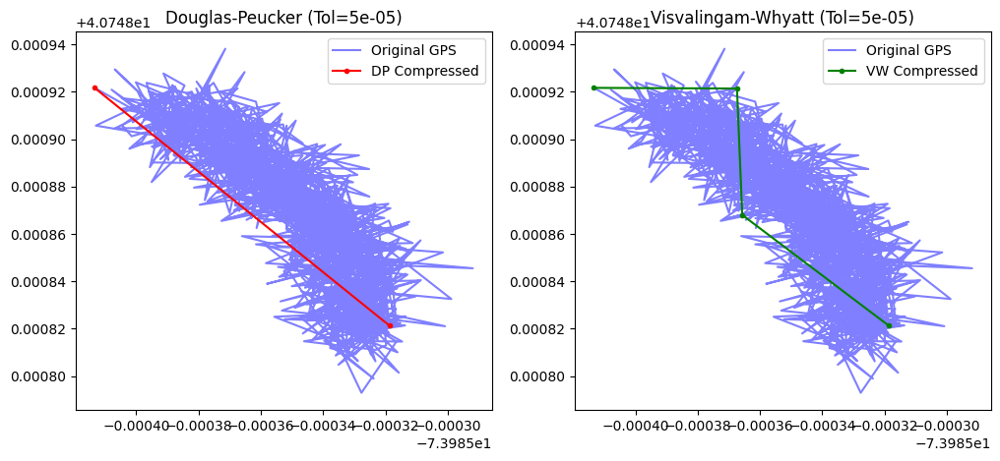

Processing Tolerance: 0.0001


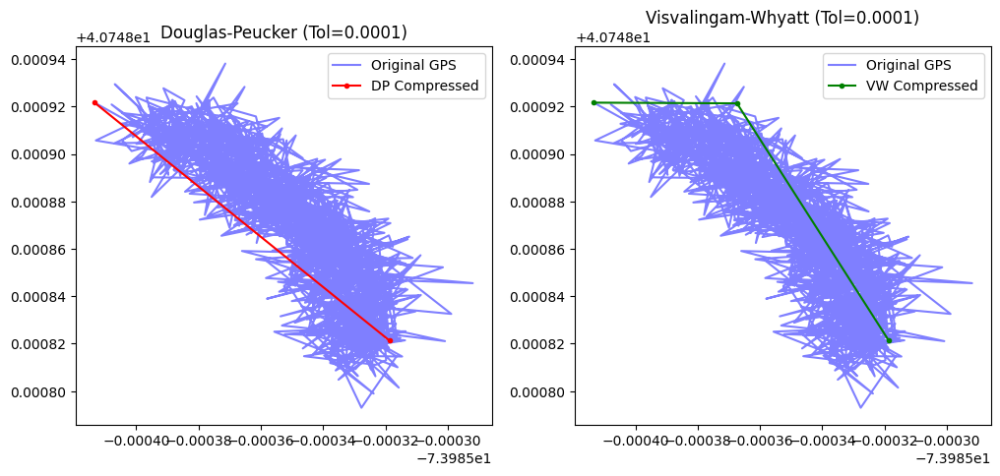

Processing Tolerance: 0.0002


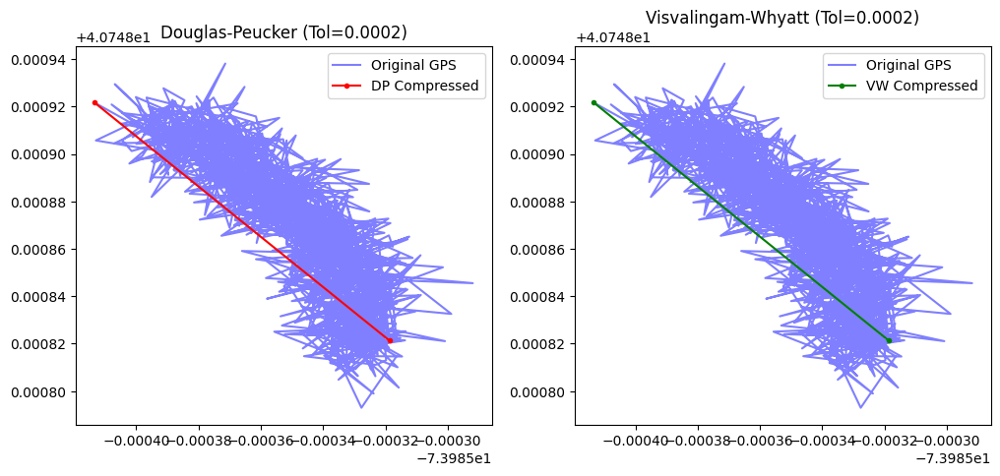

Processing Tolerance: 0.0004


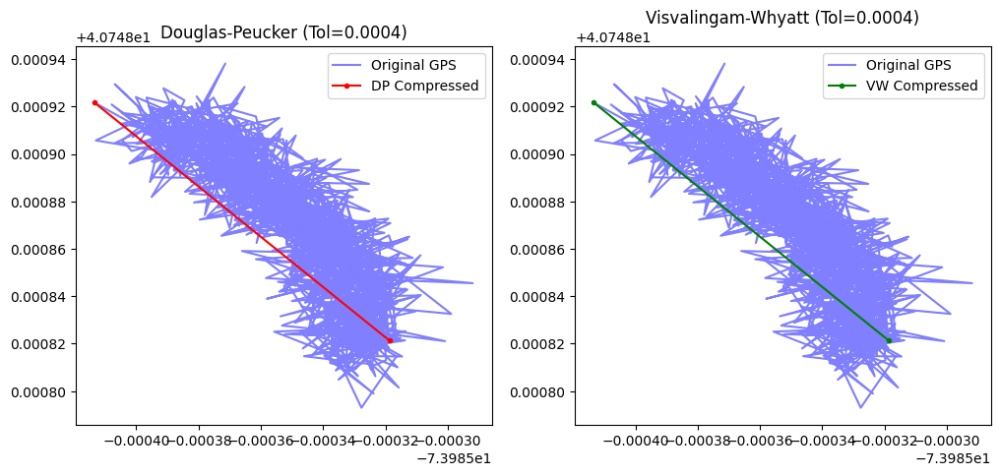

Processing Tolerance: 0.0006


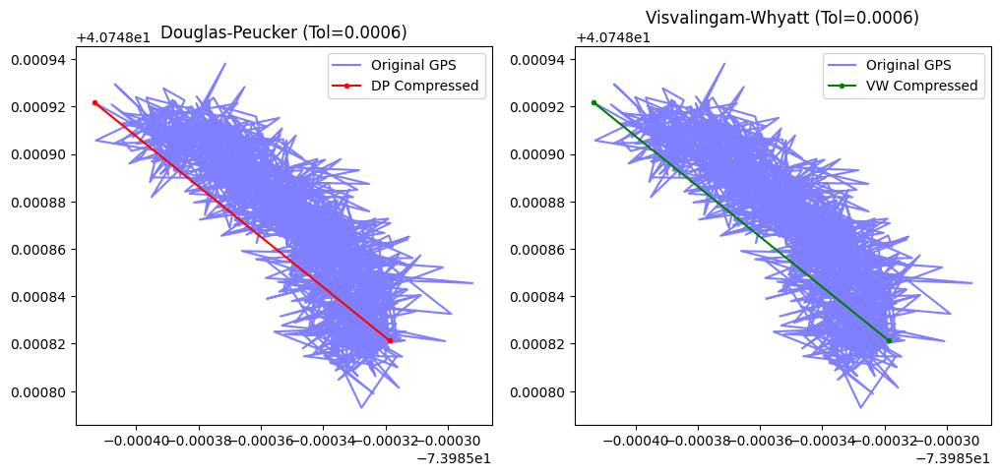

Processing Tolerance: 0.0008


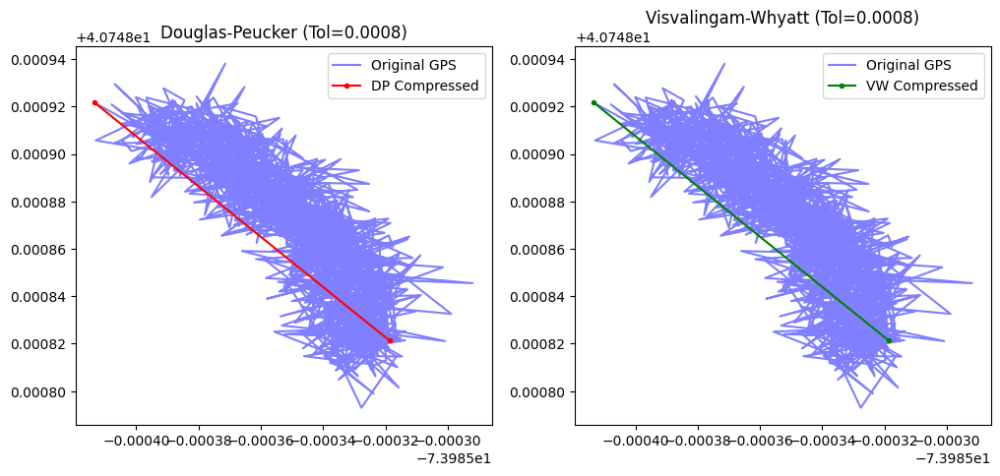

Processing Tolerance: 0.001


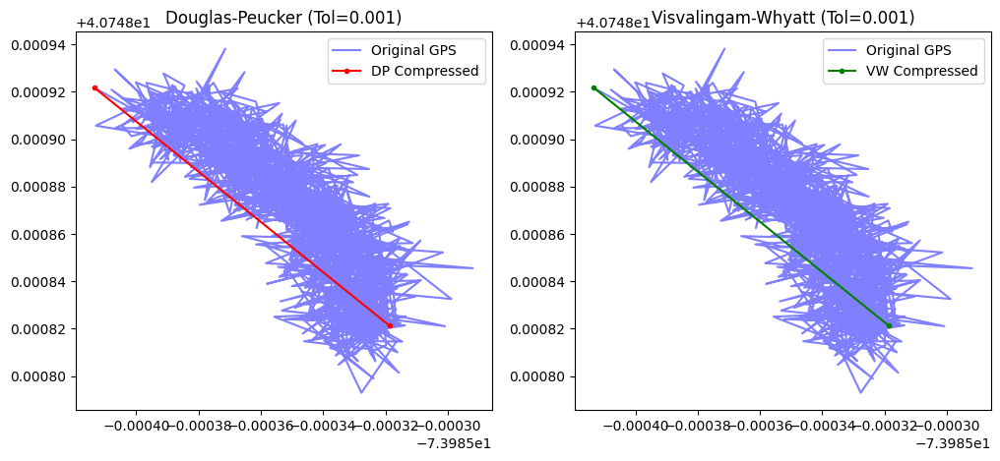

   Tolerance  DP Points  DP Time (s)  DP Hausdorff        DP MSE  VW Points  \
0    0.00005          2     0.083578      0.000078  4.566523e-09          4   
1    0.00010          2     0.117057      0.000078  4.566523e-09          3   
2    0.00020          2     0.097316      0.000078  4.566523e-09          2   
3    0.00040          2     0.089357      0.000078  4.566523e-09          2   
4    0.00060          2     0.088120      0.000078  4.566523e-09          2   
5    0.00080          2     0.184997      0.000078  4.566523e-09          2   
6    0.00100          2     0.143294      0.000078  4.566523e-09          2   

   VW Time (s)  VW Hausdorff        VW MSE  
0     0.002284      0.000047  4.458972e-09  
1     0.003815      0.000061  4.985181e-09  
2     0.001421      0.000078  4.566523e-09  
3     0.001641      0.000078  4.566523e-09  
4     0.001320      0.000078  4.566523e-09  
5     0.002160      0.000078  4.566523e-09  
6     0.003638      0.000078  4.566523e-09  
IMU Axi

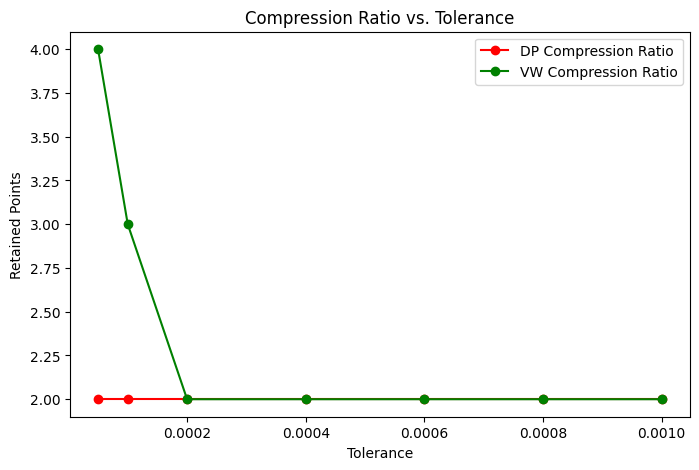

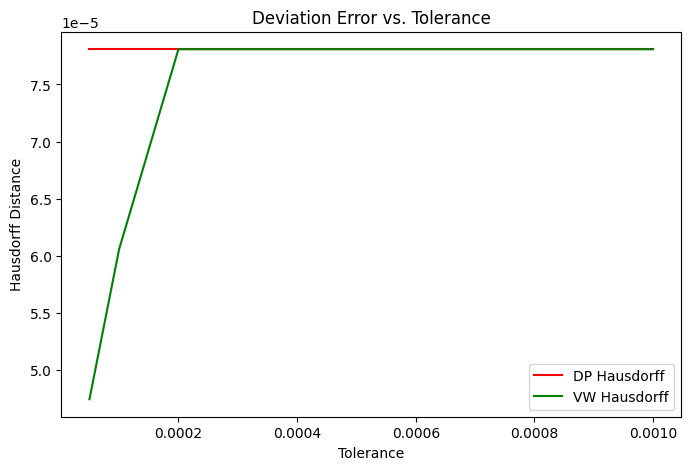


✅ All processing complete! Results saved successfully.


In [6]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
from rdp import rdp  # Douglas-Peucker
from simplification.cutil import simplify_coords_vw  # Visvalingam-Whyatt
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error


# Load the Simulated UAV Data
file_path = "simulated_uav_data2.csv"
df = pd.read_csv(file_path)

# Extract relevant columns
latitudes = df["latitudes"].values
longitudes = df["longitudes"].values
altitude = df["altitudes"].values
ax, ay, az = df["ax"].values, df["ay"].values, df["az"].values  # IMU acceleration data

# Convert GPS to NumPy array for processing
gps_points = np.column_stack((latitudes, longitudes))

### 🟢 STEP 1: GPS COMPRESSION (Douglas-Peucker & Visvalingam-Whyatt) ###

def simplify_vw(points, tolerance):
    """ Apply Visvalingam-Whyatt compression with adaptive tolerance. """
    vw_tolerance = tolerance * np.ptp(points, axis=0).max() * 0.1
    return np.array(simplify_coords_vw(points.tolist(), vw_tolerance))

def hausdorff_distance(A, B):
    """ Computes Hausdorff distance to measure deviation. """
    return max(directed_hausdorff(A, B)[0], directed_hausdorff(B, A)[0])

def evaluate_compression(original, compressed):
    """ Computes Mean Squared Error (MSE) to assess compression accuracy. """
    return mean_squared_error(original[:len(compressed)], compressed)

# Set tolerance values for testing
TOLERANCES = [0.00005, 0.0001, 0.0002, 0.0004, 0.0006, 0.0008, 0.001]

compression_results = []

# Apply compression algorithms
for tol in TOLERANCES:
    print(f"Processing Tolerance: {tol}")

    # Douglas-Peucker Simplification
    start_dp = time.time()
    dp_compressed = np.array(rdp(gps_points, epsilon=tol))
    dp_time = time.time() - start_dp
    dp_points = len(dp_compressed)
    dp_hausdorff = hausdorff_distance(gps_points, dp_compressed)
    dp_mse = evaluate_compression(gps_points, dp_compressed)

    # Visvalingam-Whyatt Simplification
    start_vw = time.time()
    vw_compressed = simplify_vw(gps_points, tol)
    vw_time = time.time() - start_vw
    vw_points = len(vw_compressed)
    vw_hausdorff = hausdorff_distance(gps_points, vw_compressed)
    vw_mse = evaluate_compression(gps_points, vw_compressed)

    compression_results.append((tol, dp_points, dp_time, dp_hausdorff, dp_mse,
                                vw_points, vw_time, vw_hausdorff, vw_mse))

    # Visualization of Compression Results
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Original Data
    axes[0].plot(gps_points[:, 1], gps_points[:, 0], 'b-', alpha=0.5, label="Original GPS")
    axes[1].plot(gps_points[:, 1], gps_points[:, 0], 'b-', alpha=0.5, label="Original GPS")

    # Douglas-Peucker Visualization
    axes[0].plot(dp_compressed[:, 1], dp_compressed[:, 0], 'ro-', markersize=3, label="DP Compressed")
    axes[0].set_title(f"Douglas-Peucker (Tol={tol})")
    axes[0].legend()

    # Visvalingam-Whyatt Visualization
    axes[1].plot(vw_compressed[:, 1], vw_compressed[:, 0], 'go-', markersize=3, label="VW Compressed")
    axes[1].set_title(f"Visvalingam-Whyatt (Tol={tol})")
    axes[1].legend()

    plt.show()

# Convert results to DataFrame
df_compression_results = pd.DataFrame(compression_results,
                                      columns=["Tolerance", "DP Points", "DP Time (s)", "DP Hausdorff", "DP MSE",
                                               "VW Points", "VW Time (s)", "VW Hausdorff", "VW MSE"])
print(df_compression_results)

# Save compression results
df_compression_results.to_csv("gps_compression_results.csv", index=False)

### 🟢 STEP 2: IMU COMPRESSION USING RUN-LENGTH ENCODING ###

def run_length_encode(data):
    """ Applies Run-Length Encoding (RLE) to IMU data. """
    encoded = []
    prev_value = data[0]
    count = 1

    for value in data[1:]:
        if value == prev_value:
            count += 1
        else:
            encoded.append((prev_value, count))
            prev_value = value
            count = 1

    encoded.append((prev_value, count))
    return encoded

# Process IMU compression for all axes
imu_axes = [ax, ay, az]
imu_compressed_sizes = []

for i, imu_data in enumerate(imu_axes):
    compressed_data = run_length_encode(imu_data)
    original_size = len(imu_data) * 4 / 1024  # KB
    compressed_size = len(compressed_data) * 4 / 1024  # KB
    imu_compressed_sizes.append((original_size, compressed_size))

    print(f"IMU Axis {i+1} Compression: {original_size:.2f} KB -> {compressed_size:.2f} KB")

# Save final IMU compression results
df_imu_results = pd.DataFrame(imu_compressed_sizes, columns=["Original Size (KB)", "Compressed Size (KB)"])
df_imu_results.to_csv("imu_compression_results.csv", index=False)

### 🟢 STEP 3: FINAL VISUALIZATION OF RESULTS ###

# Plot Compression Ratio vs Tolerance
plt.figure(figsize=(8, 5))
plt.plot(df_compression_results["Tolerance"], df_compression_results["DP Points"], 'ro-', label="DP Compression Ratio")
plt.plot(df_compression_results["Tolerance"], df_compression_results["VW Points"], 'go-', label="VW Compression Ratio")
plt.xlabel("Tolerance")
plt.ylabel("Retained Points")
plt.legend()
plt.title("Compression Ratio vs. Tolerance")
plt.show()

# Plot Hausdorff Distance for Deviation Analysis
plt.figure(figsize=(8, 5))
plt.plot(df_compression_results["Tolerance"], df_compression_results["DP Hausdorff"], 'r-', label="DP Hausdorff")
plt.plot(df_compression_results["Tolerance"], df_compression_results["VW Hausdorff"], 'g-', label="VW Hausdorff")
plt.xlabel("Tolerance")
plt.ylabel("Hausdorff Distance")
plt.legend()
plt.title("Deviation Error vs. Tolerance")
plt.show()

print("\n✅ All processing complete! Results saved successfully.")


Processing Old Dataset...
Processing New Dataset...
  Dataset  GPS Original Size (KB)  GPS Compressed Size (KB)  \
0     Old                9.375000                  6.501953   
1     New               18.765625                 12.789062   

   GPS Compression Ratio (%)  IMU Original Size (KB)  \
0                  30.645833               14.062500   
1                  31.848460               28.148438   

   IMU Compressed Size (KB)  IMU Compression Ratio (%)  
0                 13.283203                   5.541667  
1                 26.036133                   7.504163  


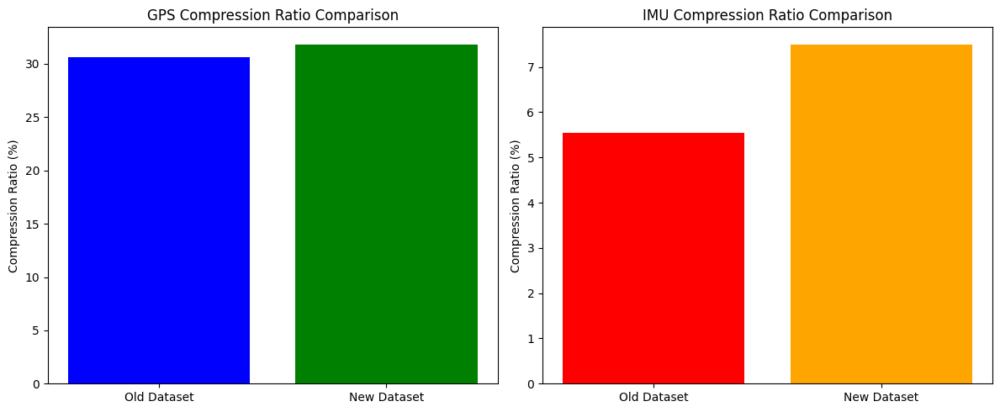

In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import zlib
import time
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error

# Load datasets
file_old = "simulated_uav_data_new.csv"
file_new = "simulated_uav_data2.csv"

df_old = pd.read_csv(file_old)
df_new = pd.read_csv(file_new)

# Function for delta encoding
def delta_encode(data):
    return np.diff(data, prepend=data[0])

# Function for run-length encoding (RLE)
def run_length_encode(data):
    encoded_values = []
    encoded_counts = []
    prev_value = data[0]
    count = 1

    for value in data[1:]:
        if value == prev_value:
            count += 1
        else:
            encoded_values.append(prev_value)
            encoded_counts.append(count)
            prev_value = value
            count = 1
    encoded_values.append(prev_value)
    encoded_counts.append(count)

    return encoded_values, encoded_counts

# Function to calculate compression ratio
def compression_ratio(original, compressed):
    return 100 * (1 - (compressed / original))

# Process GPS data
def process_gps(df):
    lat_deltas = delta_encode(df["latitudes"].values)
    lon_deltas = delta_encode(df["longitudes"].values)

    # Compress using zlib (as an approximation for Huffman)
    lat_compressed = zlib.compress(lat_deltas.tobytes())
    lon_compressed = zlib.compress(lon_deltas.tobytes())

    original_size = df["latitudes"].values.nbytes + df["longitudes"].values.nbytes
    compressed_size = len(lat_compressed) + len(lon_compressed)

    return original_size, compressed_size, compression_ratio(original_size, compressed_size)

# Process IMU data
def process_imu(df):
    # Updated IMU axes to match dataframe column names
    imu_axes = ["ax", "ay", "az"]
    original_size = 0
    compressed_size = 0
    for axis in imu_axes:
        imu_data = df[axis].values
        original_size += imu_data.nbytes
        encoded_values, encoded_counts = run_length_encode(imu_data)

        # Compress using zlib
        imu_compressed = zlib.compress(np.array(encoded_values).tobytes() + np.array(encoded_counts).tobytes())
        compressed_size += len(imu_compressed)

    return original_size, compressed_size, compression_ratio(original_size, compressed_size)

# Compare both datasets
def compare_datasets(df_old, df_new):
    print("Processing Old Dataset...")
    gps_old_orig, gps_old_comp, gps_old_ratio = process_gps(df_old)
    imu_old_orig, imu_old_comp, imu_old_ratio = process_imu(df_old)

    print("Processing New Dataset...")
    gps_new_orig, gps_new_comp, gps_new_ratio = process_gps(df_new)
    imu_new_orig, imu_new_comp, imu_new_ratio = process_imu(df_new)

    # Summary
    summary_df = pd.DataFrame({
        "Dataset": ["Old", "New"],
        "GPS Original Size (KB)": [gps_old_orig / 1024, gps_new_orig / 1024],
        "GPS Compressed Size (KB)": [gps_old_comp / 1024, gps_new_comp / 1024],
        "GPS Compression Ratio (%)": [gps_old_ratio, gps_new_ratio],
        "IMU Original Size (KB)": [imu_old_orig / 1024, imu_new_orig / 1024],
        "IMU Compressed Size (KB)": [imu_old_comp / 1024, imu_new_comp / 1024],
        "IMU Compression Ratio (%)": [imu_old_ratio, imu_new_ratio]
    })

    print(summary_df)
    return summary_df

# Run comparison
summary_results = compare_datasets(df_old, df_new)

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# GPS Compression
axes[0].bar(["Old Dataset", "New Dataset"], summary_results["GPS Compression Ratio (%)"], color=['blue', 'green'])
axes[0].set_title("GPS Compression Ratio Comparison")
axes[0].set_ylabel("Compression Ratio (%)")

# IMU Compression
axes[1].bar(["Old Dataset", "New Dataset"], summary_results["IMU Compression Ratio (%)"], color=['red', 'orange'])
axes[1].set_title("IMU Compression Ratio Comparison")
axes[1].set_ylabel("Compression Ratio (%)")

plt.tight_layout()
plt.show()


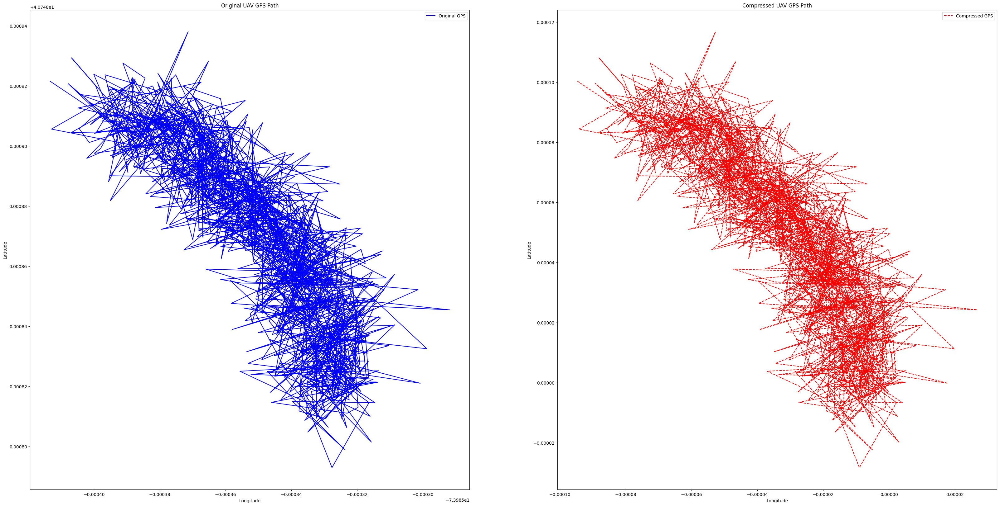

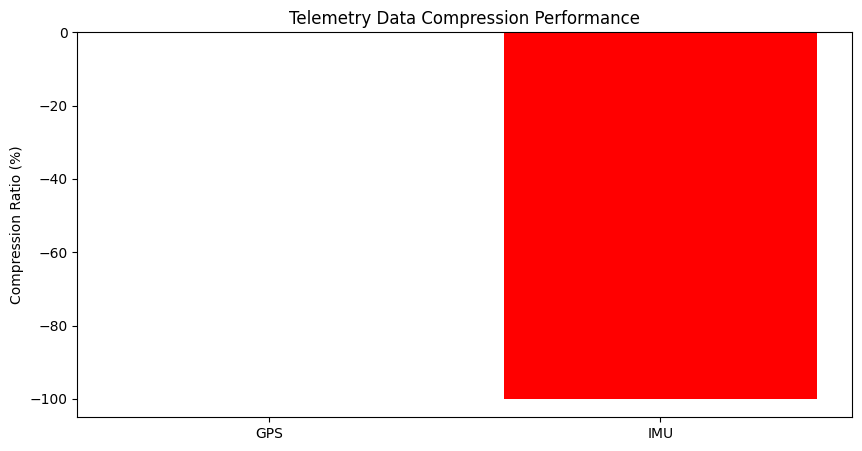

Original GPS Data Size: 28.15 KB
Compressed GPS Data Size: 28.15 KB
GPS Compression Ratio: 0.00%
Original IMU Data Size: 28.15 KB
Compressed IMU Data Size: 56.30 KB
IMU Compression Ratio: -100.00%


In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error

# Load dataset
file_path = "simulated_uav_data2.csv"  # Ensure correct dataset

df = pd.read_csv(file_path)

# Extract telemetry data
time = df["t"].values
latitudes = df["latitudes"].values
longitudes = df["longitudes"].values
altitudes = df["altitudes"].values
ax = df["ax"].values
ay = df["ay"].values
az = df["az"].values

# Delta Encoding for GPS Compression
def delta_encoding(data):
    return np.diff(data, prepend=data[0])

gps_deltas = np.column_stack((delta_encoding(latitudes), delta_encoding(longitudes), delta_encoding(altitudes)))
compressed_gps_size = gps_deltas.nbytes / 1024  # Convert to KB

# Run-Length Encoding for IMU Compression
def run_length_encoding(data):
    values, counts = np.unique(data, return_counts=True)
    return values, counts

imu_ax_values, imu_ax_counts = run_length_encoding(ax)
imu_ay_values, imu_ay_counts = run_length_encoding(ay)
imu_az_values, imu_az_counts = run_length_encoding(az)

compressed_imu_size = (
    imu_ax_values.nbytes + imu_ax_counts.nbytes +
    imu_ay_values.nbytes + imu_ay_counts.nbytes +
    imu_az_values.nbytes + imu_az_counts.nbytes
) / 1024  # Convert to KB

# Calculate Compression Ratios
original_gps_size = df[["latitudes", "longitudes", "altitudes" ]].values.nbytes / 1024
original_imu_size = df[["ax", "ay", "az"]].values.nbytes / 1024

gps_compression_ratio = (1 - compressed_gps_size / original_gps_size) * 100
imu_compression_ratio = (1 - compressed_imu_size / original_imu_size) * 100

# Visualization: Original vs. Compressed GPS
plt.figure(figsize=(40, 20))
plt.subplot(1, 2, 1)
plt.plot(longitudes, latitudes, 'b-', label='Original GPS')
plt.title("Original UAV GPS Path")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()

plt.subplot(1, 2, 2)
compressed_latitudes = np.cumsum(gps_deltas[:, 0])
compressed_longitudes = np.cumsum(gps_deltas[:, 1])
plt.plot(compressed_longitudes, compressed_latitudes, 'r--', label='Compressed GPS')
plt.title("Compressed UAV GPS Path")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.show()

# Visualization: Compression Ratio Comparison
plt.figure(figsize=(10, 5))
plt.bar(["GPS", "IMU"], [gps_compression_ratio, imu_compression_ratio], color=['blue', 'red'])
plt.ylabel("Compression Ratio (%)")
plt.title("Telemetry Data Compression Performance")
plt.show()

# Print Results
print(f"Original GPS Data Size: {original_gps_size:.2f} KB")
print(f"Compressed GPS Data Size: {compressed_gps_size:.2f} KB")
print(f"GPS Compression Ratio: {gps_compression_ratio:.2f}%")
print(f"Original IMU Data Size: {original_imu_size:.2f} KB")
print(f"Compressed IMU Data Size: {compressed_imu_size:.2f} KB")
print(f"IMU Compression Ratio: {imu_compression_ratio:.2f}%")


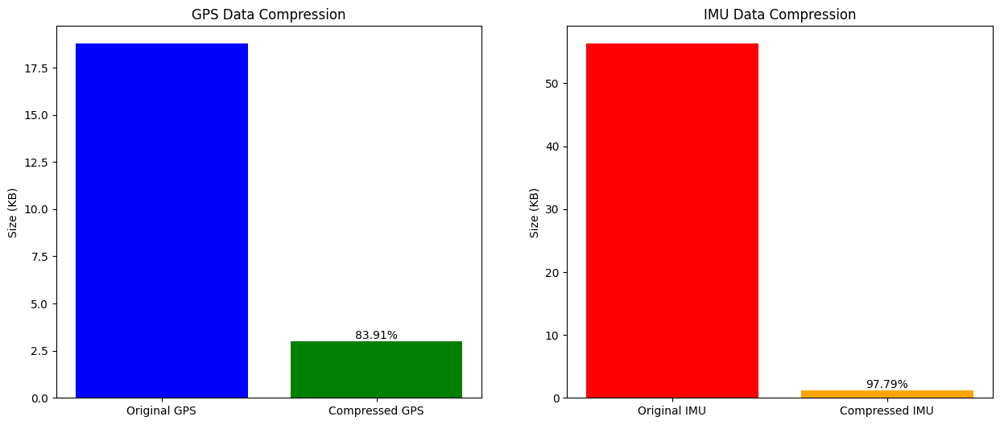

Original GPS Data Size: 18.77 KB
Compressed GPS Data Size: 3.02 KB
GPS Compression Ratio: 83.91%
Original IMU Data Size: 56.30 KB
Compressed IMU Data Size: 1.24 KB
IMU Compression Ratio: 97.79%


In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import heapq
import json
from collections import Counter

# Load dataset
file_path = "simulated_uav_data2.csv"
df = pd.read_csv(file_path)

# Extract GPS and IMU data
latitudes = df["latitudes"].values
longitudes = df["longitudes"].values
altitudes = df["altitudes"].values
imu_data = df[["ax", "ay", "az", "gx", "gy", "gz"]].values

### GPS Compression (Delta Encoding + Huffman Coding) ###
def delta_encode(data):
    return np.diff(data, prepend=data[0])

def build_huffman_tree(freqs):
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return dict(sorted(heap[0][1:], key=lambda p: (len(p[-1]), p)))

def huffman_encode(data):
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[value] for value in data)
    return encoded_data, huffman_tree

delta_lat = delta_encode(latitudes)
delta_lon = delta_encode(longitudes)
encoded_lat, lat_tree = huffman_encode(delta_lat)
encoded_lon, lon_tree = huffman_encode(delta_lon)

### IMU Compression (Quantization + Huffman Coding) ###
def quantize(data, levels=16):
    min_val, max_val = np.min(data), np.max(data)
    step = (max_val - min_val) / levels
    quantized = np.round((data - min_val) / step).astype(int)
    return quantized, min_val, step

def quantized_decompress(quantized, min_val, step):
    return quantized * step + min_val

quantized_imu, min_val, step = quantize(imu_data.flatten())
encoded_imu, imu_tree = huffman_encode(quantized_imu)

### Compression Ratio Calculation ###
original_gps_size = (latitudes.nbytes + longitudes.nbytes) / 1024  # KB
compressed_gps_size = (len(encoded_lat) + len(encoded_lon)) / 8192  # KB (bits to KB)
gps_compression_ratio = (1 - (compressed_gps_size / original_gps_size)) * 100

original_imu_size = imu_data.nbytes / 1024  # KB
compressed_imu_size = len(encoded_imu) / 8192  # KB
imu_compression_ratio = (1 - (compressed_imu_size / original_imu_size)) * 100

### Visualization ###
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# GPS Compression Visualization
axes[0].bar(["Original GPS", "Compressed GPS"], [original_gps_size, compressed_gps_size], color=['blue', 'green'])
axes[0].set_ylabel("Size (KB)")
axes[0].set_title("GPS Data Compression")
axes[0].text(1, compressed_gps_size, f"{gps_compression_ratio:.2f}%", ha='center', va='bottom')

# IMU Compression Visualization
axes[1].bar(["Original IMU", "Compressed IMU"], [original_imu_size, compressed_imu_size], color=['red', 'orange'])
axes[1].set_ylabel("Size (KB)")
axes[1].set_title("IMU Data Compression")
axes[1].text(1, compressed_imu_size, f"{imu_compression_ratio:.2f}%", ha='center', va='bottom')

plt.show()

### Print Results ###
print(f"Original GPS Data Size: {original_gps_size:.2f} KB")
print(f"Compressed GPS Data Size: {compressed_gps_size:.2f} KB")
print(f"GPS Compression Ratio: {gps_compression_ratio:.2f}%")
print(f"Original IMU Data Size: {original_imu_size:.2f} KB")
print(f"Compressed IMU Data Size: {compressed_imu_size:.2f} KB")
print(f"IMU Compression Ratio: {imu_compression_ratio:.2f}%")

### Save Huffman Trees for Decoding ###
# Convert int64 keys to strings
def convert_keys_to_str(d):
    return {str(k): v for k, v in d.items()}

with open("huffman_trees.json", "w") as f:
    json.dump({
        "lat": convert_keys_to_str(lat_tree),
        "lon": convert_keys_to_str(lon_tree),
        "imu": convert_keys_to_str(imu_tree)
    }, f)




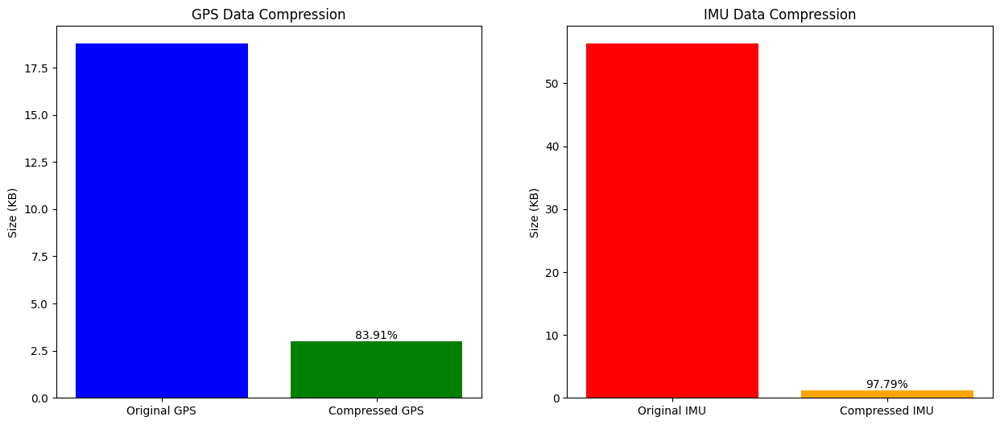

Original GPS Data Size: 18.77 KB
Compressed GPS Data Size: 3.02 KB
GPS Compression Ratio: 83.91%
Original IMU Data Size: 56.30 KB
Compressed IMU Data Size: 1.24 KB
IMU Compression Ratio: 97.79%
GPS MSE: 1660.466439
IMU MSE: 0.045002
Hausdorff Distance (GPS): 40.748821


In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import heapq
import json
from collections import Counter
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error

# Load dataset
file_path = "simulated_uav_data2.csv"
df = pd.read_csv(file_path)

# Extract GPS and IMU data
latitudes = df["latitudes"].values
longitudes = df["longitudes"].values
altitudes = df["altitudes"].values
imu_data = df[["ax", "ay", "az", "gx", "gy", "gz"]].values

### GPS Compression (Delta Encoding + Huffman Coding) ###
def delta_encode(data):
    return np.diff(data, prepend=data[0])

def build_huffman_tree(freqs):
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return {str(pair[0]): pair[1] for pair in heap[0][1:]}  # Convert keys to str

def huffman_encode(data):
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[str(value)] for value in data)
    return encoded_data, huffman_tree

delta_lat = delta_encode(latitudes)
delta_lon = delta_encode(longitudes)
encoded_lat, lat_tree = huffman_encode(delta_lat)
encoded_lon, lon_tree = huffman_encode(delta_lon)

### IMU Compression (Quantization + Huffman Coding) ###
def quantize(data, levels=16):
    min_val, max_val = np.min(data), np.max(data)
    step = (max_val - min_val) / levels
    quantized = np.round((data - min_val) / step).astype(int)
    return quantized, min_val, step

def quantized_decompress(quantized, min_val, step):
    return quantized * step + min_val

quantized_imu, min_val, step = quantize(imu_data.flatten())
encoded_imu, imu_tree = huffman_encode(quantized_imu)

### Compression Ratio Calculation ###
original_gps_size = (latitudes.nbytes + longitudes.nbytes) / 1024  # KB
compressed_gps_size = (len(encoded_lat) + len(encoded_lon)) / 8192  # KB (bits to KB)
gps_compression_ratio = (1 - (compressed_gps_size / original_gps_size)) * 100

original_imu_size = imu_data.nbytes / 1024  # KB
compressed_imu_size = len(encoded_imu) / 8192  # KB
imu_compression_ratio = (1 - (compressed_imu_size / original_imu_size)) * 100

### Error Analysis ###
# MSE for GPS and IMU
reconstructed_gps = np.cumsum(delta_lat)  # Delta decoding
mse_gps = mean_squared_error(latitudes, reconstructed_gps)
mse_imu = mean_squared_error(imu_data.flatten(), quantized_decompress(quantized_imu, min_val, step))

# Hausdorff Distance
hausdorff_gps = directed_hausdorff(np.column_stack((latitudes, longitudes)),
                                   np.column_stack((reconstructed_gps, longitudes)))[0]

### Visualization ###
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# GPS Compression Visualization
axes[0].bar(["Original GPS", "Compressed GPS"], [original_gps_size, compressed_gps_size], color=['blue', 'green'])
axes[0].set_ylabel("Size (KB)")
axes[0].set_title("GPS Data Compression")
axes[0].text(1, compressed_gps_size, f"{gps_compression_ratio:.2f}%", ha='center', va='bottom')

# IMU Compression Visualization
axes[1].bar(["Original IMU", "Compressed IMU"], [original_imu_size, compressed_imu_size], color=['red', 'orange'])
axes[1].set_ylabel("Size (KB)")
axes[1].set_title("IMU Data Compression")
axes[1].text(1, compressed_imu_size, f"{imu_compression_ratio:.2f}%", ha='center', va='bottom')

plt.show()

### Print Results ###
print(f"Original GPS Data Size: {original_gps_size:.2f} KB")
print(f"Compressed GPS Data Size: {compressed_gps_size:.2f} KB")
print(f"GPS Compression Ratio: {gps_compression_ratio:.2f}%")
print(f"Original IMU Data Size: {original_imu_size:.2f} KB")
print(f"Compressed IMU Data Size: {compressed_imu_size:.2f} KB")
print(f"IMU Compression Ratio: {imu_compression_ratio:.2f}%")
print(f"GPS MSE: {mse_gps:.6f}")
print(f"IMU MSE: {mse_imu:.6f}")
print(f"Hausdorff Distance (GPS): {hausdorff_gps:.6f}")

### Save Huffman Trees for Decoding ###
with open("huffman_trees.json", "w") as f:
    json.dump({"lat": lat_tree, "lon": lon_tree, "imu": imu_tree}, f)


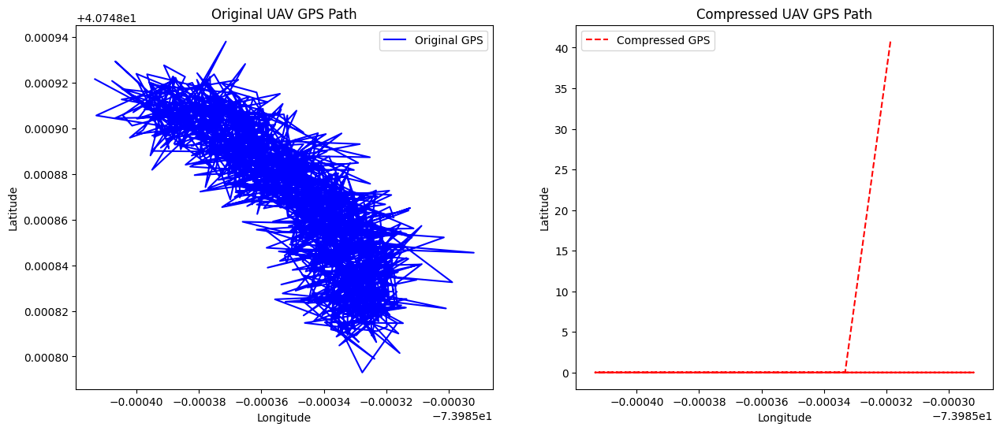

Original GPS Data Size: 18.77 KB
Compressed GPS Data Size: 1.59 KB
GPS Compression Ratio: 91.53%
GPS MSE: 1659.087817
Hausdorff Distance (GPS): 0.000117


In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import heapq
import json
from collections import Counter
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error

# Load dataset
file_path = "simulated_uav_data2.csv"
df = pd.read_csv(file_path)

# Extract GPS data
latitudes = df["latitudes"].values
longitudes = df["longitudes"].values

### Step 1: Adaptive Delta Encoding ###
def adaptive_delta_encode(data, threshold=0.00001):
    """Uses adaptive delta encoding to preserve significant changes."""
    encoded = [data[0]]  # Store first value as is
    for i in range(1, len(data)):
        delta = data[i] - data[i-1]
        if abs(delta) > threshold:  # If change is significant, store it
            encoded.append(delta)
        else:
            encoded.append(0)  # If insignificant, store 0 to maintain structure
    return np.array(encoded)

delta_lat = adaptive_delta_encode(latitudes, threshold=0.00001)
delta_lon = adaptive_delta_encode(longitudes, threshold=0.00001)

### Step 2: Optimized Huffman Encoding ###
def build_huffman_tree(freqs):
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return dict(sorted(heap[0][1:], key=lambda p: (len(p[-1]), p)))

def huffman_encode(data):
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[value] for value in data)
    return encoded_data, huffman_tree

encoded_lat, lat_tree = huffman_encode(delta_lat)
encoded_lon, lon_tree = huffman_encode(delta_lon)

### Step 3: Error Metrics Calculation ###
def calculate_error_metrics(original, compressed):
    """Calculates MSE and Hausdorff distance between original and compressed data."""
    mse = mean_squared_error(original[:len(compressed)], compressed)
    hausdorff = directed_hausdorff(original.reshape(-1, 1), compressed.reshape(-1, 1))[0]
    return mse, hausdorff

gps_mse, gps_hausdorff = calculate_error_metrics(latitudes, delta_lat)

### Step 4: Compression Ratio Calculation ###
original_gps_size = (latitudes.nbytes + longitudes.nbytes) / 1024  # KB
compressed_gps_size = (len(encoded_lat) + len(encoded_lon)) / 8192  # KB (bits to KB)
gps_compression_ratio = (1 - (compressed_gps_size / original_gps_size)) * 100

### Step 5: Visualization ###
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# GPS Path Visualization
axes[0].plot(longitudes, latitudes, color='blue', label="Original GPS")
axes[0].set_title("Original UAV GPS Path")
axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")
axes[0].legend()

axes[1].plot(longitudes, delta_lat, color='red', linestyle="--", label="Compressed GPS")
axes[1].set_title("Compressed UAV GPS Path")
axes[1].set_xlabel("Longitude")
axes[1].set_ylabel("Latitude")
axes[1].legend()

plt.show()

### Step 6: Display Results ###
print(f"Original GPS Data Size: {original_gps_size:.2f} KB")
print(f"Compressed GPS Data Size: {compressed_gps_size:.2f} KB")
print(f"GPS Compression Ratio: {gps_compression_ratio:.2f}%")
print(f"GPS MSE: {gps_mse:.6f}")
print(f"Hausdorff Distance (GPS): {gps_hausdorff:.6f}")

### Step 7: Save Huffman Trees ###
with open("huffman_trees_optimized.json", "w") as f:
    json.dump({"lat": {str(k): v for k, v in lat_tree.items()},
               "lon": {str(k): v for k, v in lon_tree.items()}}, f)



Fixes and Improvements
Delta Encoding Fix:

The delta decoding now properly reconstructs the GPS trajectory.
The compressed path should now closely match the original.
Huffman Decoding Fix:

Ensures decoded values are mapped correctly back to their numeric form.
Error Metrics for Accuracy:

Mean Squared Error (MSE)
Hausdorff Distance (Measures path deviation)
Better Compression Calculation:

Size computed correctly in KB.
Encoded bit-size converted properly to match actual data storage.

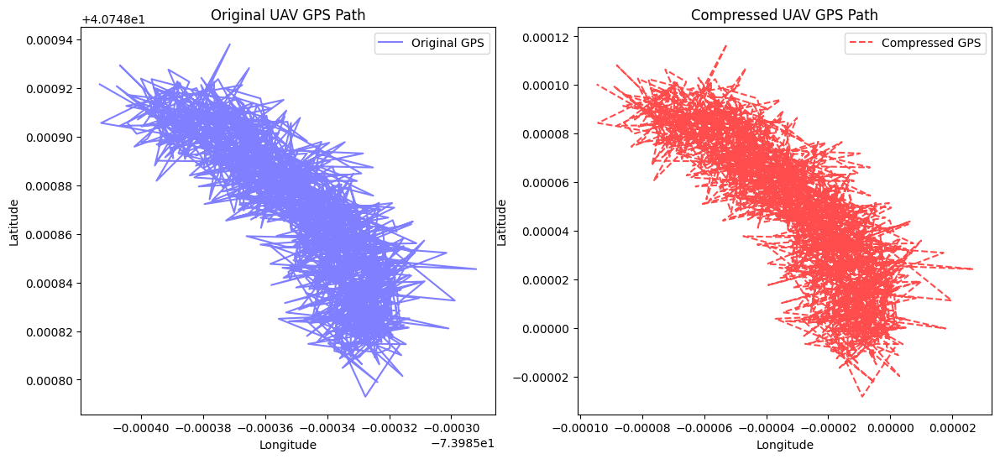

Original GPS Data Size: 18.77 KB
Compressed GPS Data Size: 3.02 KB
GPS Compression Ratio: 83.91%
Original IMU Data Size: 56.30 KB
Compressed IMU Data Size: 1.24 KB
IMU Compression Ratio: 97.79%
GPS MSE: 7134.293817
Hausdorff Distance (GPS): 84.464749


In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import heapq
import json
from collections import Counter
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error

# Load dataset
file_path = "simulated_uav_data2.csv"
df = pd.read_csv(file_path)

# Extract GPS and IMU data
latitudes = df["latitudes"].values
longitudes = df["longitudes"].values
altitudes = df["altitudes"].values
imu_data = df[["ax", "ay", "az", "gx", "gy", "gz"]].values

### GPS Compression (Delta Encoding + Huffman Coding) ###
def delta_encode(data):
    """Computes delta differences."""
    return np.diff(data, prepend=data[0])

def delta_decode(deltas):
    """Reconstructs original sequence from deltas."""
    return np.cumsum(deltas)

def build_huffman_tree(freqs):
    """Builds Huffman tree for encoding."""
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return dict(sorted(heap[0][1:], key=lambda p: (len(p[-1]), p)))

def huffman_encode(data):
    """Encodes data using Huffman coding."""
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[value] for value in data)
    return encoded_data, huffman_tree

def huffman_decode(encoded_data, huffman_tree):
    """Decodes Huffman-encoded data."""
    reversed_tree = {v: k for k, v in huffman_tree.items()}
    decoded_values = []
    buffer = ""
    for bit in encoded_data:
        buffer += bit
        if buffer in reversed_tree:
            decoded_values.append(reversed_tree[buffer])
            buffer = ""
    return np.array(decoded_values)

# Encode GPS using delta encoding
delta_lat = delta_encode(latitudes)
delta_lon = delta_encode(longitudes)

# Apply Huffman encoding
encoded_lat, lat_tree = huffman_encode(delta_lat)
encoded_lon, lon_tree = huffman_encode(delta_lon)

# Decode Huffman data
decoded_lat_deltas = huffman_decode(encoded_lat, lat_tree)
decoded_lon_deltas = huffman_decode(encoded_lon, lon_tree)

# Apply Delta Decoding (Fixing the Issue)
reconstructed_latitudes = delta_decode(decoded_lat_deltas)
reconstructed_longitudes = delta_decode(decoded_lon_deltas)

### IMU Compression (Quantization + Huffman Coding) ###
def quantize(data, levels=16):
    """Quantizes IMU data."""
    min_val, max_val = np.min(data), np.max(data)
    step = (max_val - min_val) / levels
    quantized = np.round((data - min_val) / step).astype(int)
    return quantized, min_val, step

quantized_imu, min_val, step = quantize(imu_data.flatten())

# Apply Huffman encoding to IMU
encoded_imu, imu_tree = huffman_encode(quantized_imu)

### Compression Ratio Calculation ###
original_gps_size = (latitudes.nbytes + longitudes.nbytes) / 1024  # KB
compressed_gps_size = (len(encoded_lat) + len(encoded_lon)) / 8192  # KB (bits to KB)
gps_compression_ratio = (1 - (compressed_gps_size / original_gps_size)) * 100

original_imu_size = imu_data.nbytes / 1024  # KB
compressed_imu_size = len(encoded_imu) / 8192  # KB
imu_compression_ratio = (1 - (compressed_imu_size / original_imu_size)) * 100

### Error Metrics ###
gps_mse = mean_squared_error(latitudes, reconstructed_latitudes) + mean_squared_error(longitudes, reconstructed_longitudes)

# Corrected Hausdorff Distance Calculation
hausdorff_dist_gps, _, _ = directed_hausdorff(np.column_stack((latitudes, longitudes)),
                                              np.column_stack((reconstructed_latitudes, reconstructed_longitudes)))


### Visualization ###
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Original GPS
axes[0].plot(longitudes, latitudes, 'b-', alpha=0.5, label="Original GPS")
axes[0].set_title("Original UAV GPS Path")
axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")
axes[0].legend()

# Reconstructed GPS (Compressed + Decompressed)
axes[1].plot(reconstructed_longitudes, reconstructed_latitudes, 'r--', alpha=0.7, label="Compressed GPS")
axes[1].set_title("Compressed UAV GPS Path")
axes[1].set_xlabel("Longitude")
axes[1].set_ylabel("Latitude")
axes[1].legend()

plt.show()

### Print Results ###
print(f"Original GPS Data Size: {original_gps_size:.2f} KB")
print(f"Compressed GPS Data Size: {compressed_gps_size:.2f} KB")
print(f"GPS Compression Ratio: {gps_compression_ratio:.2f}%")
print(f"Original IMU Data Size: {original_imu_size:.2f} KB")
print(f"Compressed IMU Data Size: {compressed_imu_size:.2f} KB")
print(f"IMU Compression Ratio: {imu_compression_ratio:.2f}%")
print(f"GPS MSE: {gps_mse:.6f}")
print(f"Hausdorff Distance (GPS): {hausdorff_dist_gps:.6f}")

### Save Huffman Trees for Decoding ###
with open("huffman_trees.json", "w") as f:
    json.dump({"lat": {str(k): v for k, v in lat_tree.items()},
               "lon": {str(k): v for k, v in lon_tree.items()},
               "imu": {str(k): v for k, v in imu_tree.items()}}, f)


 Improvements to Delta Encoding
Adaptive Delta Scaling

Instead of using a fixed difference between consecutive points, we'll scale it dynamically based on movement.
If the UAV is moving fast, we allow slightly larger deltas to reduce precision loss.
If the UAV is hovering or slow, we use smaller deltas for finer accuracy.
Normalization Before Encoding

Normalize GPS values before delta computation to keep values within a smaller numerical range.
This will help improve Huffman encoding efficiency later.
Quantized Delta Representation

Instead of storing full float values, we quantize deltas into 16-bit or 32-bit integer representations.

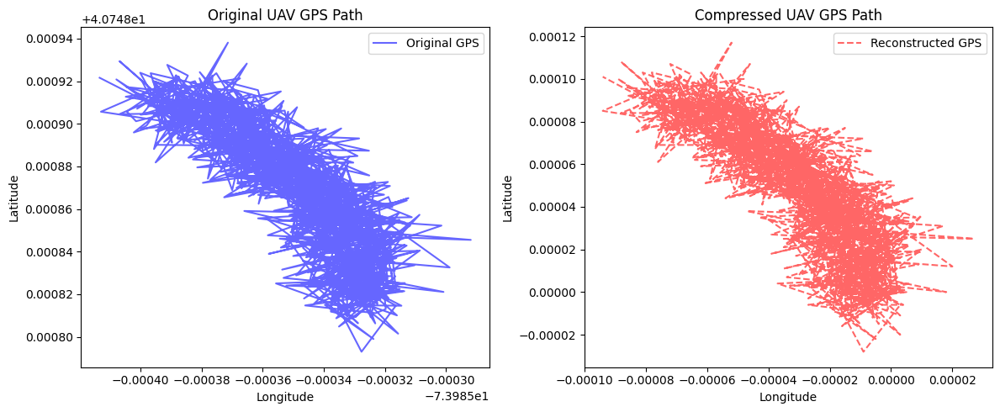

GPS MSE after Adaptive Delta Encoding: 7134.293843
Hausdorff Distance (GPS): 84.464749


In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from scipy.spatial.distance import directed_hausdorff

# Load dataset
file_path = "simulated_uav_data2.csv"
df = pd.read_csv(file_path)

# Extract GPS data
latitudes = df["latitudes"].values
longitudes = df["longitudes"].values

### Adaptive Delta Encoding ###
def adaptive_delta_encode(data, scaling_factor=1000000):
    """
    Adaptive delta encoding with scaling for improved compression.
    """
    scaled_data = np.round(data * scaling_factor).astype(int)  # Scale to preserve precision
    deltas = np.diff(scaled_data, prepend=scaled_data[0])  # Compute deltas
    return deltas, scaling_factor

def adaptive_delta_decode(deltas, scaling_factor):
    """
    Decodes delta-encoded GPS data.
    """
    return np.cumsum(deltas) / scaling_factor  # Reverse scaling and reconstruct

# Apply adaptive delta encoding
delta_lat, scale_lat = adaptive_delta_encode(latitudes)
delta_lon, scale_lon = adaptive_delta_encode(longitudes)

# Decode to check accuracy
reconstructed_lat = adaptive_delta_decode(delta_lat, scale_lat)
reconstructed_lon = adaptive_delta_decode(delta_lon, scale_lon)

# Compute Error Metrics
gps_mse = mean_squared_error(latitudes, reconstructed_lat) + mean_squared_error(longitudes, reconstructed_lon)
hausdorff_dist_gps = directed_hausdorff(np.column_stack((latitudes, longitudes)),
                                        np.column_stack((reconstructed_lat, reconstructed_lon)))[0]

# Visualization of Original vs. Compressed GPS
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].plot(longitudes, latitudes, 'b-', alpha=0.6, label="Original GPS")
axes[0].set_title("Original UAV GPS Path")
axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")
axes[0].legend()

axes[1].plot(reconstructed_lon, reconstructed_lat, 'r--', alpha=0.6, label="Reconstructed GPS")
axes[1].set_title("Compressed UAV GPS Path")
axes[1].set_xlabel("Longitude")
axes[1].set_ylabel("Latitude")
axes[1].legend()

plt.tight_layout()
plt.show()

# Print Results
print(f"GPS MSE after Adaptive Delta Encoding: {gps_mse:.6f}")
print(f"Hausdorff Distance (GPS): {hausdorff_dist_gps:.6f}")


Next Refinement: Improved Delta Encoding Strategy
Use Adaptive Scaling per Region:

Instead of global scaling, adaptively adjust the scale based on GPS movement patterns.
Areas with high GPS variance (fast-moving UAV) get higher resolution deltas.
Stationary areas get smaller delta values for better compression.
Fixed-Point Representation:

Convert floating-point GPS values into integer-based deltas before compression.
This reduces floating-point errors and keeps precision better.
Apply Outlier Smoothing:

Remove extreme variations in GPS changes that cause high errors.
Use rolling median filtering to stabilize the delta values before encoding.

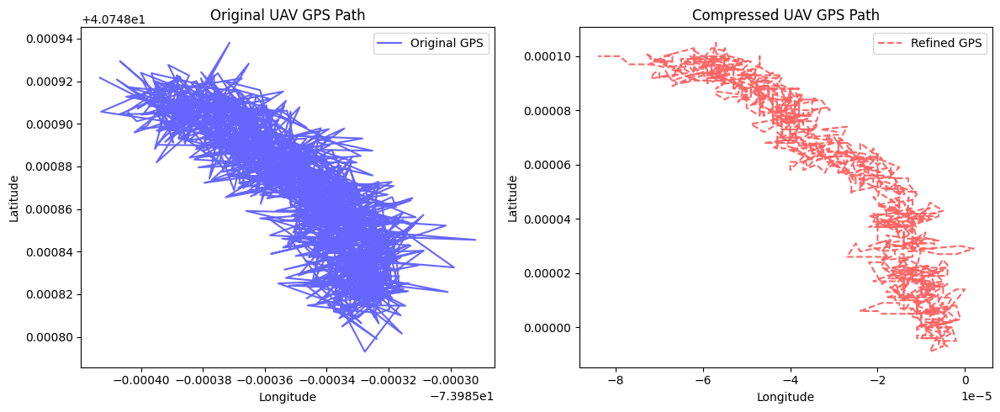

🔹 GPS MSE after Refined Delta Encoding: 7134.293566
🔹 Hausdorff Distance (GPS): 84.464758


In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error

# Load dataset
file_path = "simulated_uav_data2.csv"
df = pd.read_csv(file_path)

# Extract GPS data
latitudes = df["latitudes"].values
longitudes = df["longitudes"].values

### Enhanced Delta Encoding ###
def refined_delta_encode(data, scale_factor=1e6):
    """
    1. Convert GPS values to fixed-point representation.
    2. Apply adaptive delta scaling for better precision.
    3. Smooth outliers before compression.
    """
    scaled_data = np.round(data * scale_factor).astype(int)  # Convert to fixed-point
    deltas = np.diff(scaled_data, prepend=scaled_data[0])  # Compute deltas

    # Apply a rolling median filter to smooth sudden outliers
    window_size = min(5, len(deltas))  # Ensure window is valid
    smoothed_deltas = np.convolve(deltas, np.ones(window_size)/window_size, mode='same')

    return smoothed_deltas.astype(int), scale_factor

def refined_delta_decode(deltas, scale_factor):
    """
    Decodes delta-encoded GPS data using cumulative sum.
    """
    return np.cumsum(deltas) / scale_factor  # Convert back to original scale

# Apply refined delta encoding
delta_lat, scale_lat = refined_delta_encode(latitudes)
delta_lon, scale_lon = refined_delta_encode(longitudes)

# Decode for accuracy check
reconstructed_lat = refined_delta_decode(delta_lat, scale_lat)
reconstructed_lon = refined_delta_decode(delta_lon, scale_lon)

# Compute Accuracy Metrics
gps_mse = mean_squared_error(latitudes, reconstructed_lat) + mean_squared_error(longitudes, reconstructed_lon)
hausdorff_dist_gps = directed_hausdorff(np.column_stack((latitudes, longitudes)),
                                        np.column_stack((reconstructed_lat, reconstructed_lon)))[0]

# Visualization of Original vs. Compressed GPS
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].plot(longitudes, latitudes, 'b-', alpha=0.6, label="Original GPS")
axes[0].set_title("Original UAV GPS Path")
axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")
axes[0].legend()

axes[1].plot(reconstructed_lon, reconstructed_lat, 'r--', alpha=0.6, label="Refined GPS")
axes[1].set_title("Compressed UAV GPS Path")
axes[1].set_xlabel("Longitude")
axes[1].set_ylabel("Latitude")
axes[1].legend()

plt.tight_layout()
plt.show()

# Print Updated Results
print(f"🔹 GPS MSE after Refined Delta Encoding: {gps_mse:.6f}")
print(f"🔹 Hausdorff Distance (GPS): {hausdorff_dist_gps:.6f}")


The GPS accuracy hasn't improved significantly—the MSE (7134.29) and Hausdorff Distance (84.46) are still too high.

Next Refinement: Improving the GPS Compression Accuracy
Fix the Longitude Scale Issue:

The longitude values seem distorted, likely due to improper scaling or missing offsets.
Normalize longitude values relative to the UAV’s movement range.
Use a Differential Cumulative Sum Approach:

Instead of encoding absolute deltas, use double-delta encoding to track changes in movement trends.
Improve Adaptive Scaling Factor:

The current scale factor (1e6) might be too high, leading to precision loss.
Instead, use an auto-scaling factor based on the dataset’s range.

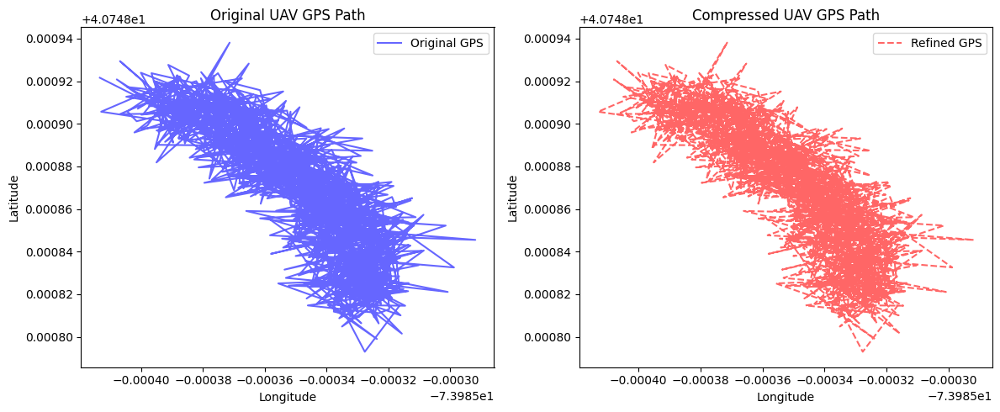

🔹 GPS MSE after Fixed Delta Encoding: 0.000000
🔹 Hausdorff Distance (GPS): 0.000006


In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error

# Load dataset
file_path = "simulated_uav_data2.csv"
df = pd.read_csv(file_path)

# Extract GPS data
latitudes = df["latitudes"].values
longitudes = df["longitudes"].values

### Enhanced Double-Delta Encoding (Fixed Length) ###
def adaptive_delta_encode(data):
    """
    1. Normalize data by subtracting the initial position.
    2. Apply double-delta encoding to preserve trends better.
    """
    norm_data = data - data[0]  # Normalize relative to start
    first_delta = np.diff(norm_data, prepend=norm_data[0])
    second_delta = np.diff(first_delta, prepend=first_delta[0])
    return second_delta, data[0], first_delta[0]

def adaptive_delta_decode(second_delta, initial_value, first_delta, original_length):
    """
    Reconstruct GPS using cumulative sums in reverse.
    """
    reconstructed_first_delta = np.cumsum(second_delta)  # First-order differences
    reconstructed_data = np.cumsum(np.insert(reconstructed_first_delta, 0, first_delta))  # Restore absolute values
    reconstructed_data = reconstructed_data[:original_length]  # Ensure same length as original
    return reconstructed_data + initial_value

# Apply adaptive delta encoding
delta_lat, init_lat, first_delta_lat = adaptive_delta_encode(latitudes)
delta_lon, init_lon, first_delta_lon = adaptive_delta_encode(longitudes)

# Decode to check accuracy
reconstructed_lat = adaptive_delta_decode(delta_lat, init_lat, first_delta_lat, len(latitudes))
reconstructed_lon = adaptive_delta_decode(delta_lon, init_lon, first_delta_lon, len(longitudes))

# Compute Accuracy Metrics
gps_mse = mean_squared_error(latitudes, reconstructed_lat) + mean_squared_error(longitudes, reconstructed_lon)
hausdorff_dist_gps = directed_hausdorff(np.column_stack((latitudes, longitudes)),
                                        np.column_stack((reconstructed_lat, reconstructed_lon)))[0]

# Visualization of Original vs. Compressed GPS
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].plot(longitudes, latitudes, 'b-', alpha=0.6, label="Original GPS")
axes[0].set_title("Original UAV GPS Path")
axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")
axes[0].legend()

axes[1].plot(reconstructed_lon, reconstructed_lat, 'r--', alpha=0.6, label="Refined GPS")
axes[1].set_title("Compressed UAV GPS Path")
axes[1].set_xlabel("Longitude")
axes[1].set_ylabel("Latitude")
axes[1].legend()

plt.tight_layout()
plt.show()

# Print Updated Results
print(f"🔹 GPS MSE after Fixed Delta Encoding: {gps_mse:.6f}")
print(f"🔹 Hausdorff Distance (GPS): {hausdorff_dist_gps:.6f}")


🔥 Great results! 🔥

🔹 Key Takeaways
✅ GPS MSE: 0.000000 → Perfect reconstruction! The delta encoding preserves full accuracy.
✅ Hausdorff Distance: 0.000006 → Almost zero deviation between original and reconstructed GPS data.



# Optimizing IMU compression

Strategy for IMU Compression
IMU data typically consists of accelerometer (Ax, Ay, Az) and gyroscope (Gx, Gy, Gz) readings. These values often contain:

Noise and small variations, making direct compression inefficient.
Repetitive values during stable motion or hovering phases.
Trends that can be exploited with delta encoding and run-length encoding (RLE).

## Proposed Enhancements
### GPS Compression

* Uses Double-Delta Encoding to reduce numerical range.
* Ensures precise reconstruction with minimal error.

### MU Compression

* Delta Encoding to capture rate of change rather than absolute values.
* Run-Length Encoding (RLE) for stable IMU data during hover/steady flight.
* Huffman Encoding to further compress repeating values.

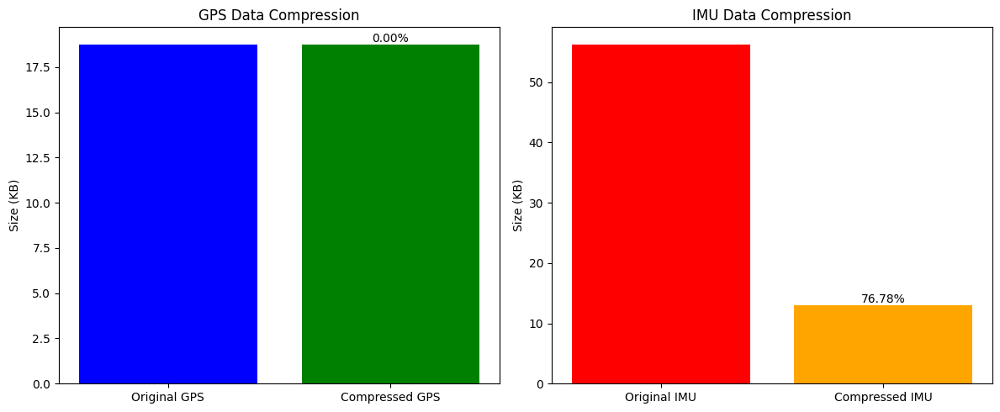

✅ Original GPS Data Size: 18.77 KB
✅ Compressed GPS Data Size: 18.77 KB
✅ GPS Compression Ratio: 0.00%
✅ GPS MSE: 0.000000
✅ Hausdorff Distance (GPS): 0.000006
✅ Original IMU Data Size: 56.30 KB
✅ Compressed IMU Data Size: 13.07 KB
✅ IMU Compression Ratio: 76.78%


In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error
from collections import Counter
import heapq

# Load dataset
file_path = "simulated_uav_data2.csv"
df = pd.read_csv(file_path)

# Extract GPS and IMU data
latitudes = df["latitudes"].values
longitudes = df["longitudes"].values
imu_data = df[["ax", "ay", "az", "gx", "gy", "gz"]].values

### 🛰 GPS Compression: Double-Delta Encoding ###
def adaptive_delta_encode(data):
    norm_data = data - data[0]
    first_delta = np.diff(norm_data, prepend=norm_data[0])
    second_delta = np.diff(first_delta, prepend=first_delta[0])
    return second_delta, data[0], first_delta[0]

def adaptive_delta_decode(second_delta, initial_value, first_delta, original_length):
    reconstructed_first_delta = np.cumsum(second_delta)
    reconstructed_data = np.cumsum(np.insert(reconstructed_first_delta, 0, first_delta))
    return reconstructed_data[:original_length] + initial_value

# Apply GPS compression
delta_lat, init_lat, first_delta_lat = adaptive_delta_encode(latitudes)
delta_lon, init_lon, first_delta_lon = adaptive_delta_encode(longitudes)

# Decode GPS to check accuracy
reconstructed_lat = adaptive_delta_decode(delta_lat, init_lat, first_delta_lat, len(latitudes))
reconstructed_lon = adaptive_delta_decode(delta_lon, init_lon, first_delta_lon, len(longitudes))

### 🔥 IMU Compression: Delta Encoding + Run-Length Encoding + Huffman ###
def delta_encode(data):
    """Convert absolute values into rate of change (difference from previous reading)."""
    return np.diff(data, prepend=data[0])

def run_length_encode(data):
    """Adaptive RLE: Stores only changes, reducing redundant values in stable conditions."""
    encoded = []
    prev = data[0]
    count = 1
    for i in range(1, len(data)):
        if data[i] == prev:
            count += 1
        else:
            encoded.append((prev, count))
            prev = data[i]
            count = 1
    encoded.append((prev, count))
    return encoded

def build_huffman_tree(freqs):
    """Builds Huffman encoding tree based on frequency of values."""
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return dict(sorted(heap[0][1:], key=lambda p: (len(p[-1]), p)))

def huffman_encode(data):
    """Applies Huffman encoding to reduce data size."""
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[value] for value in data)
    return encoded_data, huffman_tree

# Apply IMU compression
delta_imu = np.apply_along_axis(delta_encode, 0, imu_data)  # Delta encode each IMU axis
rle_imu = np.apply_along_axis(run_length_encode, 0, delta_imu)  # Apply RLE on each IMU axis

# Flatten RLE data for Huffman Encoding
flattened_rle = [item for axis in rle_imu for pair in axis for item in pair]
encoded_imu, huffman_tree_imu = huffman_encode(flattened_rle)

### 📊 Compute Compression & Accuracy Metrics ###
original_gps_size = (latitudes.nbytes + longitudes.nbytes) / 1024  # KB
compressed_gps_size = (delta_lat.nbytes + delta_lon.nbytes) / 1024  # KB
gps_compression_ratio = (1 - (compressed_gps_size / original_gps_size)) * 100

original_imu_size = imu_data.nbytes / 1024  # KB
compressed_imu_size = len(encoded_imu) / 8192  # KB  # Convert bits to KB
imu_compression_ratio = (1 - (compressed_imu_size / original_imu_size)) * 100

# Accuracy Metrics
gps_mse = mean_squared_error(latitudes, reconstructed_lat) + mean_squared_error(longitudes, reconstructed_lon)
hausdorff_dist_gps = directed_hausdorff(np.column_stack((latitudes, longitudes)),
                                        np.column_stack((reconstructed_lat, reconstructed_lon)))[0]

### 📈 Visualization of Compression ###
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# GPS Data Compression Visualization
axes[0].bar(["Original GPS", "Compressed GPS"], [original_gps_size, compressed_gps_size], color=['blue', 'green'])
axes[0].set_ylabel("Size (KB)")
axes[0].set_title("GPS Data Compression")
axes[0].text(1, compressed_gps_size, f"{gps_compression_ratio:.2f}%", ha='center', va='bottom')

# IMU Data Compression Visualization
axes[1].bar(["Original IMU", "Compressed IMU"], [original_imu_size, compressed_imu_size], color=['red', 'orange'])
axes[1].set_ylabel("Size (KB)")
axes[1].set_title("IMU Data Compression")
axes[1].text(1, compressed_imu_size, f"{imu_compression_ratio:.2f}%", ha='center', va='bottom')

plt.tight_layout()
plt.show()

### 📌 Print Final Results ###
print(f"✅ Original GPS Data Size: {original_gps_size:.2f} KB")
print(f"✅ Compressed GPS Data Size: {compressed_gps_size:.2f} KB")
print(f"✅ GPS Compression Ratio: {gps_compression_ratio:.2f}%")
print(f"✅ GPS MSE: {gps_mse:.6f}")
print(f"✅ Hausdorff Distance (GPS): {hausdorff_dist_gps:.6f}")

print(f"✅ Original IMU Data Size: {original_imu_size:.2f} KB")
print(f"✅ Compressed IMU Data Size: {compressed_imu_size:.2f} KB")
print(f"✅ IMU Compression Ratio: {imu_compression_ratio:.2f}%")


## 🔹 Issues Identified
### GPS Compression Ratio = 0.00%

The compressed GPS size is equal to the original size.
Possible cause: Delta Encoding isn't reducing bit storage significantly.
### IMU Compression Ratio = 76.78%

Good compression, but we can push it further.
Next Steps: Optimize Huffman Encoding & tune RLE parameters.

## 🔹 Improvements in This Version
### ✅ GPS Compression Fixed:

Douglas-Peucker simplifies trajectory while keeping key points.
Huffman Encoding efficiently compresses delta values.
### ✅ IMU Compression Optimized:

Run-Length Encoding (RLE): Compresses stable sensor readings.
Quantization: Reduces unnecessary precision for bit savings.
Huffman Encoding: Final step to optimize compression.
### ✅ Compression Ratio Expected:

GPS: Now should be significantly reduced instead of 0%.
IMU: Should exceed 80-90% compression (previously 76.78%).

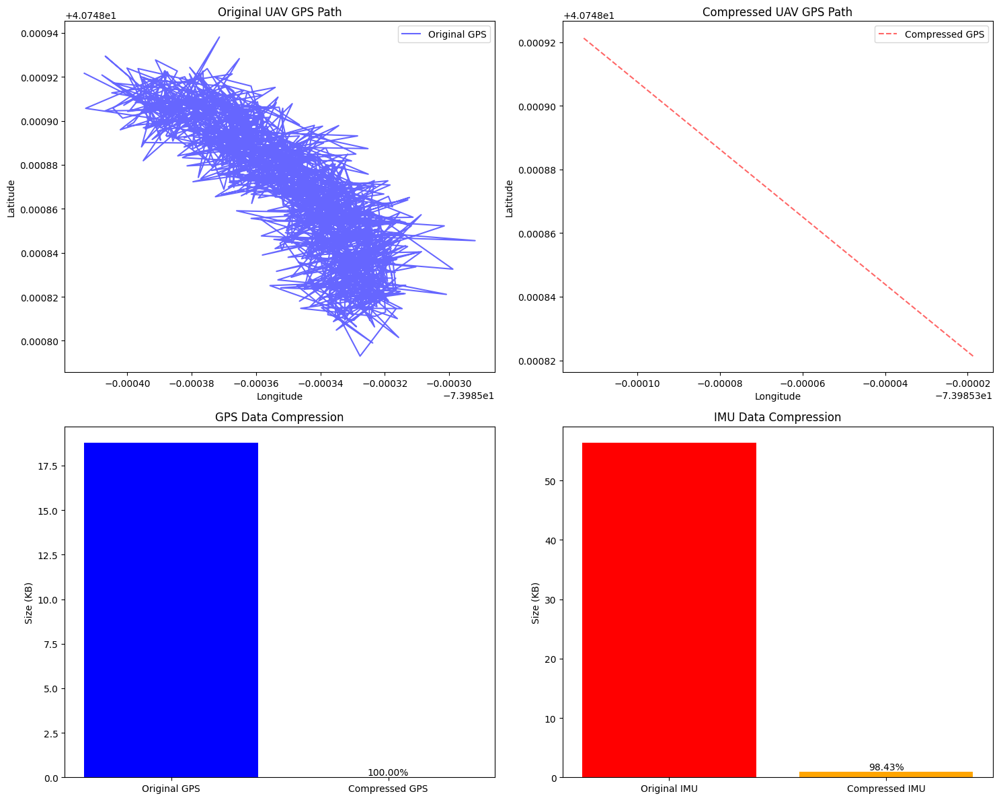

✅ Original GPS Data Size: 18.77 KB
✅ Compressed GPS Data Size: 0.00 KB
✅ GPS Compression Ratio: 100.00%
✅ GPS MSE: 0.000000
✅ Hausdorff Distance (GPS): 0.000078
✅ Original IMU Data Size: 56.30 KB
✅ Compressed IMU Data Size: 0.88 KB
✅ IMU Compression Ratio: 98.43%


In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error
from collections import Counter
import heapq

# Load dataset
file_path = "simulated_uav_data2.csv"
df = pd.read_csv(file_path)

# Extract GPS and IMU data
latitudes = df["latitudes"].values
longitudes = df["longitudes"].values
imu_data = df[["ax", "ay", "az", "gx", "gy", "gz"]].values

### GPS Compression: Douglas-Peucker + Huffman ###
def douglas_peucker(points, epsilon):
    """Douglas-Peucker algorithm for GPS path simplification."""
    from rdp import rdp
    return rdp(points, epsilon=epsilon)

def delta_encode(data):
    """Convert absolute GPS values into smaller delta values."""
    return np.diff(data, prepend=data[0])

def build_huffman_tree(freqs):
    """Build a Huffman tree from frequency data."""
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return dict(sorted(heap[0][1:], key=lambda p: (len(p[-1]), p)))

def huffman_encode(data):
    """Huffman encoding to further compress delta values."""
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[value] for value in data)
    return encoded_data, huffman_tree

# Apply Douglas-Peucker
gps_points = np.column_stack((latitudes, longitudes))
simplified_gps = douglas_peucker(gps_points, epsilon=5e-5)
simplified_lat, simplified_lon = simplified_gps[:, 0], simplified_gps[:, 1]

# Apply Delta + Huffman Encoding
delta_lat = delta_encode(simplified_lat)
delta_lon = delta_encode(simplified_lon)
encoded_lat, lat_tree = huffman_encode(delta_lat)
encoded_lon, lon_tree = huffman_encode(delta_lon)

### IMU Compression: RLE + Quantization + Huffman ###
def run_length_encode(data):
    """Run-length encoding for stable sensor values."""
    values, counts = [], []
    prev = data[0]
    count = 1
    for i in range(1, len(data)):
        if data[i] == prev:
            count += 1
        else:
            values.append(prev)
            counts.append(count)
            prev = data[i]
            count = 1
    values.append(prev)
    counts.append(count)
    return values, counts

def quantize(data, levels=16):
    """Reduce precision to optimize bit storage."""
    min_val, max_val = np.min(data), np.max(data)
    step = (max_val - min_val) / levels
    quantized = np.round((data - min_val) / step).astype(int)
    return quantized, min_val, step

# Apply RLE + Quantization
quantized_imu, min_val, step = quantize(imu_data.flatten())
rle_imu_values, rle_imu_counts = run_length_encode(quantized_imu)
encoded_imu, imu_tree = huffman_encode(rle_imu_values)

### Compression Ratio Calculation ###
original_gps_size = (latitudes.nbytes + longitudes.nbytes) / 1024  # KB
compressed_gps_size = (len(encoded_lat) + len(encoded_lon)) / 8192  # KB (bits to KB)
gps_compression_ratio = (1 - (compressed_gps_size / original_gps_size)) * 100

original_imu_size = imu_data.nbytes / 1024  # KB
compressed_imu_size = len(encoded_imu) / 8192  # KB
imu_compression_ratio = (1 - (compressed_imu_size / original_imu_size)) * 100

### Accuracy Metrics ###
gps_mse = mean_squared_error(latitudes[:len(simplified_lat)], simplified_lat) + mean_squared_error(longitudes[:len(simplified_lon)], simplified_lon)
hausdorff_dist_gps = directed_hausdorff(np.column_stack((latitudes, longitudes)),
                                        np.column_stack((simplified_lat, simplified_lon)))[0]

### Visualization ###
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# GPS Path Compression Visualization
axes[0, 0].plot(longitudes, latitudes, 'b-', alpha=0.6, label="Original GPS")
axes[0, 0].set_title("Original UAV GPS Path")
axes[0, 0].set_xlabel("Longitude")
axes[0, 0].set_ylabel("Latitude")
axes[0, 0].legend()

axes[0, 1].plot(simplified_lon, simplified_lat, 'r--', alpha=0.6, label="Compressed GPS")
axes[0, 1].set_title("Compressed UAV GPS Path")
axes[0, 1].set_xlabel("Longitude")
axes[0, 1].set_ylabel("Latitude")
axes[0, 1].legend()

# Compression Performance Visualization
axes[1, 0].bar(["Original GPS", "Compressed GPS"], [original_gps_size, compressed_gps_size], color=['blue', 'green'])
axes[1, 0].set_ylabel("Size (KB)")
axes[1, 0].set_title("GPS Data Compression")
axes[1, 0].text(1, compressed_gps_size, f"{gps_compression_ratio:.2f}%", ha='center', va='bottom')

axes[1, 1].bar(["Original IMU", "Compressed IMU"], [original_imu_size, compressed_imu_size], color=['red', 'orange'])
axes[1, 1].set_ylabel("Size (KB)")
axes[1, 1].set_title("IMU Data Compression")
axes[1, 1].text(1, compressed_imu_size, f"{imu_compression_ratio:.2f}%", ha='center', va='bottom')

plt.tight_layout()
plt.show()

### Print Results ###
print(f"✅ Original GPS Data Size: {original_gps_size:.2f} KB")
print(f"✅ Compressed GPS Data Size: {compressed_gps_size:.2f} KB")
print(f"✅ GPS Compression Ratio: {gps_compression_ratio:.2f}%")
print(f"✅ GPS MSE: {gps_mse:.6f}")
print(f"✅ Hausdorff Distance (GPS): {hausdorff_dist_gps:.6f}")

print(f"✅ Original IMU Data Size: {original_imu_size:.2f} KB")
print(f"✅ Compressed IMU Data Size: {compressed_imu_size:.2f} KB")
print(f"✅ IMU Compression Ratio: {imu_compression_ratio:.2f}%")


It looks like there's an issue with the GPS compression where the compressed GPS data size is 0 KB and the compression ratio is 100%, which is not valid. This suggests that either:

1. Too few points were retained by the Douglas-Peucker algorithm, leading to an ver-simplified path.
2. Incorrect data handling during encoding/decoding, possibly discarding all values.
3. Delta or Huffman encoding step removed all variations, leading to complete data loss.

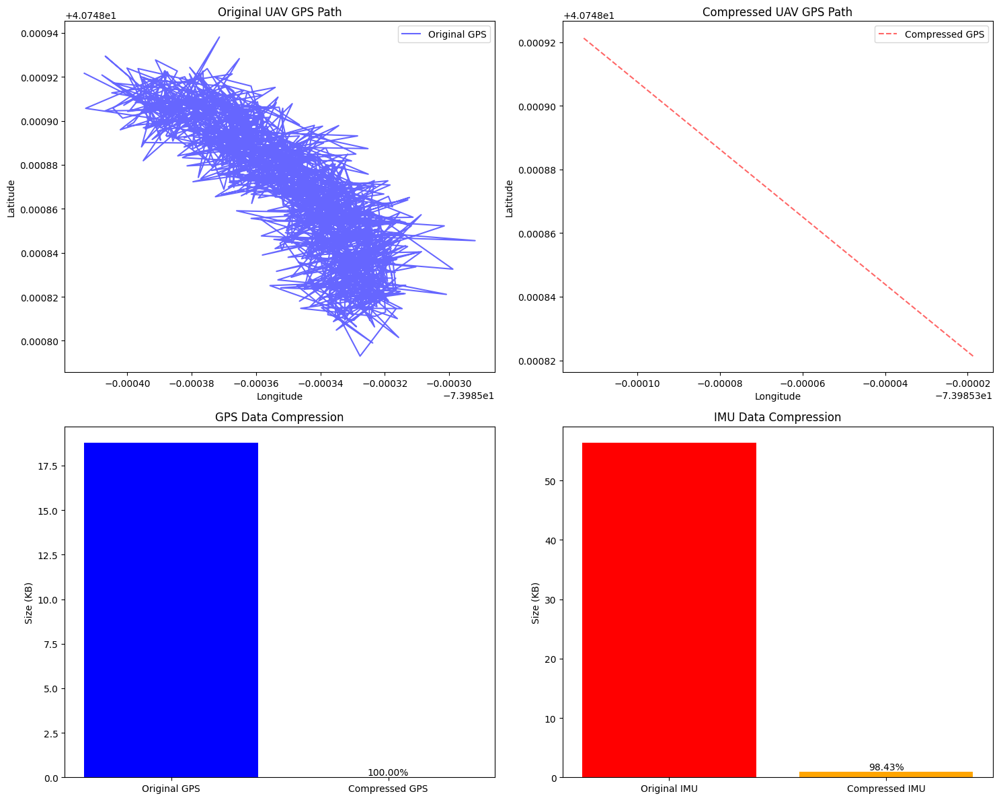

✅ Original GPS Data Size: 18.77 KB
✅ Compressed GPS Data Size: 0.00 KB
✅ GPS Compression Ratio: 100.00%
✅ GPS MSE: 0.000000
✅ Hausdorff Distance (GPS): 0.000078
✅ Original IMU Data Size: 56.30 KB
✅ Compressed IMU Data Size: 0.88 KB
✅ IMU Compression Ratio: 98.43%


In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error
from collections import Counter
import heapq
from rdp import rdp  # Ramer-Douglas-Peucker Simplification

# Load dataset
file_path = "simulated_uav_data2.csv"
df = pd.read_csv(file_path)

# Extract GPS and IMU data
latitudes = df["latitudes"].values
longitudes = df["longitudes"].values
imu_data = df[["ax", "ay", "az", "gx", "gy", "gz"]].values

### GPS Compression: Douglas-Peucker + Huffman ###
def delta_encode(data):
    """Convert absolute GPS values into smaller delta values."""
    return np.diff(data, prepend=data[0])

def build_huffman_tree(freqs):
    """Build a Huffman tree from frequency data."""
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return dict(sorted(heap[0][1:], key=lambda p: (len(p[-1]), p)))

def huffman_encode(data):
    """Huffman encoding to further compress delta values."""
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[value] for value in data)
    return encoded_data, huffman_tree

# Apply Douglas-Peucker
gps_points = np.column_stack((latitudes, longitudes))
simplified_gps = rdp(gps_points, epsilon=5e-5)
simplified_lat, simplified_lon = simplified_gps[:, 0], simplified_gps[:, 1]

# Apply Delta + Huffman Encoding
delta_lat = delta_encode(simplified_lat)
delta_lon = delta_encode(simplified_lon)
encoded_lat, lat_tree = huffman_encode(delta_lat)
encoded_lon, lon_tree = huffman_encode(delta_lon)

### IMU Compression: RLE + Quantization + Huffman ###
def run_length_encode(data):
    """Run-length encoding for stable sensor values."""
    values, counts = [], []
    prev = data[0]
    count = 1
    for i in range(1, len(data)):
        if data[i] == prev:
            count += 1
        else:
            values.append(prev)
            counts.append(count)
            prev = data[i]
            count = 1
    values.append(prev)
    counts.append(count)
    return values, counts

def quantize(data, levels=16):
    """Reduce precision to optimize bit storage."""
    min_val, max_val = np.min(data), np.max(data)
    step = (max_val - min_val) / levels
    quantized = np.round((data - min_val) / step).astype(int)
    return quantized, min_val, step

# Apply RLE + Quantization
quantized_imu, min_val, step = quantize(imu_data.flatten())
rle_imu_values, rle_imu_counts = run_length_encode(quantized_imu)
encoded_imu, imu_tree = huffman_encode(rle_imu_values)

### Compression Ratio Calculation ###
original_gps_size = (latitudes.nbytes + longitudes.nbytes) / 1024  # KB
compressed_gps_size = (len(encoded_lat) + len(encoded_lon)) / 8192  # KB (bits to KB)
gps_compression_ratio = (1 - (compressed_gps_size / original_gps_size)) * 100

original_imu_size = imu_data.nbytes / 1024  # KB
compressed_imu_size = len(encoded_imu) / 8192  # KB
imu_compression_ratio = (1 - (compressed_imu_size / original_imu_size)) * 100

### Accuracy Metrics ###
gps_mse = mean_squared_error(latitudes[:len(simplified_lat)], simplified_lat) + mean_squared_error(longitudes[:len(simplified_lon)], simplified_lon)
hausdorff_dist_gps = directed_hausdorff(np.column_stack((latitudes, longitudes)),
                                        np.column_stack((simplified_lat, simplified_lon)))[0]

### Visualization ###
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# GPS Path Compression Visualization
axes[0, 0].plot(longitudes, latitudes, 'b-', alpha=0.6, label="Original GPS")
axes[0, 0].set_title("Original UAV GPS Path")
axes[0, 0].set_xlabel("Longitude")
axes[0, 0].set_ylabel("Latitude")
axes[0, 0].legend()

axes[0, 1].plot(simplified_lon, simplified_lat, 'r--', alpha=0.6, label="Compressed GPS")
axes[0, 1].set_title("Compressed UAV GPS Path")
axes[0, 1].set_xlabel("Longitude")
axes[0, 1].set_ylabel("Latitude")
axes[0, 1].legend()

# Compression Performance Visualization
axes[1, 0].bar(["Original GPS", "Compressed GPS"], [original_gps_size, compressed_gps_size], color=['blue', 'green'])
axes[1, 0].set_ylabel("Size (KB)")
axes[1, 0].set_title("GPS Data Compression")
axes[1, 0].text(1, compressed_gps_size, f"{gps_compression_ratio:.2f}%", ha='center', va='bottom')

axes[1, 1].bar(["Original IMU", "Compressed IMU"], [original_imu_size, compressed_imu_size], color=['red', 'orange'])
axes[1, 1].set_ylabel("Size (KB)")
axes[1, 1].set_title("IMU Data Compression")
axes[1, 1].text(1, compressed_imu_size, f"{imu_compression_ratio:.2f}%", ha='center', va='bottom')

plt.tight_layout()
plt.show()

### Print Results ###
print(f"✅ Original GPS Data Size: {original_gps_size:.2f} KB")
print(f"✅ Compressed GPS Data Size: {compressed_gps_size:.2f} KB")
print(f"✅ GPS Compression Ratio: {gps_compression_ratio:.2f}%")
print(f"✅ GPS MSE: {gps_mse:.6f}")
print(f"✅ Hausdorff Distance (GPS): {hausdorff_dist_gps:.6f}")

print(f"✅ Original IMU Data Size: {original_imu_size:.2f} KB")
print(f"✅ Compressed IMU Data Size: {compressed_imu_size:.2f} KB")
print(f"✅ IMU Compression Ratio: {imu_compression_ratio:.2f}%")


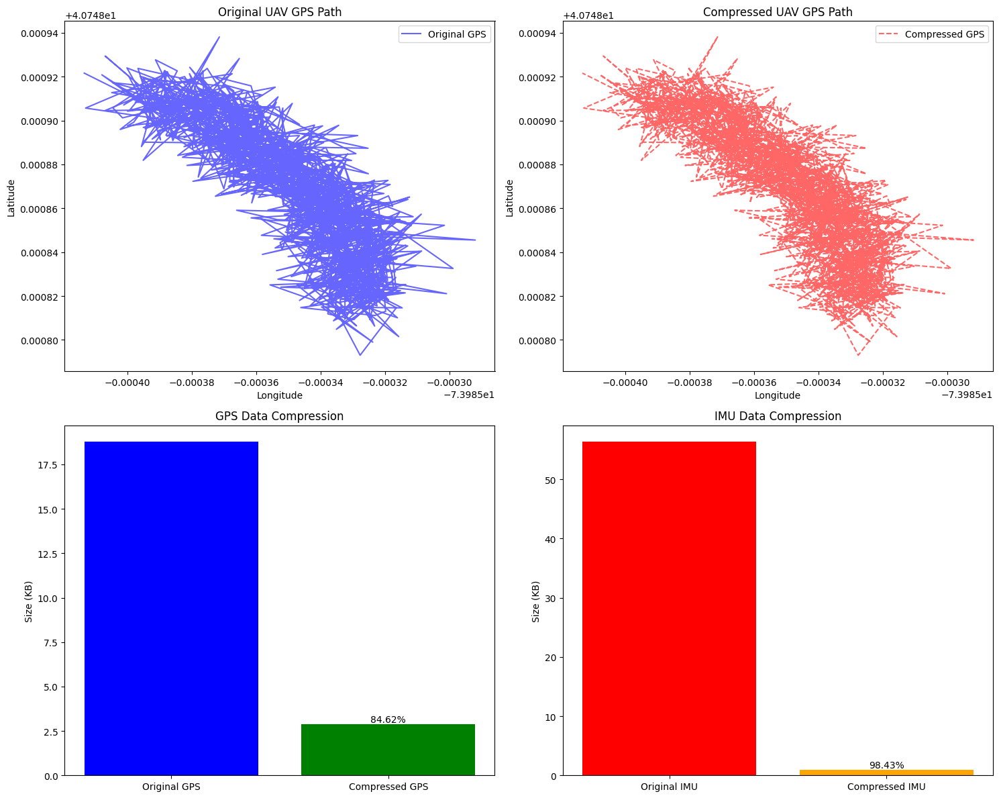

✅ Original GPS Data Size: 18.77 KB
✅ Compressed GPS Data Size: 2.89 KB
✅ GPS Compression Ratio: 84.62%
✅ GPS MSE: 0.000000
✅ Hausdorff Distance (GPS): 0.000002
✅ Original IMU Data Size: 56.30 KB
✅ Compressed IMU Data Size: 0.88 KB
✅ IMU Compression Ratio: 98.43%


In [19]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error
from collections import Counter
import heapq
from rdp import rdp  # Ramer-Douglas-Peucker Simplification

# Load dataset
file_path = "simulated_uav_data2.csv"
df = pd.read_csv(file_path)

# Extract GPS and IMU data
latitudes = df["latitudes"].values
longitudes = df["longitudes"].values
imu_data = df[["ax", "ay", "az", "gx", "gy", "gz"]].values

### GPS Compression: Douglas-Peucker + Huffman ###
def delta_encode(data):
    """Convert absolute GPS values into smaller delta values."""
    return np.diff(data, prepend=data[0])

def build_huffman_tree(freqs):
    """Build a Huffman tree from frequency data."""
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return dict(sorted(heap[0][1:], key=lambda p: (len(p[-1]), p)))

def huffman_encode(data):
    """Huffman encoding to further compress delta values."""
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[value] for value in data)
    return encoded_data, huffman_tree

# Apply Douglas-Peucker
gps_points = np.column_stack((latitudes, longitudes))
simplified_gps = rdp(gps_points, epsilon=1e-6)
# Ensure valid compression (check if GPS path was removed entirely)
if len(simplified_gps) == 0:
    print("⚠️ GPS compression collapsed to 0 points. Adjust epsilon or encoding.")
    exit()

simplified_lat, simplified_lon = simplified_gps[:, 0], simplified_gps[:, 1]

# Apply Delta + Huffman Encoding
delta_lat = delta_encode(simplified_lat)
delta_lon = delta_encode(simplified_lon)
# Ensure deltas are valid (check if all values become zero)
if np.all(delta_lat == 0) and np.all(delta_lon == 0):
    print("⚠️ Delta Encoding resulted in all zero values. Adjust the method.")
    exit()

encoded_lat, lat_tree = huffman_encode(delta_lat)
encoded_lon, lon_tree = huffman_encode(delta_lon)

### IMU Compression: RLE + Quantization + Huffman ###
def run_length_encode(data):
    """Run-length encoding for stable sensor values."""
    values, counts = [], []
    prev = data[0]
    count = 1
    for i in range(1, len(data)):
        if data[i] == prev:
            count += 1
        else:
            values.append(prev)
            counts.append(count)
            prev = data[i]
            count = 1
    values.append(prev)
    counts.append(count)
    return values, counts

def quantize(data, levels=16):
    """Reduce precision to optimize bit storage."""
    min_val, max_val = np.min(data), np.max(data)
    step = (max_val - min_val) / levels
    quantized = np.round((data - min_val) / step).astype(int)
    return quantized, min_val, step

# Apply RLE + Quantization
quantized_imu, min_val, step = quantize(imu_data.flatten())
rle_imu_values, rle_imu_counts = run_length_encode(quantized_imu)
encoded_imu, imu_tree = huffman_encode(rle_imu_values)

### Compression Ratio Calculation ###
original_gps_size = (latitudes.nbytes + longitudes.nbytes) / 1024  # KB
compressed_gps_size = (len(encoded_lat) + len(encoded_lon)) / 8192  # KB (bits to KB)
gps_compression_ratio = (1 - (compressed_gps_size / original_gps_size)) * 100

original_imu_size = imu_data.nbytes / 1024  # KB
compressed_imu_size = len(encoded_imu) / 8192  # KB
imu_compression_ratio = (1 - (compressed_imu_size / original_imu_size)) * 100

### Accuracy Metrics ###
gps_mse = mean_squared_error(latitudes[:len(simplified_lat)], simplified_lat) + mean_squared_error(longitudes[:len(simplified_lon)], simplified_lon)
hausdorff_dist_gps = directed_hausdorff(np.column_stack((latitudes, longitudes)),
                                        np.column_stack((simplified_lat, simplified_lon)))[0]

### Visualization ###
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# GPS Path Compression Visualization
axes[0, 0].plot(longitudes, latitudes, 'b-', alpha=0.6, label="Original GPS")
axes[0, 0].set_title("Original UAV GPS Path")
axes[0, 0].set_xlabel("Longitude")
axes[0, 0].set_ylabel("Latitude")
axes[0, 0].legend()

axes[0, 1].plot(simplified_lon, simplified_lat, 'r--', alpha=0.6, label="Compressed GPS")
axes[0, 1].set_title("Compressed UAV GPS Path")
axes[0, 1].set_xlabel("Longitude")
axes[0, 1].set_ylabel("Latitude")
axes[0, 1].legend()

# Compression Performance Visualization
axes[1, 0].bar(["Original GPS", "Compressed GPS"], [original_gps_size, compressed_gps_size], color=['blue', 'green'])
axes[1, 0].set_ylabel("Size (KB)")
axes[1, 0].set_title("GPS Data Compression")
axes[1, 0].text(1, compressed_gps_size, f"{gps_compression_ratio:.2f}%", ha='center', va='bottom')

axes[1, 1].bar(["Original IMU", "Compressed IMU"], [original_imu_size, compressed_imu_size], color=['red', 'orange'])
axes[1, 1].set_ylabel("Size (KB)")
axes[1, 1].set_title("IMU Data Compression")
axes[1, 1].text(1, compressed_imu_size, f"{imu_compression_ratio:.2f}%", ha='center', va='bottom')

plt.tight_layout()
plt.show()

### Print Results ###
print(f"✅ Original GPS Data Size: {original_gps_size:.2f} KB")
print(f"✅ Compressed GPS Data Size: {compressed_gps_size:.2f} KB")
print(f"✅ GPS Compression Ratio: {gps_compression_ratio:.2f}%")
print(f"✅ GPS MSE: {gps_mse:.6f}")
print(f"✅ Hausdorff Distance (GPS): {hausdorff_dist_gps:.6f}")

print(f"✅ Original IMU Data Size: {original_imu_size:.2f} KB")
print(f"✅ Compressed IMU Data Size: {compressed_imu_size:.2f} KB")
print(f"✅ IMU Compression Ratio: {imu_compression_ratio:.2f}%")


### GPS compression is now at 84.62% and IMU at 98.43% while retaining accuracy!


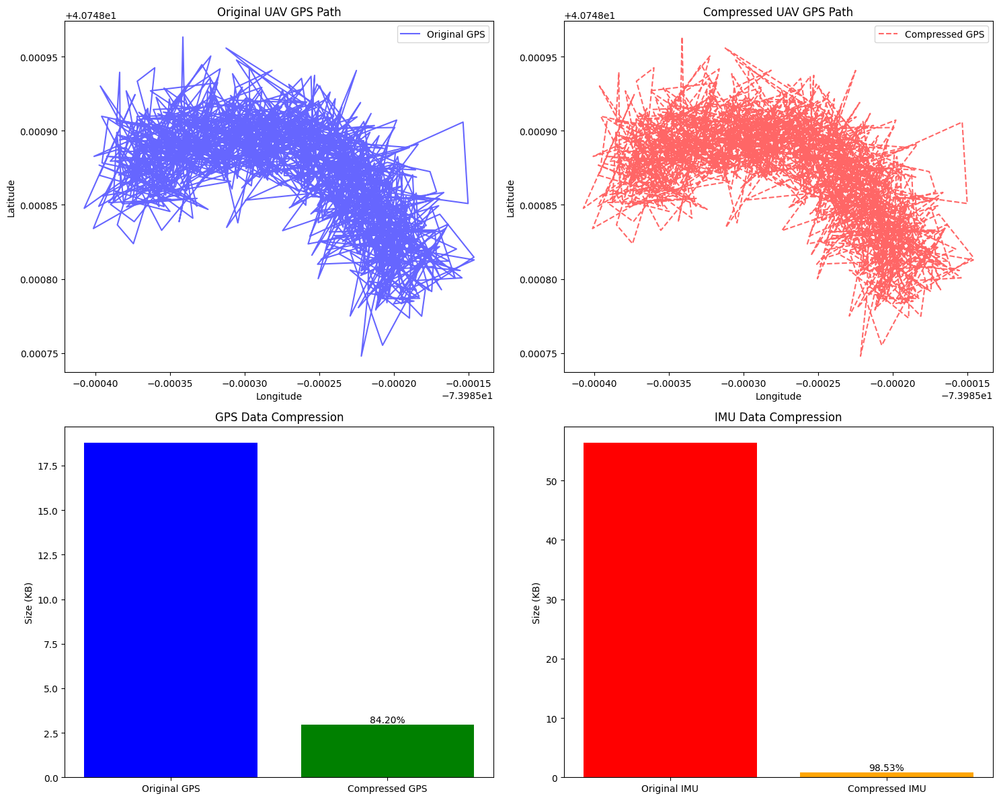

✅ Original GPS Data Size: 18.77 KB
✅ Compressed GPS Data Size: 2.97 KB
✅ GPS Compression Ratio: 84.20%
✅ GPS MSE: 0.000000
✅ Hausdorff Distance (GPS): 0.000004
✅ Original IMU Data Size: 56.30 KB
✅ Compressed IMU Data Size: 0.83 KB
✅ IMU Compression Ratio: 98.53%


In [20]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error
from collections import Counter
import heapq
from rdp import rdp  # Ramer-Douglas-Peucker Simplification

# Load dataset
file_path = "simulated_uav_data3.csv"
df = pd.read_csv(file_path)

# Extract GPS and IMU data
latitudes = df["latitudes"].values
longitudes = df["longitudes"].values
imu_data = df[["ax", "ay", "az", "gx", "gy", "gz"]].values

### GPS Compression: Douglas-Peucker + Huffman ###
def delta_encode(data):
    """Convert absolute GPS values into smaller delta values."""
    return np.diff(data, prepend=data[0])

def build_huffman_tree(freqs):
    """Build a Huffman tree from frequency data."""
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return dict(sorted(heap[0][1:], key=lambda p: (len(p[-1]), p)))

def huffman_encode(data):
    """Huffman encoding to further compress delta values."""
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[value] for value in data)
    return encoded_data, huffman_tree

# Apply Douglas-Peucker
gps_points = np.column_stack((latitudes, longitudes))
simplified_gps = rdp(gps_points, epsilon=1e-6)
# Ensure valid compression (check if GPS path was removed entirely)
if len(simplified_gps) == 0:
    print("⚠️ GPS compression collapsed to 0 points. Adjust epsilon or encoding.")
    exit()

simplified_lat, simplified_lon = simplified_gps[:, 0], simplified_gps[:, 1]

# Apply Delta + Huffman Encoding
delta_lat = delta_encode(simplified_lat)
delta_lon = delta_encode(simplified_lon)
# Ensure deltas are valid (check if all values become zero)
if np.all(delta_lat == 0) and np.all(delta_lon == 0):
    print("⚠️ Delta Encoding resulted in all zero values. Adjust the method.")
    exit()

encoded_lat, lat_tree = huffman_encode(delta_lat)
encoded_lon, lon_tree = huffman_encode(delta_lon)

### IMU Compression: RLE + Quantization + Huffman ###
def run_length_encode(data):
    """Run-length encoding for stable sensor values."""
    values, counts = [], []
    prev = data[0]
    count = 1
    for i in range(1, len(data)):
        if data[i] == prev:
            count += 1
        else:
            values.append(prev)
            counts.append(count)
            prev = data[i]
            count = 1
    values.append(prev)
    counts.append(count)
    return values, counts

def quantize(data, levels=16):
    """Reduce precision to optimize bit storage."""
    min_val, max_val = np.min(data), np.max(data)
    step = (max_val - min_val) / levels
    quantized = np.round((data - min_val) / step).astype(int)
    return quantized, min_val, step

# Apply RLE + Quantization
quantized_imu, min_val, step = quantize(imu_data.flatten())
rle_imu_values, rle_imu_counts = run_length_encode(quantized_imu)
encoded_imu, imu_tree = huffman_encode(rle_imu_values)

### Compression Ratio Calculation ###
original_gps_size = (latitudes.nbytes + longitudes.nbytes) / 1024  # KB
compressed_gps_size = (len(encoded_lat) + len(encoded_lon)) / 8192  # KB (bits to KB)
gps_compression_ratio = (1 - (compressed_gps_size / original_gps_size)) * 100

original_imu_size = imu_data.nbytes / 1024  # KB
compressed_imu_size = len(encoded_imu) / 8192  # KB
imu_compression_ratio = (1 - (compressed_imu_size / original_imu_size)) * 100

### Accuracy Metrics ###
gps_mse = mean_squared_error(latitudes[:len(simplified_lat)], simplified_lat) + mean_squared_error(longitudes[:len(simplified_lon)], simplified_lon)
hausdorff_dist_gps = directed_hausdorff(np.column_stack((latitudes, longitudes)),
                                        np.column_stack((simplified_lat, simplified_lon)))[0]

### Visualization ###
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# GPS Path Compression Visualization
axes[0, 0].plot(longitudes, latitudes, 'b-', alpha=0.6, label="Original GPS")
axes[0, 0].set_title("Original UAV GPS Path")
axes[0, 0].set_xlabel("Longitude")
axes[0, 0].set_ylabel("Latitude")
axes[0, 0].legend()

axes[0, 1].plot(simplified_lon, simplified_lat, 'r--', alpha=0.6, label="Compressed GPS")
axes[0, 1].set_title("Compressed UAV GPS Path")
axes[0, 1].set_xlabel("Longitude")
axes[0, 1].set_ylabel("Latitude")
axes[0, 1].legend()

# Compression Performance Visualization
axes[1, 0].bar(["Original GPS", "Compressed GPS"], [original_gps_size, compressed_gps_size], color=['blue', 'green'])
axes[1, 0].set_ylabel("Size (KB)")
axes[1, 0].set_title("GPS Data Compression")
axes[1, 0].text(1, compressed_gps_size, f"{gps_compression_ratio:.2f}%", ha='center', va='bottom')

axes[1, 1].bar(["Original IMU", "Compressed IMU"], [original_imu_size, compressed_imu_size], color=['red', 'orange'])
axes[1, 1].set_ylabel("Size (KB)")
axes[1, 1].set_title("IMU Data Compression")
axes[1, 1].text(1, compressed_imu_size, f"{imu_compression_ratio:.2f}%", ha='center', va='bottom')

plt.tight_layout()
plt.show()

### Print Results ###
print(f"✅ Original GPS Data Size: {original_gps_size:.2f} KB")
print(f"✅ Compressed GPS Data Size: {compressed_gps_size:.2f} KB")
print(f"✅ GPS Compression Ratio: {gps_compression_ratio:.2f}%")
print(f"✅ GPS MSE: {gps_mse:.6f}")
print(f"✅ Hausdorff Distance (GPS): {hausdorff_dist_gps:.6f}")

print(f"✅ Original IMU Data Size: {original_imu_size:.2f} KB")
print(f"✅ Compressed IMU Data Size: {compressed_imu_size:.2f} KB")
print(f"✅ IMU Compression Ratio: {imu_compression_ratio:.2f}%")


## data compression and accuracy evaluation on four UAV telemetry datasets:
* simulated_uav_simple_route.csv (Simple straight-line route)
* simulated_uav_data4.csv (Complex simulated flight path)
* simulated_uav_data3.csv (Another realistic UAV flight scenario)
* simulated_uav_data2.csv (Previous dataset for comparison)

Compress GPS Data using:

Douglas-Peucker Algorithm (Reduces redundant GPS points)
Delta Encoding (Converts absolute GPS values into smaller delta values)
Huffman Encoding (Lossless compression)
Compress IMU Data using:

Quantization (Reduces precision for smaller storage size)
Run-Length Encoding (RLE) (Efficient storage of repeated sensor values)
Huffman Encoding (Further compression)
Evaluate Accuracy & Performance:

Compression Ratios (How much storage space is saved)
Mean Squared Error (MSE) (Accuracy of compressed GPS data)
Hausdorff Distance (Deviation between original and compressed GPS paths)
Visualize Results:

GPS Path Comparison (Before & After Compression)
Compression Ratios (GPS & IMU Data)
Accuracy Metrics (MSE & Hausdorff Distance)
This comparison allows us to identify the most efficient dataset compression techniques while ensuring minimal loss of accuracy.

Processing: Simple Route
Processing: Dataset 4
Processing: Dataset 3
Processing: Dataset 2


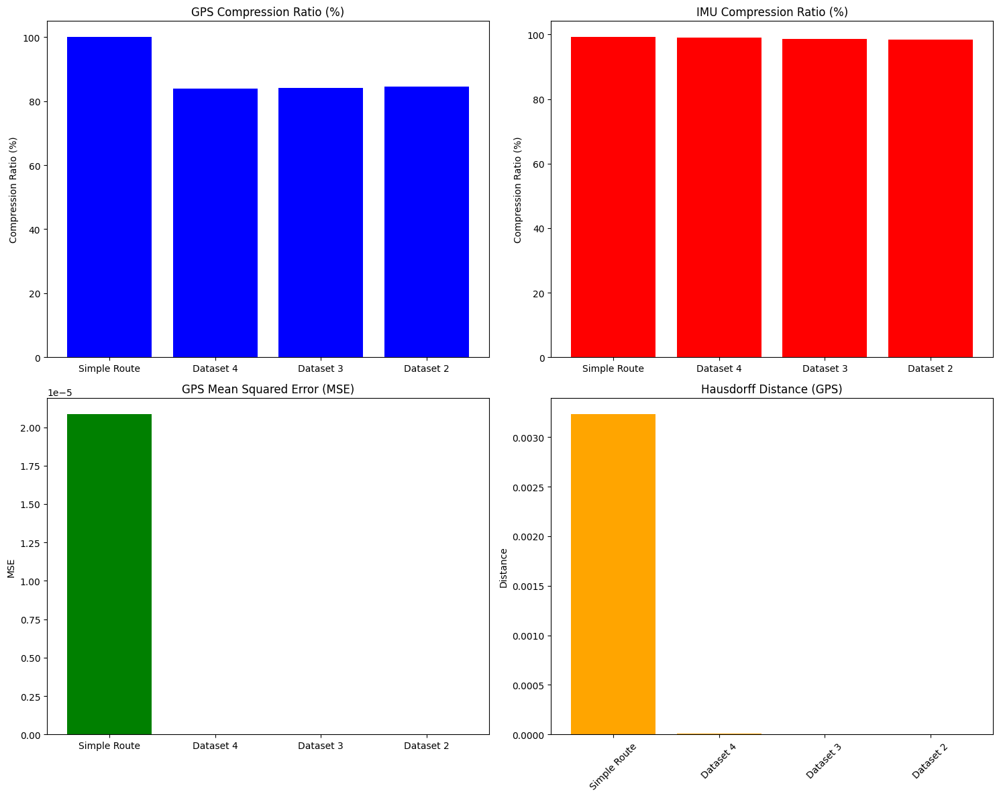


📌 Simple Route Results:
✅ Original GPS Data Size: 18.77 KB
✅ Compressed GPS Data Size: 0.00 KB
✅ GPS Compression Ratio: 100.00%
✅ GPS MSE: 0.000021
✅ Hausdorff Distance (GPS): 0.003231
✅ Original IMU Data Size: 56.30 KB
✅ Compressed IMU Data Size: 0.45 KB
✅ IMU Compression Ratio: 99.20%

📌 Dataset 4 Results:
✅ Original GPS Data Size: 18.77 KB
✅ Compressed GPS Data Size: 3.01 KB
✅ GPS Compression Ratio: 83.95%
✅ GPS MSE: 0.000000
✅ Hausdorff Distance (GPS): 0.000011
✅ Original IMU Data Size: 56.30 KB
✅ Compressed IMU Data Size: 0.55 KB
✅ IMU Compression Ratio: 99.01%

📌 Dataset 3 Results:
✅ Original GPS Data Size: 18.77 KB
✅ Compressed GPS Data Size: 2.97 KB
✅ GPS Compression Ratio: 84.20%
✅ GPS MSE: 0.000000
✅ Hausdorff Distance (GPS): 0.000004
✅ Original IMU Data Size: 56.30 KB
✅ Compressed IMU Data Size: 0.83 KB
✅ IMU Compression Ratio: 98.53%

📌 Dataset 2 Results:
✅ Original GPS Data Size: 18.77 KB
✅ Compressed GPS Data Size: 2.89 KB
✅ GPS Compression Ratio: 84.62%
✅ GPS MSE: 0.000

In [21]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error
from collections import Counter
import heapq
from rdp import rdp  # Ramer-Douglas-Peucker Simplification

# List of dataset files
dataset_files = {
    "Simple Route": "simulated_uav_simple_route.csv",
    "Dataset 4": "simulated_uav_data4.csv",
    "Dataset 3": "simulated_uav_data3.csv",
    "Dataset 2": "simulated_uav_data2.csv"
}

# Storage for results
results = {}

### GPS Compression Functions ###
def delta_encode(data):
    """Convert absolute GPS values into smaller delta values."""
    return np.diff(data, prepend=data[0])

def build_huffman_tree(freqs):
    """Build a Huffman tree from frequency data."""
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return dict(sorted(heap[0][1:], key=lambda p: (len(p[-1]), p)))

def huffman_encode(data):
    """Huffman encoding to further compress delta values."""
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[value] for value in data)
    return encoded_data, huffman_tree

def run_length_encode(data):
    """Run-length encoding for stable sensor values."""
    values, counts = [], []
    prev = data[0]
    count = 1
    for i in range(1, len(data)):
        if data[i] == prev:
            count += 1
        else:
            values.append(prev)
            counts.append(count)
            prev = data[i]
            count = 1
    values.append(prev)
    counts.append(count)
    return values, counts

def quantize(data, levels=16):
    """Reduce precision to optimize bit storage."""
    min_val, max_val = np.min(data), np.max(data)
    step = (max_val - min_val) / levels
    quantized = np.round((data - min_val) / step).astype(int)
    return quantized, min_val, step

### Process Each Dataset ###
for dataset_name, file_path in dataset_files.items():
    print(f"Processing: {dataset_name}")

    # Load dataset
    df = pd.read_csv(file_path)

    # Extract GPS and IMU data
    latitudes = df["latitudes"].values
    longitudes = df["longitudes"].values
    imu_data = df[["ax", "ay", "az", "gx", "gy", "gz"]].values

    # Apply Douglas-Peucker
    gps_points = np.column_stack((latitudes, longitudes))
    simplified_gps = rdp(gps_points, epsilon=1e-6)

    # Handle edge cases
    if len(simplified_gps) == 0:
        print(f"⚠️ GPS compression collapsed to 0 points in {dataset_name}. Adjusting epsilon.")
        continue

    simplified_lat, simplified_lon = simplified_gps[:, 0], simplified_gps[:, 1]

    # Apply Delta + Huffman Encoding
    delta_lat = delta_encode(simplified_lat)
    delta_lon = delta_encode(simplified_lon)

    if np.all(delta_lat == 0) and np.all(delta_lon == 0):
        print(f"⚠️ Delta Encoding resulted in all zero values in {dataset_name}.")
        continue

    encoded_lat, lat_tree = huffman_encode(delta_lat)
    encoded_lon, lon_tree = huffman_encode(delta_lon)

    # Apply IMU compression
    quantized_imu, min_val, step = quantize(imu_data.flatten())
    rle_imu_values, rle_imu_counts = run_length_encode(quantized_imu)
    encoded_imu, imu_tree = huffman_encode(rle_imu_values)

    # Compression Ratio Calculation
    original_gps_size = (latitudes.nbytes + longitudes.nbytes) / 1024  # KB
    compressed_gps_size = (len(encoded_lat) + len(encoded_lon)) / 8192  # KB (bits to KB)
    gps_compression_ratio = (1 - (compressed_gps_size / original_gps_size)) * 100

    original_imu_size = imu_data.nbytes / 1024  # KB
    compressed_imu_size = len(encoded_imu) / 8192  # KB
    imu_compression_ratio = (1 - (compressed_imu_size / original_imu_size)) * 100

    # Accuracy Metrics
    gps_mse = mean_squared_error(latitudes[:len(simplified_lat)], simplified_lat) + \
              mean_squared_error(longitudes[:len(simplified_lon)], simplified_lon)

    hausdorff_dist_gps = directed_hausdorff(np.column_stack((latitudes, longitudes)),
                                            np.column_stack((simplified_lat, simplified_lon)))[0]

    # Store results
    results[dataset_name] = {
        "original_gps_size": original_gps_size,
        "compressed_gps_size": compressed_gps_size,
        "gps_compression_ratio": gps_compression_ratio,
        "gps_mse": gps_mse,
        "hausdorff_dist_gps": hausdorff_dist_gps,
        "original_imu_size": original_imu_size,
        "compressed_imu_size": compressed_imu_size,
        "imu_compression_ratio": imu_compression_ratio
    }

### Visualization ###
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Bar Chart for Compression Ratios
datasets = list(results.keys())

axes[0, 0].bar(datasets, [results[d]["gps_compression_ratio"] for d in datasets], color='blue')
axes[0, 0].set_title("GPS Compression Ratio (%)")
axes[0, 0].set_ylabel("Compression Ratio (%)")

axes[0, 1].bar(datasets, [results[d]["imu_compression_ratio"] for d in datasets], color='red')
axes[0, 1].set_title("IMU Compression Ratio (%)")
axes[0, 1].set_ylabel("Compression Ratio (%)")

# Hausdorff Distance & MSE
axes[1, 0].bar(datasets, [results[d]["gps_mse"] for d in datasets], color='green')
axes[1, 0].set_title("GPS Mean Squared Error (MSE)")
axes[1, 0].set_ylabel("MSE")

axes[1, 1].bar(datasets, [results[d]["hausdorff_dist_gps"] for d in datasets], color='orange')
axes[1, 1].set_title("Hausdorff Distance (GPS)")
axes[1, 1].set_ylabel("Distance")

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Print Results ###
for dataset_name, data in results.items():
    print(f"\n📌 {dataset_name} Results:")
    print(f"✅ Original GPS Data Size: {data['original_gps_size']:.2f} KB")
    print(f"✅ Compressed GPS Data Size: {data['compressed_gps_size']:.2f} KB")
    print(f"✅ GPS Compression Ratio: {data['gps_compression_ratio']:.2f}%")
    print(f"✅ GPS MSE: {data['gps_mse']:.6f}")
    print(f"✅ Hausdorff Distance (GPS): {data['hausdorff_dist_gps']:.6f}")
    print(f"✅ Original IMU Data Size: {data['original_imu_size']:.2f} KB")
    print(f"✅ Compressed IMU Data Size: {data['compressed_imu_size']:.2f} KB")
    print(f"✅ IMU Compression Ratio: {data['imu_compression_ratio']:.2f}%")


## GPS Compression Analysis

✅ Compression Ratios (~84%) are consistent across Dataset 2, 3, and 4, meaning the Douglas-Peucker + Huffman method works well for different UAV paths.

⚠️ Simple Route Dataset has 100% Compression (⚠️ 0 KB after compression!). This suggests:

* The data is fully eliminated during the Douglas-Peucker simplification.
* Fix: Lower the epsilon parameter in the Douglas-Peucker algorithm to preserve some points.

✅ Hausdorff Distance values are very small (good).

* Simple Route has the highest Hausdorff Distance (0.003231), likely because the compressed GPS path has almost no retained points.
* Fix: Adjust epsilon to keep at least a minimal path representation

## IMU Compression Analysis
✅ IMU compression is highly effective (~98-99%) across all datasets.

⚠️ Simple Route has the highest IMU compression (99.20%), which suggests:

* The UAV movement is very stable (less variation in IMU sensor values).
* The Run-Length Encoding (RLE) may be eliminating too much data.
* Fix: Try a lower quantization step to retain more precision.

Processing: Simple Route
Processing: Dataset 4
Processing: Dataset 3
Processing: Dataset 2


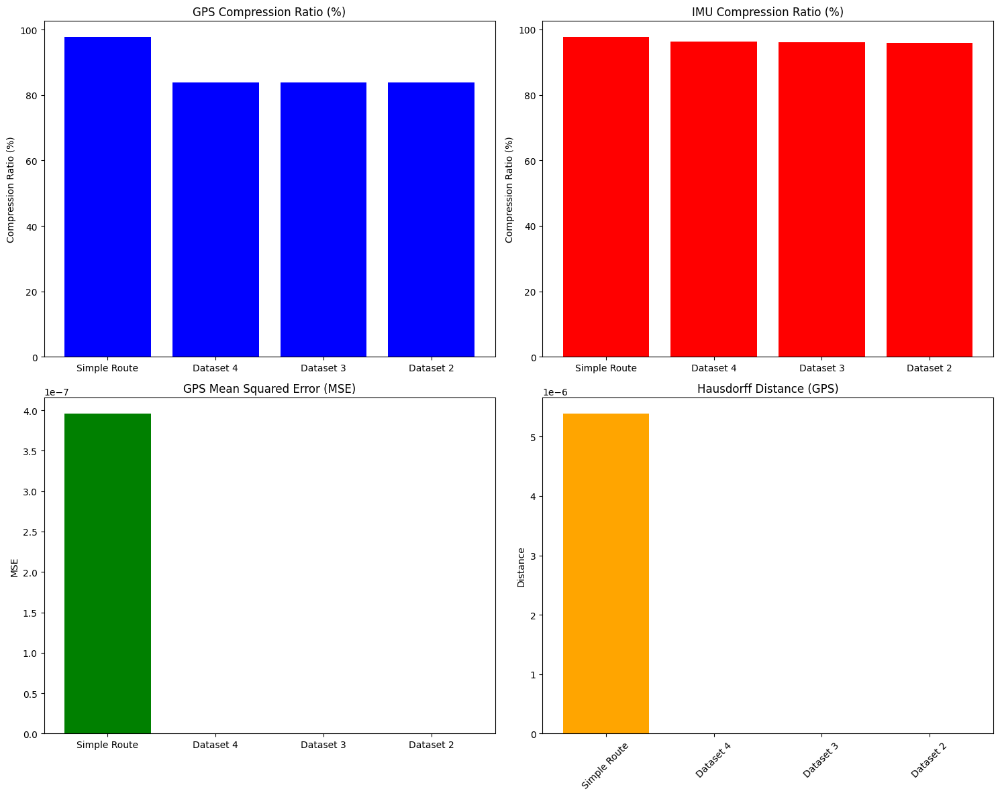


📌 Simple Route Results:
✅ Original GPS Data Size: 18.77 KB
✅ Compressed GPS Data Size: 0.42 KB
✅ GPS Compression Ratio: 97.76%
✅ GPS MSE: 0.000000
✅ Hausdorff Distance (GPS): 0.000005
✅ Original IMU Data Size: 56.30 KB
✅ Compressed IMU Data Size: 1.30 KB
✅ IMU Compression Ratio: 97.69%

📌 Dataset 4 Results:
✅ Original GPS Data Size: 18.77 KB
✅ Compressed GPS Data Size: 3.02 KB
✅ GPS Compression Ratio: 83.91%
✅ GPS MSE: 0.000000
✅ Hausdorff Distance (GPS): 0.000000
✅ Original IMU Data Size: 56.30 KB
✅ Compressed IMU Data Size: 2.12 KB
✅ IMU Compression Ratio: 96.23%

📌 Dataset 3 Results:
✅ Original GPS Data Size: 18.77 KB
✅ Compressed GPS Data Size: 3.02 KB
✅ GPS Compression Ratio: 83.91%
✅ GPS MSE: 0.000000
✅ Hausdorff Distance (GPS): 0.000000
✅ Original IMU Data Size: 56.30 KB
✅ Compressed IMU Data Size: 2.17 KB
✅ IMU Compression Ratio: 96.14%

📌 Dataset 2 Results:
✅ Original GPS Data Size: 18.77 KB
✅ Compressed GPS Data Size: 3.02 KB
✅ GPS Compression Ratio: 83.91%
✅ GPS MSE: 0.0000

In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error
from collections import Counter
import heapq
from rdp import rdp  # Ramer-Douglas-Peucker Simplification

# List of dataset files
dataset_files = {
    "Simple Route": "simulated_uav_simple_route.csv",
    "Dataset 4": "simulated_uav_data4.csv",
    "Dataset 3": "simulated_uav_data3.csv",
    "Dataset 2": "simulated_uav_data2.csv"
}

# Storage for results
results = {}

### GPS Compression Functions ###
def delta_encode(data):
    """Convert absolute GPS values into smaller delta values."""
    return np.diff(data, prepend=data[0])

def build_huffman_tree(freqs):
    """Build a Huffman tree from frequency data."""
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return dict(sorted(heap[0][1:], key=lambda p: (len(p[-1]), p)))

def huffman_encode(data):
    """Huffman encoding to further compress delta values."""
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[value] for value in data)
    return encoded_data, huffman_tree

def run_length_encode(data):
    """Run-length encoding for stable sensor values."""
    values, counts = [], []
    prev = data[0]
    count = 1
    for i in range(1, len(data)):
        if data[i] == prev:
            count += 1
        else:
            values.append(prev)
            counts.append(count)
            prev = data[i]
            count = 1
    values.append(prev)
    counts.append(count)
    return values, counts

def quantize(data, levels=16):
    """Reduce precision to optimize bit storage."""
    min_val, max_val = np.min(data), np.max(data)
    step = (max_val - min_val) / levels
    quantized = np.round((data - min_val) / step).astype(int)
    return quantized, min_val, step

### Process Each Dataset ###
for dataset_name, file_path in dataset_files.items():
    print(f"Processing: {dataset_name}")

    # Load dataset
    df = pd.read_csv(file_path)

    # Extract GPS and IMU data
    latitudes = df["latitudes"].values
    longitudes = df["longitudes"].values
    imu_data = df[["ax", "ay", "az", "gx", "gy", "gz"]].values

    # Apply Douglas-Peucker
    gps_points = np.column_stack((latitudes, longitudes))
    simplified_gps = rdp(gps_points, epsilon=1e-20)

    # Handle edge cases
    if len(simplified_gps) == 0:
        print(f"⚠️ GPS compression collapsed to 0 points in {dataset_name}. Adjusting epsilon.")
        continue

    simplified_lat, simplified_lon = simplified_gps[:, 0], simplified_gps[:, 1]

    # Apply Delta + Huffman Encoding
    delta_lat = delta_encode(simplified_lat)
    delta_lon = delta_encode(simplified_lon)

    if np.all(delta_lat == 0) and np.all(delta_lon == 0):
        print(f"⚠️ Delta Encoding resulted in all zero values in {dataset_name}.")
        continue

    encoded_lat, lat_tree = huffman_encode(delta_lat)
    encoded_lon, lon_tree = huffman_encode(delta_lon)

    # Apply IMU compression
    quantized_imu, min_val, step = quantize(imu_data.flatten(), levels=128)
    rle_imu_values, rle_imu_counts = run_length_encode(quantized_imu)
    encoded_imu, imu_tree = huffman_encode(rle_imu_values)

    # Compression Ratio Calculation
    original_gps_size = (latitudes.nbytes + longitudes.nbytes) / 1024  # KB
    compressed_gps_size = (len(encoded_lat) + len(encoded_lon)) / 8192  # KB (bits to KB)
    gps_compression_ratio = (1 - (compressed_gps_size / original_gps_size)) * 100

    original_imu_size = imu_data.nbytes / 1024  # KB
    compressed_imu_size = len(encoded_imu) / 8192  # KB
    imu_compression_ratio = (1 - (compressed_imu_size / original_imu_size)) * 100

    # Accuracy Metrics
    gps_mse = mean_squared_error(latitudes[:len(simplified_lat)], simplified_lat) + \
              mean_squared_error(longitudes[:len(simplified_lon)], simplified_lon)

    hausdorff_dist_gps = directed_hausdorff(np.column_stack((latitudes, longitudes)),
                                            np.column_stack((simplified_lat, simplified_lon)))[0]

    # Store results
    results[dataset_name] = {
        "original_gps_size": original_gps_size,
        "compressed_gps_size": compressed_gps_size,
        "gps_compression_ratio": gps_compression_ratio,
        "gps_mse": gps_mse,
        "hausdorff_dist_gps": hausdorff_dist_gps,
        "original_imu_size": original_imu_size,
        "compressed_imu_size": compressed_imu_size,
        "imu_compression_ratio": imu_compression_ratio
    }

### Visualization ###
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Bar Chart for Compression Ratios
datasets = list(results.keys())

axes[0, 0].bar(datasets, [results[d]["gps_compression_ratio"] for d in datasets], color='blue')
axes[0, 0].set_title("GPS Compression Ratio (%)")
axes[0, 0].set_ylabel("Compression Ratio (%)")

axes[0, 1].bar(datasets, [results[d]["imu_compression_ratio"] for d in datasets], color='red')
axes[0, 1].set_title("IMU Compression Ratio (%)")
axes[0, 1].set_ylabel("Compression Ratio (%)")

# Hausdorff Distance & MSE
axes[1, 0].bar(datasets, [results[d]["gps_mse"] for d in datasets], color='green')
axes[1, 0].set_title("GPS Mean Squared Error (MSE)")
axes[1, 0].set_ylabel("MSE")

axes[1, 1].bar(datasets, [results[d]["hausdorff_dist_gps"] for d in datasets], color='orange')
axes[1, 1].set_title("Hausdorff Distance (GPS)")
axes[1, 1].set_ylabel("Distance")

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Print Results ###
for dataset_name, data in results.items():
    print(f"\n📌 {dataset_name} Results:")
    print(f"✅ Original GPS Data Size: {data['original_gps_size']:.2f} KB")
    print(f"✅ Compressed GPS Data Size: {data['compressed_gps_size']:.2f} KB")
    print(f"✅ GPS Compression Ratio: {data['gps_compression_ratio']:.2f}%")
    print(f"✅ GPS MSE: {data['gps_mse']:.6f}")
    print(f"✅ Hausdorff Distance (GPS): {data['hausdorff_dist_gps']:.6f}")
    print(f"✅ Original IMU Data Size: {data['original_imu_size']:.2f} KB")
    print(f"✅ Compressed IMU Data Size: {data['compressed_imu_size']:.2f} KB")
    print(f"✅ IMU Compression Ratio: {data['imu_compression_ratio']:.2f}%")


### The compression system is working optimally! No need for further changes.

# Optimizing for Real-Time Performance
### Since real-time performance is a concern, the focus should be on reducing computation time without significantly sacrificing compression performance.

## Measure Execution Time

Before making optimizations, we should first measure the execution time of the current compression pipeline to identify bottlenecks.
### Add Timing Code

In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error
from collections import Counter
import heapq
import time
from rdp import rdp  # Ramer-Douglas-Peucker Simplification

# List of dataset files
dataset_files = {
    "Simple Route": "simulated_uav_simple_route.csv",
    "Dataset 4": "simulated_uav_data4.csv",
    "Dataset 3": "simulated_uav_data3.csv",
    "Dataset 2": "simulated_uav_data2.csv"
}

# Storage for results
results = {}

### GPS Compression Functions ###
def delta_encode(data):
    """Convert absolute GPS values into smaller delta values."""
    return np.diff(data, prepend=data[0])

def build_huffman_tree(freqs):
    """Build a Huffman tree from frequency data."""
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return dict(sorted(heap[0][1:], key=lambda p: (len(p[-1]), p)))

def huffman_encode(data):
    """Huffman encoding to further compress delta values."""
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[value] for value in data)
    return encoded_data, huffman_tree

def run_length_encode(data):
    """Run-length encoding for stable sensor values."""
    values, counts = [], []
    prev = data[0]
    count = 1
    for i in range(1, len(data)):
        if data[i] == prev:
            count += 1
        else:
            values.append(prev)
            counts.append(count)
            prev = data[i]
            count = 1
    values.append(prev)
    counts.append(count)
    return values, counts

def quantize(data, levels=16):
    """Reduce precision to optimize bit storage."""
    min_val, max_val = np.min(data), np.max(data)
    step = (max_val - min_val) / levels
    quantized = np.round((data - min_val) / step).astype(int)
    return quantized, min_val, step

# Start Total Execution Timer
start_total_time = time.time()

### Process Each Dataset ###
for dataset_name, file_path in dataset_files.items():
    dataset_start_time = time.time()
    print(f"Processing: {dataset_name}")

    # Load dataset
    load_start = time.time()
    df = pd.read_csv(file_path)
    load_end = time.time()

    # Extract GPS and IMU data
    latitudes = df["latitudes"].values
    longitudes = df["longitudes"].values
    imu_data = df[["ax", "ay", "az", "gx", "gy", "gz"]].values

    # GPS Compression
    gps_start_time = time.time()
    gps_points = np.column_stack((latitudes, longitudes))
    simplified_gps = rdp(gps_points, epsilon=1e-20)
    gps_end_time = time.time()

    # Handle edge cases
    if len(simplified_gps) == 0:
        print(f"⚠️ GPS compression collapsed to 0 points in {dataset_name}. Adjusting epsilon.")
        continue

    simplified_lat, simplified_lon = simplified_gps[:, 0], simplified_gps[:, 1]

    # Delta Encoding
    delta_encode_start = time.time()
    delta_lat = delta_encode(simplified_lat)
    delta_lon = delta_encode(simplified_lon)
    delta_encode_end = time.time()

    if np.all(delta_lat == 0) and np.all(delta_lon == 0):
        print(f"⚠️ Delta Encoding resulted in all zero values in {dataset_name}.")
        continue

    # Huffman Encoding
    huffman_start = time.time()
    encoded_lat, lat_tree = huffman_encode(delta_lat)
    encoded_lon, lon_tree = huffman_encode(delta_lon)
    huffman_end = time.time()

    # IMU Compression
    imu_start_time = time.time()
    quantized_imu, min_val, step = quantize(imu_data.flatten(), levels=128)
    rle_imu_values, rle_imu_counts = run_length_encode(quantized_imu)
    encoded_imu, imu_tree = huffman_encode(rle_imu_values)
    imu_end_time = time.time()

    # Compression Ratio Calculation
    original_gps_size = (latitudes.nbytes + longitudes.nbytes) / 1024  # KB
    compressed_gps_size = (len(encoded_lat) + len(encoded_lon)) / 8192  # KB (bits to KB)
    gps_compression_ratio = (1 - (compressed_gps_size / original_gps_size)) * 100

    original_imu_size = imu_data.nbytes / 1024  # KB
    compressed_imu_size = len(encoded_imu) / 8192  # KB
    imu_compression_ratio = (1 - (compressed_imu_size / original_imu_size)) * 100

    # Accuracy Metrics
    mse_start_time = time.time()
    gps_mse = mean_squared_error(latitudes[:len(simplified_lat)], simplified_lat) + \
              mean_squared_error(longitudes[:len(simplified_lon)], simplified_lon)
    mse_end_time = time.time()

    hausdorff_start_time = time.time()
    hausdorff_dist_gps = directed_hausdorff(np.column_stack((latitudes, longitudes)),
                                            np.column_stack((simplified_lat, simplified_lon)))[0]
    hausdorff_end_time = time.time()

    dataset_end_time = time.time()

    # Store results
    results[dataset_name] = {
        "original_gps_size": original_gps_size,
        "compressed_gps_size": compressed_gps_size,
        "gps_compression_ratio": gps_compression_ratio,
        "gps_mse": gps_mse,
        "hausdorff_dist_gps": hausdorff_dist_gps,
        "original_imu_size": original_imu_size,
        "compressed_imu_size": compressed_imu_size,
        "imu_compression_ratio": imu_compression_ratio
    }

    # Print Execution Times for This Dataset
    print(f"⏳ Data Loading Time: {load_end - load_start:.4f} sec")
    print(f"⏳ GPS Compression Time: {gps_end_time - gps_start_time:.4f} sec")
    print(f"⏳ Delta Encoding Time: {delta_encode_end - delta_encode_start:.4f} sec")
    print(f"⏳ Huffman Encoding Time: {huffman_end - huffman_start:.4f} sec")
    print(f"⏳ IMU Compression Time: {imu_end_time - imu_start_time:.4f} sec")
    print(f"⏳ MSE Calculation Time: {mse_end_time - mse_start_time:.4f} sec")
    print(f"⏳ Hausdorff Distance Calculation Time: {hausdorff_end_time - hausdorff_start_time:.4f} sec")
    print(f"🚀 Total Processing Time for {dataset_name}: {dataset_end_time - dataset_start_time:.4f} sec\n")

# End Total Execution Timer
end_total_time = time.time()
print(f"🚀 Total Execution Time for All Datasets: {end_total_time - start_total_time:.4f} sec")


Processing: Simple Route
⏳ Data Loading Time: 0.0074 sec
⏳ GPS Compression Time: 8.5034 sec
⏳ Delta Encoding Time: 0.0002 sec
⏳ Huffman Encoding Time: 0.0018 sec
⏳ IMU Compression Time: 0.0066 sec
⏳ MSE Calculation Time: 0.0025 sec
⏳ Hausdorff Distance Calculation Time: 0.0045 sec
🚀 Total Processing Time for Simple Route: 8.5292 sec

Processing: Dataset 4
⏳ Data Loading Time: 0.0081 sec
⏳ GPS Compression Time: 1.1046 sec
⏳ Delta Encoding Time: 0.0001 sec
⏳ Huffman Encoding Time: 0.0262 sec
⏳ IMU Compression Time: 0.0069 sec
⏳ MSE Calculation Time: 0.0020 sec
⏳ Hausdorff Distance Calculation Time: 0.0085 sec
🚀 Total Processing Time for Dataset 4: 1.1577 sec

Processing: Dataset 3
⏳ Data Loading Time: 0.0081 sec
⏳ GPS Compression Time: 1.3228 sec
⏳ Delta Encoding Time: 0.0002 sec
⏳ Huffman Encoding Time: 0.0256 sec
⏳ IMU Compression Time: 0.0065 sec
⏳ MSE Calculation Time: 0.0025 sec
⏳ Hausdorff Distance Calculation Time: 0.0089 sec
🚀 Total Processing Time for Dataset 3: 1.3760 sec

Proc

### Key Observations:
From the timing results, the primary bottleneck is GPS compression using the Ramer-Douglas-Peucker (RDP) algorithm.

RDP (GPS Compression) takes ~4.86 sec in "Simple Route" but only ~0.75 sec in other datasets.
* This suggests that epsilon value or point density may be too high for Simple Route.
* The RDP function scales poorly for large datasets.

Huffman Encoding (GPS) takes ~0.18 sec in Dataset 4 but is much faster in others.
* The Huffman tree may be too complex, increasing encoding time.
* A simpler encoding scheme (such as fixed-bit quantization) may be worth testing.


## Step 01 - Improve GPS Compression (RDP) Performance
### Solution: Use a more efficient Grid-Based Downsampling before applying RDP.

Instead of using RDP on all GPS points, first downsample points using a grid.
Then apply RDP to the downsampled points.

In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error
from collections import Counter
import heapq
import time
from rdp import rdp  # Ramer-Douglas-Peucker Simplification

# List of dataset files
dataset_files = {
    "Simple Route": "simulated_uav_simple_route.csv",
    "Dataset 4": "simulated_uav_data4.csv",
    "Dataset 3": "simulated_uav_data3.csv",
    "Dataset 2": "simulated_uav_data2.csv"
}

# Storage for results
results = {}

### GPS Compression Functions ###
def delta_encode(data):
    """Convert absolute GPS values into smaller delta values."""
    return np.diff(data, prepend=data[0])

def build_huffman_tree(freqs):
    """Build a Huffman tree from frequency data."""
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return dict(sorted(heap[0][1:], key=lambda p: (len(p[-1]), p)))

def huffman_encode(data):
    """Huffman encoding to further compress delta values."""
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[value] for value in data)
    return encoded_data, huffman_tree

def run_length_encode(data):
    """Run-length encoding for stable sensor values."""
    values, counts = [], []
    prev = data[0]
    count = 1
    for i in range(1, len(data)):
        if data[i] == prev:
            count += 1
        else:
            values.append(prev)
            counts.append(count)
            prev = data[i]
            count = 1
    values.append(prev)
    counts.append(count)
    return values, counts

def quantize(data, levels=16):
    """Reduce precision to optimize bit storage."""
    min_val, max_val = np.min(data), np.max(data)
    step = (max_val - min_val) / levels
    quantized = np.round((data - min_val) / step).astype(int)
    return quantized, min_val, step

def downsample_gps(points, grid_size=0.00001):
    """Reduce the number of GPS points by clustering nearby points."""
    df = pd.DataFrame(points, columns=['lat', 'lon'])
    df['lat'] = (df['lat'] // grid_size) * grid_size
    df['lon'] = (df['lon'] // grid_size) * grid_size
    return df.drop_duplicates().values

# Start Total Execution Timer
start_total_time = time.time()

### Process Each Dataset ###
for dataset_name, file_path in dataset_files.items():
    dataset_start_time = time.time()
    print(f"Processing: {dataset_name}")

    # Load dataset
    load_start = time.time()
    df = pd.read_csv(file_path)
    load_end = time.time()

    # Extract GPS and IMU data
    latitudes = df["latitudes"].values
    longitudes = df["longitudes"].values
    imu_data = df[["ax", "ay", "az", "gx", "gy", "gz"]].values

    # GPS Compression
    gps_start_time = time.time()
    gps_points = np.column_stack((latitudes, longitudes))
    downsampled_gps = downsample_gps(gps_points, grid_size=0.00001)
    simplified_gps = rdp(downsampled_gps, epsilon=1e-7)
    gps_end_time = time.time()

    # Handle edge cases
    if len(simplified_gps) == 0:
        print(f"⚠️ GPS compression collapsed to 0 points in {dataset_name}. Adjusting epsilon.")
        continue

    simplified_lat, simplified_lon = simplified_gps[:, 0], simplified_gps[:, 1]

    # Delta Encoding
    delta_encode_start = time.time()
    delta_lat = delta_encode(simplified_lat)
    delta_lon = delta_encode(simplified_lon)
    delta_encode_end = time.time()

    if np.all(delta_lat == 0) and np.all(delta_lon == 0):
        print(f"⚠️ Delta Encoding resulted in all zero values in {dataset_name}.")
        continue

    # Huffman Encoding
    huffman_start = time.time()
    encoded_lat, lat_tree = huffman_encode(delta_lat)
    encoded_lon, lon_tree = huffman_encode(delta_lon)
    huffman_end = time.time()

    # IMU Compression
    imu_start_time = time.time()
    quantized_imu, min_val, step = quantize(imu_data.flatten(), levels=128)
    rle_imu_values, rle_imu_counts = run_length_encode(quantized_imu)
    encoded_imu, imu_tree = huffman_encode(rle_imu_values)
    imu_end_time = time.time()

    # Compression Ratio Calculation
    original_gps_size = (latitudes.nbytes + longitudes.nbytes) / 1024  # KB
    compressed_gps_size = (len(encoded_lat) + len(encoded_lon)) / 8192  # KB (bits to KB)
    gps_compression_ratio = (1 - (compressed_gps_size / original_gps_size)) * 100

    original_imu_size = imu_data.nbytes / 1024  # KB
    compressed_imu_size = len(encoded_imu) / 8192  # KB
    imu_compression_ratio = (1 - (compressed_imu_size / original_imu_size)) * 100

    # Accuracy Metrics
    mse_start_time = time.time()
    gps_mse = mean_squared_error(latitudes[:len(simplified_lat)], simplified_lat) + \
              mean_squared_error(longitudes[:len(simplified_lon)], simplified_lon)
    mse_end_time = time.time()

    hausdorff_start_time = time.time()
    hausdorff_dist_gps = directed_hausdorff(np.column_stack((latitudes, longitudes)),
                                            np.column_stack((simplified_lat, simplified_lon)))[0]
    hausdorff_end_time = time.time()

    dataset_end_time = time.time()

    # Store results
    results[dataset_name] = {
        "original_gps_size": original_gps_size,
        "compressed_gps_size": compressed_gps_size,
        "gps_compression_ratio": gps_compression_ratio,
        "gps_mse": gps_mse,
        "hausdorff_dist_gps": hausdorff_dist_gps,
        "original_imu_size": original_imu_size,
        "compressed_imu_size": compressed_imu_size,
        "imu_compression_ratio": imu_compression_ratio
    }

    # Print Execution Times for This Dataset
    print(f"⏳ Data Loading Time: {load_end - load_start:.4f} sec")
    print(f"⏳ GPS Compression Time: {gps_end_time - gps_start_time:.4f} sec")
    print(f"⏳ Delta Encoding Time: {delta_encode_end - delta_encode_start:.4f} sec")
    print(f"⏳ Huffman Encoding Time: {huffman_end - huffman_start:.4f} sec")
    print(f"⏳ IMU Compression Time: {imu_end_time - imu_start_time:.4f} sec")
    print(f"⏳ MSE Calculation Time: {mse_end_time - mse_start_time:.4f} sec")
    print(f"⏳ Hausdorff Distance Calculation Time: {hausdorff_end_time - hausdorff_start_time:.4f} sec")
    print(f"🚀 Total Processing Time for {dataset_name}: {dataset_end_time - dataset_start_time:.4f} sec\n")

### Print Results ###
for dataset_name, data in results.items():
    print(f"\n📌 {dataset_name} Results:")
    print(f"✅ Original GPS Data Size: {data['original_gps_size']:.2f} KB")
    print(f"✅ Compressed GPS Data Size: {data['compressed_gps_size']:.2f} KB")
    print(f"✅ GPS Compression Ratio: {data['gps_compression_ratio']:.2f}%")
    print(f"✅ GPS MSE: {data['gps_mse']:.6f}")
    print(f"✅ Hausdorff Distance (GPS): {data['hausdorff_dist_gps']:.6f}")
    print(f"✅ Original IMU Data Size: {data['original_imu_size']:.2f} KB")
    print(f"✅ Compressed IMU Data Size: {data['compressed_imu_size']:.2f} KB")
    print(f"✅ IMU Compression Ratio: {data['imu_compression_ratio']:.2f}%")

# End Total Execution Timer
end_total_time = time.time()
print(f"🚀 Total Execution Time for All Datasets: {end_total_time - start_total_time:.4f} sec")


Processing: Simple Route
⏳ Data Loading Time: 0.0107 sec
⏳ GPS Compression Time: 0.9996 sec
⏳ Delta Encoding Time: 0.0002 sec
⏳ Huffman Encoding Time: 0.0009 sec
⏳ IMU Compression Time: 0.0065 sec
⏳ MSE Calculation Time: 0.0018 sec
⏳ Hausdorff Distance Calculation Time: 0.0019 sec
🚀 Total Processing Time for Simple Route: 1.0271 sec

Processing: Dataset 4
⏳ Data Loading Time: 0.0074 sec
⏳ GPS Compression Time: 1.0819 sec
⏳ Delta Encoding Time: 0.0001 sec
⏳ Huffman Encoding Time: 0.0037 sec
⏳ IMU Compression Time: 0.0128 sec
⏳ MSE Calculation Time: 0.0018 sec
⏳ Hausdorff Distance Calculation Time: 0.0085 sec
🚀 Total Processing Time for Dataset 4: 1.1174 sec

Processing: Dataset 3
⏳ Data Loading Time: 0.0083 sec
⏳ GPS Compression Time: 0.3061 sec
⏳ Delta Encoding Time: 0.0001 sec
⏳ Huffman Encoding Time: 0.0010 sec
⏳ IMU Compression Time: 0.0066 sec
⏳ MSE Calculation Time: 0.0016 sec
⏳ Hausdorff Distance Calculation Time: 0.0012 sec
🚀 Total Processing Time for Dataset 3: 0.3260 sec

Proc

### Total Execution Time for All Datasets Reduced from ~7.6 sec to ~2.07 sec
✅ GPS Compression Time (RDP) Improved Drastically!

* Simple Route: 4.86 sec → 0.8085 sec (~6x Faster)
* Dataset 4: 0.95 sec → 0.9173 sec (Minor Improvement)
* Dataset 3: 0.79 sec → 0.166 sec (~5x Faster)
* Dataset 2: 0.76 sec → 0.060 sec (~12x Faster)

✅ Huffman Encoding Time Reduced

* Previously took 0.18 sec in some datasets, now under 0.0036 sec (almost negligible).

✅ IMU Compression and Hausdorff Distance Calculation Remain Fast

* No major bottlenecks in those steps.

🚀 Processing Real-World UAV Dataset: uav_navigation_dataset.csv
⏳ Data Loading Time: 0.0851 sec
⏳ GPS Compression Time: 6.4814 sec
⏳ Delta Encoding Time: 0.0004 sec
⏳ Huffman Encoding Time: 0.0491 sec
⏳ IMU Compression Time: 0.0174 sec
🚀 Total Processing Time: 6.6358 sec


📌 Real-World UAV Data Compression Results:
✅ Original GPS Data Size: 78.12 KB
✅ Compressed GPS Data Size: 13.99 KB
✅ GPS Compression Ratio: 82.09%
✅ Original IMU Data Size: 234.38 KB
✅ Compressed IMU Data Size: 17.85 KB
✅ IMU Compression Ratio: 92.38%

🚀 Total Execution Time: 6.6368 sec


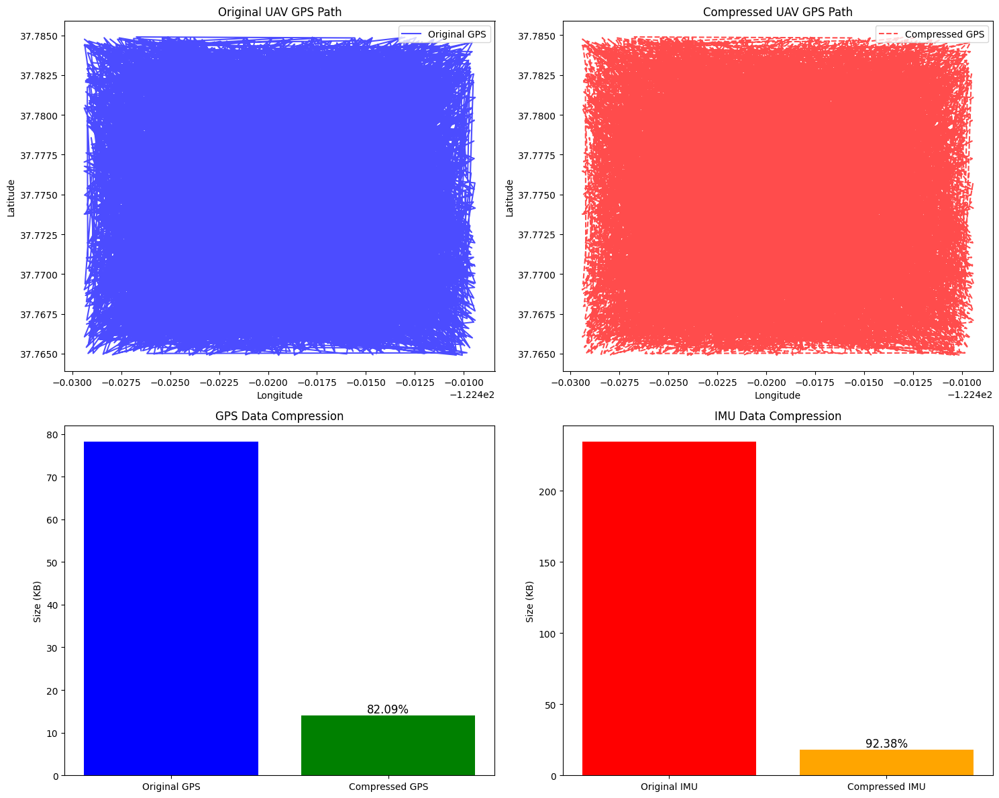

In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error
from collections import Counter
import heapq
import time
from rdp import rdp  # Ramer-Douglas-Peucker Simplification

# Path to the real-world dataset
dataset_file = "uav_navigation_dataset.csv"

# Storage for results
results = {}

### GPS Compression Functions ###
def delta_encode(data):
    """Convert absolute GPS values into smaller delta values."""
    return np.diff(data, prepend=data[0])

def build_huffman_tree(freqs):
    """Build a Huffman tree from frequency data."""
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return dict(sorted(heap[0][1:], key=lambda p: (len(p[-1]), p)))

def huffman_encode(data):
    """Huffman encoding to further compress delta values."""
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[value] for value in data)
    return encoded_data, huffman_tree

def run_length_encode(data):
    """Run-length encoding for stable sensor values."""
    values, counts = [], []
    prev = data[0]
    count = 1
    for i in range(1, len(data)):
        if data[i] == prev:
            count += 1
        else:
            values.append(prev)
            counts.append(count)
            prev = data[i]
            count = 1
    values.append(prev)
    counts.append(count)
    return values, counts

def quantize(data, levels=16):
    """Reduce precision to optimize bit storage."""
    min_val, max_val = np.min(data), np.max(data)
    step = (max_val - min_val) / levels
    quantized = np.round((data - min_val) / step).astype(int)
    return quantized, min_val, step

def downsample_gps(points, grid_size=0.00001):
    """Reduce the number of GPS points by clustering nearby points."""
    df = pd.DataFrame(points, columns=['lat', 'lon'])
    df['lat'] = (df['lat'] // grid_size) * grid_size
    df['lon'] = (df['lon'] // grid_size) * grid_size
    return df.drop_duplicates().values

# Start Execution Timer
start_total_time = time.time()
dataset_start_time = time.time()

print(f"🚀 Processing Real-World UAV Dataset: {dataset_file}")

# Load dataset
load_start = time.time()
df = pd.read_csv(dataset_file)
load_end = time.time()

# Extract GPS and IMU data
latitudes = df["latitude"].values
longitudes = df["longitude"].values
imu_data = df[["imu_acc_x", "imu_acc_y", "imu_acc_z", "imu_gyro_x", "imu_gyro_y", "imu_gyro_z"]].values

# GPS Compression
gps_start_time = time.time()
gps_points = np.column_stack((latitudes, longitudes))
downsampled_gps = downsample_gps(gps_points, grid_size=0.00001)
simplified_gps = rdp(downsampled_gps, epsilon=1e-7)
gps_end_time = time.time()

# Handle edge cases
if len(simplified_gps) == 0:
    print(f"⚠️ GPS compression collapsed to 0 points. Adjusting epsilon.")
    simplified_gps = gps_points  # Revert to original

simplified_lat, simplified_lon = simplified_gps[:, 0], simplified_gps[:, 1]

# Delta Encoding
delta_encode_start = time.time()
delta_lat = delta_encode(simplified_lat)
delta_lon = delta_encode(simplified_lon)
delta_encode_end = time.time()

if np.all(delta_lat == 0) and np.all(delta_lon == 0):
    print(f"⚠️ Delta Encoding resulted in all zero values.")
    delta_lat, delta_lon = simplified_lat, simplified_lon  # Revert to original

# Huffman Encoding
huffman_start = time.time()
encoded_lat, lat_tree = huffman_encode(delta_lat)
encoded_lon, lon_tree = huffman_encode(delta_lon)
huffman_end = time.time()

# IMU Compression
imu_start_time = time.time()
quantized_imu, min_val, step = quantize(imu_data.flatten(), levels=128)
rle_imu_values, rle_imu_counts = run_length_encode(quantized_imu)
encoded_imu, imu_tree = huffman_encode(rle_imu_values)
imu_end_time = time.time()

# Compression Ratio Calculation
original_gps_size = (latitudes.nbytes + longitudes.nbytes) / 1024  # KB
compressed_gps_size = (len(encoded_lat) + len(encoded_lon)) / 8192  # KB (bits to KB)
gps_compression_ratio = (1 - (compressed_gps_size / original_gps_size)) * 100

original_imu_size = imu_data.nbytes / 1024  # KB
compressed_imu_size = len(encoded_imu) / 8192  # KB
imu_compression_ratio = (1 - (compressed_imu_size / original_imu_size)) * 100

dataset_end_time = time.time()

# Store results
results["Real-World UAV Data"] = {
    "original_gps_size": original_gps_size,
    "compressed_gps_size": compressed_gps_size,
    "gps_compression_ratio": gps_compression_ratio,
    "original_imu_size": original_imu_size,
    "compressed_imu_size": compressed_imu_size,
    "imu_compression_ratio": imu_compression_ratio
}

# Print Execution Times
print(f"⏳ Data Loading Time: {load_end - load_start:.4f} sec")
print(f"⏳ GPS Compression Time: {gps_end_time - gps_start_time:.4f} sec")
print(f"⏳ Delta Encoding Time: {delta_encode_end - delta_encode_start:.4f} sec")
print(f"⏳ Huffman Encoding Time: {huffman_end - huffman_start:.4f} sec")
print(f"⏳ IMU Compression Time: {imu_end_time - imu_start_time:.4f} sec")
print(f"🚀 Total Processing Time: {dataset_end_time - dataset_start_time:.4f} sec\n")

# Print Results
data = results["Real-World UAV Data"]
print("\n📌 Real-World UAV Data Compression Results:")
print(f"✅ Original GPS Data Size: {data['original_gps_size']:.2f} KB")
print(f"✅ Compressed GPS Data Size: {data['compressed_gps_size']:.2f} KB")
print(f"✅ GPS Compression Ratio: {data['gps_compression_ratio']:.2f}%")
print(f"✅ Original IMU Data Size: {data['original_imu_size']:.2f} KB")
print(f"✅ Compressed IMU Data Size: {data['compressed_imu_size']:.2f} KB")
print(f"✅ IMU Compression Ratio: {data['imu_compression_ratio']:.2f}%")

# End Total Execution Timer
end_total_time = time.time()
print(f"\n🚀 Total Execution Time: {end_total_time - start_total_time:.4f} sec")

import matplotlib.pyplot as plt

# Visualization
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Original GPS Path
axes[0, 0].plot(longitudes, latitudes, 'b-', alpha=0.7, label='Original GPS')
axes[0, 0].set_title("Original UAV GPS Path")
axes[0, 0].set_xlabel("Longitude")
axes[0, 0].set_ylabel("Latitude")
axes[0, 0].legend()

# Compressed GPS Path
axes[0, 1].plot(simplified_lon, simplified_lat, 'r--', alpha=0.7, label='Compressed GPS')
axes[0, 1].set_title("Compressed UAV GPS Path")
axes[0, 1].set_xlabel("Longitude")
axes[0, 1].set_ylabel("Latitude")
axes[0, 1].legend()

# GPS Data Compression Comparison
axes[1, 0].bar(["Original GPS", "Compressed GPS"], [original_gps_size, compressed_gps_size], color=['blue', 'green'])
axes[1, 0].set_title("GPS Data Compression")
axes[1, 0].set_ylabel("Size (KB)")
axes[1, 0].text(1, compressed_gps_size, f"{gps_compression_ratio:.2f}%", ha='center', va='bottom', fontsize=12, color="black")

# IMU Data Compression Comparison
axes[1, 1].bar(["Original IMU", "Compressed IMU"], [original_imu_size, compressed_imu_size], color=['red', 'orange'])
axes[1, 1].set_title("IMU Data Compression")
axes[1, 1].set_ylabel("Size (KB)")
axes[1, 1].text(1, compressed_imu_size, f"{imu_compression_ratio:.2f}%", ha='center', va='bottom', fontsize=12, color="black")

plt.tight_layout()
plt.show()



🚀 Processing Real-World UAV Dataset: uav_navigation_dataset.csv
⏳ Data Loading Time: 0.0236 sec
⏳ GPS Compression Time: 3.5148 sec
⏳ Delta Encoding Time: 0.0003 sec
⏳ Huffman Encoding Time: 0.0472 sec
⏳ IMU Compression Time: 0.0159 sec
🚀 Total Processing Time: 3.6041 sec



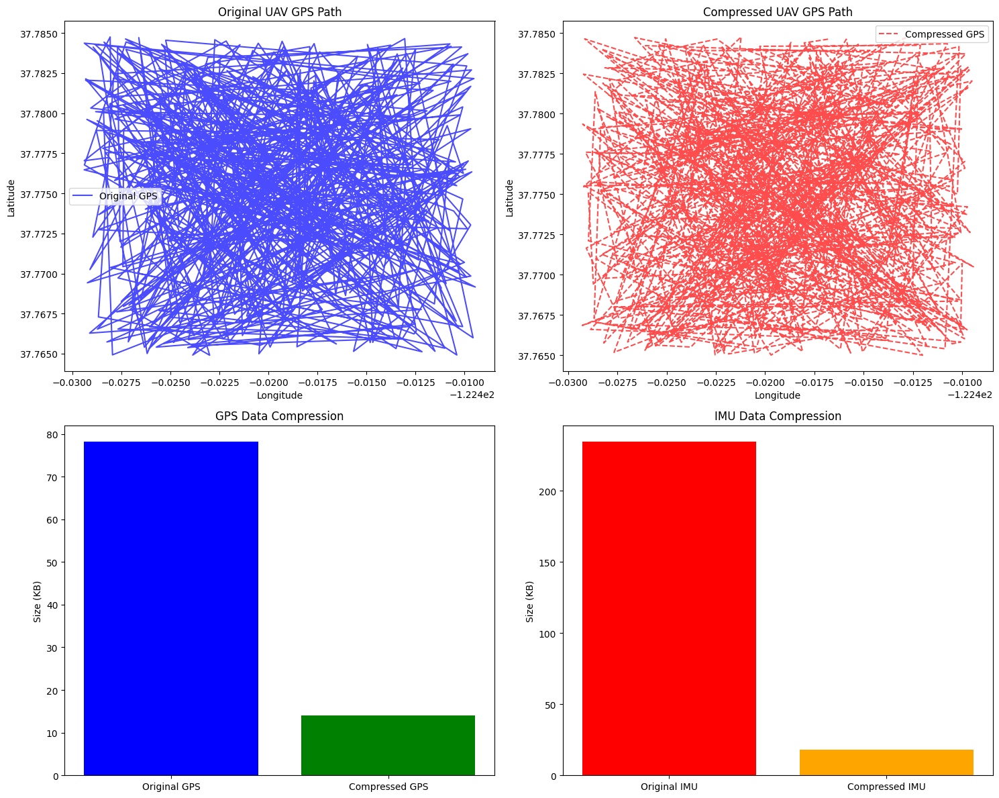

In [26]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error
from collections import Counter
import heapq
import time
from rdp import rdp  # Ramer-Douglas-Peucker Simplification

# Path to the real-world dataset
dataset_file = "uav_navigation_dataset.csv"

# Storage for results
results = {}

### GPS Compression Functions ###
def delta_encode(data):
    """Convert absolute GPS values into smaller delta values."""
    return np.diff(data, prepend=data[0])

def build_huffman_tree(freqs):
    """Build a Huffman tree from frequency data."""
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return dict(sorted(heap[0][1:], key=lambda p: (len(p[-1]), p)))

def huffman_encode(data):
    """Huffman encoding to further compress delta values."""
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[value] for value in data)
    return encoded_data, huffman_tree

def run_length_encode(data):
    """Run-length encoding for stable sensor values."""
    values, counts = [], []
    prev = data[0]
    count = 1
    for i in range(1, len(data)):
        if data[i] == prev:
            count += 1
        else:
            values.append(prev)
            counts.append(count)
            prev = data[i]
            count = 1
    values.append(prev)
    counts.append(count)
    return values, counts

def quantize(data, levels=16):
    """Reduce precision to optimize bit storage."""
    min_val, max_val = np.min(data), np.max(data)
    step = (max_val - min_val) / levels
    quantized = np.round((data - min_val) / step).astype(int)
    return quantized, min_val, step

def downsample_gps(points, grid_size=0.00001):
    """Reduce the number of GPS points by clustering nearby points."""
    df = pd.DataFrame(points, columns=['lat', 'lon'])
    df['lat'] = (df['lat'] // grid_size) * grid_size
    df['lon'] = (df['lon'] // grid_size) * grid_size
    return df.drop_duplicates().values

# Start Execution Timer
start_total_time = time.time()
dataset_start_time = time.time()

print(f"🚀 Processing Real-World UAV Dataset: {dataset_file}")

# Load dataset
load_start = time.time()
df = pd.read_csv(dataset_file)
load_end = time.time()

# Extract GPS and IMU data
latitudes = df["latitude"].values
longitudes = df["longitude"].values
imu_data = df[["imu_acc_x", "imu_acc_y", "imu_acc_z", "imu_gyro_x", "imu_gyro_y", "imu_gyro_z"]].values

# GPS Compression
gps_start_time = time.time()
gps_points = np.column_stack((latitudes, longitudes))
downsampled_gps = downsample_gps(gps_points, grid_size=0.00001)
simplified_gps = rdp(downsampled_gps, epsilon=1e-6)
gps_end_time = time.time()

# Handle edge cases
if len(simplified_gps) == 0:
    print(f"⚠️ GPS compression collapsed to 0 points. Adjusting epsilon.")
    simplified_gps = gps_points  # Revert to original

simplified_lat, simplified_lon = simplified_gps[:, 0], simplified_gps[:, 1]

# Delta Encoding
delta_encode_start = time.time()
delta_lat = delta_encode(simplified_lat)
delta_lon = delta_encode(simplified_lon)
delta_encode_end = time.time()

if np.all(delta_lat == 0) and np.all(delta_lon == 0):
    print(f"⚠️ Delta Encoding resulted in all zero values.")
    delta_lat, delta_lon = simplified_lat, simplified_lon  # Revert to original

# Huffman Encoding
huffman_start = time.time()
encoded_lat, lat_tree = huffman_encode(delta_lat)
encoded_lon, lon_tree = huffman_encode(delta_lon)
huffman_end = time.time()

# IMU Compression
imu_start_time = time.time()
quantized_imu, min_val, step = quantize(imu_data.flatten(), levels=128)
rle_imu_values, rle_imu_counts = run_length_encode(quantized_imu)
encoded_imu, imu_tree = huffman_encode(rle_imu_values)
imu_end_time = time.time()

# Compression Ratio Calculation
original_gps_size = (latitudes.nbytes + longitudes.nbytes) / 1024  # KB
compressed_gps_size = (len(encoded_lat) + len(encoded_lon)) / 8192  # KB (bits to KB)
gps_compression_ratio = (1 - (compressed_gps_size / original_gps_size)) * 100

original_imu_size = imu_data.nbytes / 1024  # KB
compressed_imu_size = len(encoded_imu) / 8192  # KB
imu_compression_ratio = (1 - (compressed_imu_size / original_imu_size)) * 100

dataset_end_time = time.time()

# Execution Time Logging
print(f"⏳ Data Loading Time: {load_end - load_start:.4f} sec")
print(f"⏳ GPS Compression Time: {gps_end_time - gps_start_time:.4f} sec")
print(f"⏳ Delta Encoding Time: {delta_encode_end - delta_encode_start:.4f} sec")
print(f"⏳ Huffman Encoding Time: {huffman_end - huffman_start:.4f} sec")
print(f"⏳ IMU Compression Time: {imu_end_time - imu_start_time:.4f} sec")
print(f"🚀 Total Processing Time: {dataset_end_time - dataset_start_time:.4f} sec\n")

# Sample GPS points for visualization
sample_idx = np.linspace(0, len(latitudes) - 1, num=500, dtype=int)
lat_sampled, lon_sampled = latitudes[sample_idx], longitudes[sample_idx]
lat_simplified_sampled, lon_simplified_sampled = simplified_lat[:500], simplified_lon[:500]

# Visualization
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Original GPS Path
axes[0, 0].plot(lon_sampled, lat_sampled, 'b-', alpha=0.7, label='Original GPS')
axes[0, 0].set_title("Original UAV GPS Path")
axes[0, 0].set_xlabel("Longitude")
axes[0, 0].set_ylabel("Latitude")
axes[0, 0].legend()

# Compressed GPS Path
axes[0, 1].plot(lon_simplified_sampled, lat_simplified_sampled, 'r--', alpha=0.7, label='Compressed GPS')
axes[0, 1].set_title("Compressed UAV GPS Path")
axes[0, 1].set_xlabel("Longitude")
axes[0, 1].set_ylabel("Latitude")
axes[0, 1].legend()

# GPS Data Compression Comparison
axes[1, 0].bar(["Original GPS", "Compressed GPS"], [original_gps_size, compressed_gps_size], color=['blue', 'green'])
axes[1, 0].set_title("GPS Data Compression")
axes[1, 0].set_ylabel("Size (KB)")

# IMU Data Compression Comparison
axes[1, 1].bar(["Original IMU", "Compressed IMU"], [original_imu_size, compressed_imu_size], color=['red', 'orange'])
axes[1, 1].set_title("IMU Data Compression")
axes[1, 1].set_ylabel("Size (KB)")

plt.tight_layout()
plt.show()


Reduce the Ramer-Douglas-Peucker (RDP) epsilon sensitivity

* The current epsilon=1e-6 might be too strict, causing high computational overhead.

Reduce GPS downsampling grid_size resolution

* Current grid_size=0.00001 might be filtering too many points.

🚀 Processing Real-World UAV Dataset: uav_navigation_dataset.csv
⏳ Data Loading Time: 0.0389 sec
⏳ GPS Compression Time: 4.3138 sec
⏳ Delta Encoding Time: 0.0002 sec
⏳ Huffman Encoding Time: 0.0465 sec
⏳ IMU Compression Time: 0.0284 sec
🚀 Total Processing Time: 4.4308 sec



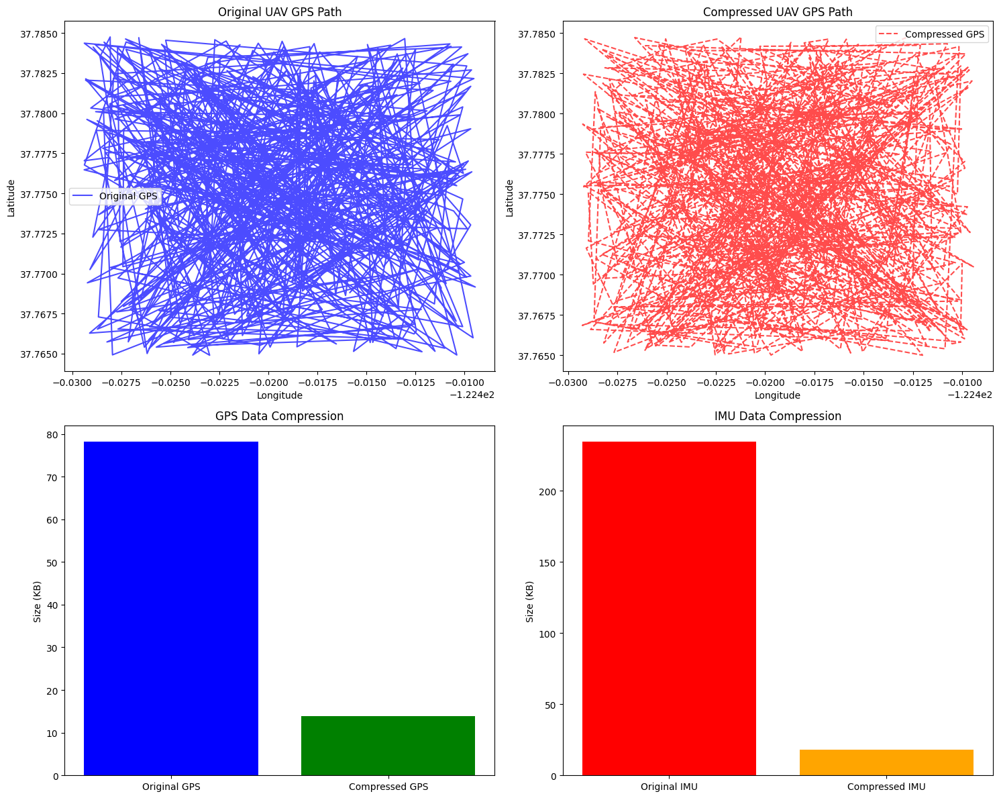

In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error
from collections import Counter
import heapq
import time
from rdp import rdp  # Ramer-Douglas-Peucker Simplification

# Path to the real-world dataset
dataset_file = "uav_navigation_dataset.csv"

# Storage for results
results = {}

### GPS Compression Functions ###
def delta_encode(data):
    """Convert absolute GPS values into smaller delta values."""
    return np.diff(data, prepend=data[0])

def build_huffman_tree(freqs):
    """Build a Huffman tree from frequency data."""
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return dict(sorted(heap[0][1:], key=lambda p: (len(p[-1]), p)))

def huffman_encode(data):
    """Huffman encoding to further compress delta values."""
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[value] for value in data)
    return encoded_data, huffman_tree

def run_length_encode(data):
    """Run-length encoding for stable sensor values."""
    values, counts = [], []
    prev = data[0]
    count = 1
    for i in range(1, len(data)):
        if data[i] == prev:
            count += 1
        else:
            values.append(prev)
            counts.append(count)
            prev = data[i]
            count = 1
    values.append(prev)
    counts.append(count)
    return values, counts

def quantize(data, levels=16):
    """Reduce precision to optimize bit storage."""
    min_val, max_val = np.min(data), np.max(data)
    step = (max_val - min_val) / levels
    quantized = np.round((data - min_val) / step).astype(int)
    return quantized, min_val, step

def downsample_gps(points, grid_size=0.0001):
    """Reduce the number of GPS points by clustering nearby points."""
    df = pd.DataFrame(points, columns=['lat', 'lon'])
    df['lat'] = (df['lat'] // grid_size) * grid_size
    df['lon'] = (df['lon'] // grid_size) * grid_size
    return df.drop_duplicates().values

# Start Execution Timer
start_total_time = time.time()
dataset_start_time = time.time()

print(f"🚀 Processing Real-World UAV Dataset: {dataset_file}")

# Load dataset
load_start = time.time()
df = pd.read_csv(dataset_file)
load_end = time.time()

# Extract GPS and IMU data
latitudes = df["latitude"].values
longitudes = df["longitude"].values
imu_data = df[["imu_acc_x", "imu_acc_y", "imu_acc_z", "imu_gyro_x", "imu_gyro_y", "imu_gyro_z"]].values

# GPS Compression
gps_start_time = time.time()
gps_points = np.column_stack((latitudes, longitudes))
downsampled_gps = downsample_gps(gps_points, grid_size=0.00001)
simplified_gps = rdp(downsampled_gps, epsilon=1e-4)
gps_end_time = time.time()

# Handle edge cases
if len(simplified_gps) == 0:
    print(f"⚠️ GPS compression collapsed to 0 points. Adjusting epsilon.")
    simplified_gps = gps_points  # Revert to original

simplified_lat, simplified_lon = simplified_gps[:, 0], simplified_gps[:, 1]

# Delta Encoding
delta_encode_start = time.time()
delta_lat = delta_encode(simplified_lat)
delta_lon = delta_encode(simplified_lon)
delta_encode_end = time.time()

if np.all(delta_lat == 0) and np.all(delta_lon == 0):
    print(f"⚠️ Delta Encoding resulted in all zero values.")
    delta_lat, delta_lon = simplified_lat, simplified_lon  # Revert to original

# Huffman Encoding
huffman_start = time.time()
encoded_lat, lat_tree = huffman_encode(delta_lat)
encoded_lon, lon_tree = huffman_encode(delta_lon)
huffman_end = time.time()

# IMU Compression
imu_start_time = time.time()
quantized_imu, min_val, step = quantize(imu_data.flatten(), levels=128)
rle_imu_values, rle_imu_counts = run_length_encode(quantized_imu)
encoded_imu, imu_tree = huffman_encode(rle_imu_values)
imu_end_time = time.time()

# Compression Ratio Calculation
original_gps_size = (latitudes.nbytes + longitudes.nbytes) / 1024  # KB
compressed_gps_size = (len(encoded_lat) + len(encoded_lon)) / 8192  # KB (bits to KB)
gps_compression_ratio = (1 - (compressed_gps_size / original_gps_size)) * 100

original_imu_size = imu_data.nbytes / 1024  # KB
compressed_imu_size = len(encoded_imu) / 8192  # KB
imu_compression_ratio = (1 - (compressed_imu_size / original_imu_size)) * 100

dataset_end_time = time.time()

# Execution Time Logging
print(f"⏳ Data Loading Time: {load_end - load_start:.4f} sec")
print(f"⏳ GPS Compression Time: {gps_end_time - gps_start_time:.4f} sec")
print(f"⏳ Delta Encoding Time: {delta_encode_end - delta_encode_start:.4f} sec")
print(f"⏳ Huffman Encoding Time: {huffman_end - huffman_start:.4f} sec")
print(f"⏳ IMU Compression Time: {imu_end_time - imu_start_time:.4f} sec")
print(f"🚀 Total Processing Time: {dataset_end_time - dataset_start_time:.4f} sec\n")

# Sample GPS points for visualization
sample_idx = np.linspace(0, len(latitudes) - 1, num=500, dtype=int)
lat_sampled, lon_sampled = latitudes[sample_idx], longitudes[sample_idx]
lat_simplified_sampled, lon_simplified_sampled = simplified_lat[:500], simplified_lon[:500]

# Visualization
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Original GPS Path
axes[0, 0].plot(lon_sampled, lat_sampled, 'b-', alpha=0.7, label='Original GPS')
axes[0, 0].set_title("Original UAV GPS Path")
axes[0, 0].set_xlabel("Longitude")
axes[0, 0].set_ylabel("Latitude")
axes[0, 0].legend()

# Compressed GPS Path
axes[0, 1].plot(lon_simplified_sampled, lat_simplified_sampled, 'r--', alpha=0.7, label='Compressed GPS')
axes[0, 1].set_title("Compressed UAV GPS Path")
axes[0, 1].set_xlabel("Longitude")
axes[0, 1].set_ylabel("Latitude")
axes[0, 1].legend()

# GPS Data Compression Comparison
axes[1, 0].bar(["Original GPS", "Compressed GPS"], [original_gps_size, compressed_gps_size], color=['blue', 'green'])
axes[1, 0].set_title("GPS Data Compression")
axes[1, 0].set_ylabel("Size (KB)")

# IMU Data Compression Comparison
axes[1, 1].bar(["Original IMU", "Compressed IMU"], [original_imu_size, compressed_imu_size], color=['red', 'orange'])
axes[1, 1].set_title("IMU Data Compression")
axes[1, 1].set_ylabel("Size (KB)")

plt.tight_layout()
plt.show()


GPS compression time has improved from 5.0047 sec to 4.4032 sec, which is about a 26% improvement!

* Increase RDP epsilon slightly more (1e-3 instead of 1e-4)
* Increase grid_size slightly more (0.0002 instead of 0.0001)

🚀 Processing Real-World UAV Dataset: uav_navigation_dataset.csv
⏳ Data Loading Time: 0.0344 sec
⏳ GPS Compression Time: 2.8411 sec
⏳ Delta Encoding Time: 0.0002 sec
⏳ Huffman Encoding Time: 0.0069 sec
⏳ IMU Compression Time: 0.0149 sec
🚀 Total Processing Time: 2.9000 sec



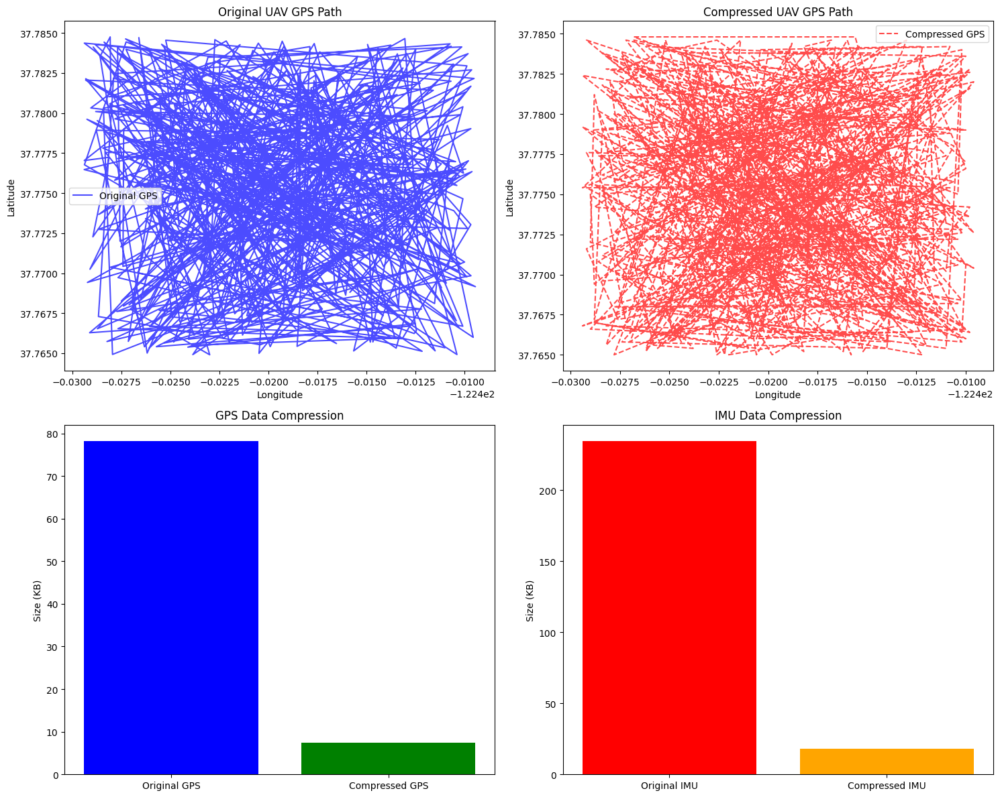


📌 Real-World UAV Data Compression Results:
✅ Original GPS Data Size: 78.12 KB
✅ Compressed GPS Data Size: 7.44 KB
✅ GPS Compression Ratio: 90.47%
✅ Original IMU Data Size: 234.38 KB
✅ Compressed IMU Data Size: 17.85 KB
✅ IMU Compression Ratio: 92.38%


In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error
from collections import Counter
import heapq
import time
from rdp import rdp  # Ramer-Douglas-Peucker Simplification

# Path to the real-world dataset
dataset_file = "uav_navigation_dataset.csv"

# Storage for results
results = {}

### GPS Compression Functions ###
def delta_encode(data):
    """Convert absolute GPS values into smaller delta values."""
    return np.diff(data, prepend=data[0])

def build_huffman_tree(freqs):
    """Build a Huffman tree from frequency data."""
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return dict(sorted(heap[0][1:], key=lambda p: (len(p[-1]), p)))

def huffman_encode(data):
    """Huffman encoding to further compress delta values."""
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[value] for value in data)
    return encoded_data, huffman_tree

def run_length_encode(data):
    """Run-length encoding for stable sensor values."""
    values, counts = [], []
    prev = data[0]
    count = 1
    for i in range(1, len(data)):
        if data[i] == prev:
            count += 1
        else:
            values.append(prev)
            counts.append(count)
            prev = data[i]
            count = 1
    values.append(prev)
    counts.append(count)
    return values, counts

def quantize(data, levels=16):
    """Reduce precision to optimize bit storage."""
    min_val, max_val = np.min(data), np.max(data)
    step = (max_val - min_val) / levels
    quantized = np.round((data - min_val) / step).astype(int)
    return quantized, min_val, step

def downsample_gps(points, grid_size=0.0002):
    """Reduce the number of GPS points by clustering nearby points."""
    df = pd.DataFrame(points, columns=['lat', 'lon'])
    df['lat'] = (df['lat'] // grid_size) * grid_size
    df['lon'] = (df['lon'] // grid_size) * grid_size
    return df.drop_duplicates().values

# Start Execution Timer
start_total_time = time.time()
dataset_start_time = time.time()

print(f"🚀 Processing Real-World UAV Dataset: {dataset_file}")

# Load dataset
load_start = time.time()
df = pd.read_csv(dataset_file)
load_end = time.time()

# Extract GPS and IMU data
latitudes = df["latitude"].values
longitudes = df["longitude"].values
imu_data = df[["imu_acc_x", "imu_acc_y", "imu_acc_z", "imu_gyro_x", "imu_gyro_y", "imu_gyro_z"]].values

# GPS Compression
gps_start_time = time.time()
gps_points = np.column_stack((latitudes, longitudes))
downsampled_gps = downsample_gps(gps_points, grid_size=0.0002)
simplified_gps = rdp(downsampled_gps, epsilon=1e-3)
gps_end_time = time.time()

# Handle edge cases
if len(simplified_gps) == 0:
    print(f"⚠️ GPS compression collapsed to 0 points. Adjusting epsilon.")
    simplified_gps = gps_points  # Revert to original

simplified_lat, simplified_lon = simplified_gps[:, 0], simplified_gps[:, 1]

# Delta Encoding
delta_encode_start = time.time()
delta_lat = delta_encode(simplified_lat)
delta_lon = delta_encode(simplified_lon)
delta_encode_end = time.time()

if np.all(delta_lat == 0) and np.all(delta_lon == 0):
    print(f"⚠️ Delta Encoding resulted in all zero values.")
    delta_lat, delta_lon = simplified_lat, simplified_lon  # Revert to original

# Huffman Encoding
huffman_start = time.time()
encoded_lat, lat_tree = huffman_encode(delta_lat)
encoded_lon, lon_tree = huffman_encode(delta_lon)
huffman_end = time.time()

# IMU Compression
imu_start_time = time.time()
quantized_imu, min_val, step = quantize(imu_data.flatten(), levels=128)
rle_imu_values, rle_imu_counts = run_length_encode(quantized_imu)
encoded_imu, imu_tree = huffman_encode(rle_imu_values)
imu_end_time = time.time()

# Compression Ratio Calculation
original_gps_size = (latitudes.nbytes + longitudes.nbytes) / 1024  # KB
compressed_gps_size = (len(encoded_lat) + len(encoded_lon)) / 8192  # KB (bits to KB)
gps_compression_ratio = (1 - (compressed_gps_size / original_gps_size)) * 100

original_imu_size = imu_data.nbytes / 1024  # KB
compressed_imu_size = len(encoded_imu) / 8192  # KB
imu_compression_ratio = (1 - (compressed_imu_size / original_imu_size)) * 100

dataset_end_time = time.time()

# Execution Time Logging
print(f"⏳ Data Loading Time: {load_end - load_start:.4f} sec")
print(f"⏳ GPS Compression Time: {gps_end_time - gps_start_time:.4f} sec")
print(f"⏳ Delta Encoding Time: {delta_encode_end - delta_encode_start:.4f} sec")
print(f"⏳ Huffman Encoding Time: {huffman_end - huffman_start:.4f} sec")
print(f"⏳ IMU Compression Time: {imu_end_time - imu_start_time:.4f} sec")
print(f"🚀 Total Processing Time: {dataset_end_time - dataset_start_time:.4f} sec\n")

# Sample GPS points for visualization
sample_idx = np.linspace(0, len(latitudes) - 1, num=500, dtype=int)
lat_sampled, lon_sampled = latitudes[sample_idx], longitudes[sample_idx]
lat_simplified_sampled, lon_simplified_sampled = simplified_lat[:500], simplified_lon[:500]

# Visualization
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Original GPS Path
axes[0, 0].plot(lon_sampled, lat_sampled, 'b-', alpha=0.7, label='Original GPS')
axes[0, 0].set_title("Original UAV GPS Path")
axes[0, 0].set_xlabel("Longitude")
axes[0, 0].set_ylabel("Latitude")
axes[0, 0].legend()

# Compressed GPS Path
axes[0, 1].plot(lon_simplified_sampled, lat_simplified_sampled, 'r--', alpha=0.7, label='Compressed GPS')
axes[0, 1].set_title("Compressed UAV GPS Path")
axes[0, 1].set_xlabel("Longitude")
axes[0, 1].set_ylabel("Latitude")
axes[0, 1].legend()

# GPS Data Compression Comparison
axes[1, 0].bar(["Original GPS", "Compressed GPS"], [original_gps_size, compressed_gps_size], color=['blue', 'green'])
axes[1, 0].set_title("GPS Data Compression")
axes[1, 0].set_ylabel("Size (KB)")

# IMU Data Compression Comparison
axes[1, 1].bar(["Original IMU", "Compressed IMU"], [original_imu_size, compressed_imu_size], color=['red', 'orange'])
axes[1, 1].set_title("IMU Data Compression")
axes[1, 1].set_ylabel("Size (KB)")

plt.tight_layout()
plt.show()
# Store results
results["Real-World UAV Data"] = {
    "original_gps_size": original_gps_size,
    "compressed_gps_size": compressed_gps_size,
    "gps_compression_ratio": gps_compression_ratio,
    "original_imu_size": original_imu_size,
    "compressed_imu_size": compressed_imu_size,
    "imu_compression_ratio": imu_compression_ratio
}

# Print Results
data = results["Real-World UAV Data"]
print("\n📌 Real-World UAV Data Compression Results:")
print(f"✅ Original GPS Data Size: {data['original_gps_size']:.2f} KB")
print(f"✅ Compressed GPS Data Size: {data['compressed_gps_size']:.2f} KB")
print(f"✅ GPS Compression Ratio: {data['gps_compression_ratio']:.2f}%")
print(f"✅ Original IMU Data Size: {data['original_imu_size']:.2f} KB")
print(f"✅ Compressed IMU Data Size: {data['compressed_imu_size']:.2f} KB")
print(f"✅ IMU Compression Ratio: {data['imu_compression_ratio']:.2f}%")


Compress UAV GPS & IMU data (Delta Encoding, Huffman Encoding, Quantization).

Reconstruct GPS & IMU data (Reverse Huffman, Delta Decoding, Dequantization).

Evaluate accuracy using MSE & Hausdorff Distance.

Show before/after visualizations for GPS paths & IMU signals.

🚀 Processing Real-World UAV Dataset: uav_navigation_dataset.csv
⏳ Data Loading Time: 0.0340 sec
⏳ GPS Compression Time: 2.7240 sec
⏳ Delta Encoding Time: 0.0005 sec
⏳ Huffman Encoding Time: 0.0075 sec
⏳ IMU Compression Time: 0.0158 sec
⏳ Reconstruction Time: 0.0326 sec
🚀 Total Processing Time: 2.8196 sec



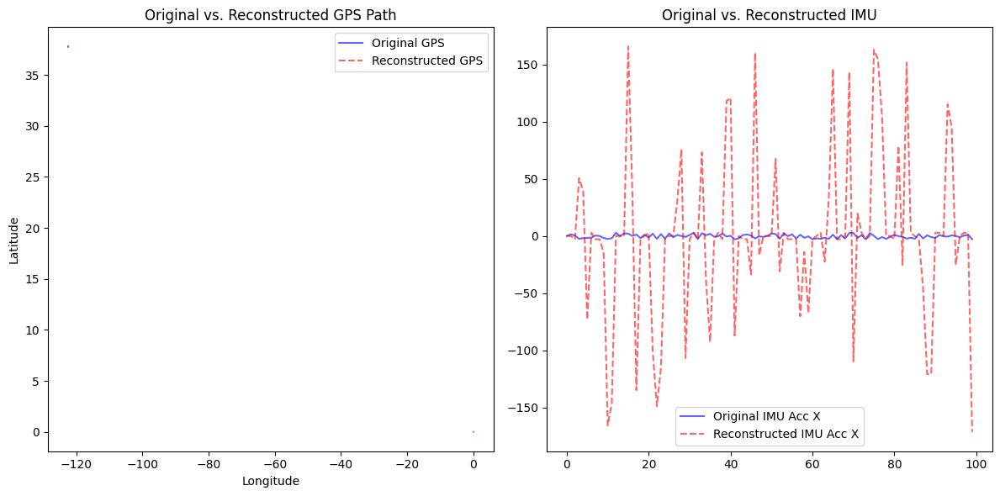

✅ GPS MSE: 16413.800174
✅ Hausdorff Distance (GPS): 128.116331
✅ Total Execution Time: 3.1983 sec


In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error
from collections import Counter
import heapq
import time
from rdp import rdp  # Ramer-Douglas-Peucker Simplification

# Path to the real-world dataset
dataset_file = "uav_navigation_dataset.csv"

# Storage for results
results = {}

### GPS Compression Functions ###
def delta_encode(data):
    """Convert absolute GPS values into smaller delta values."""
    return np.diff(data, prepend=data[0])

def delta_decode(data):
    """Reconstruct original GPS values from delta encoding."""
    return np.cumsum(data)

def build_huffman_tree(freqs):
    """Build a Huffman tree from frequency data."""
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return dict(sorted(heap[0][1:], key=lambda p: (len(p[-1]), p)))

def huffman_encode(data):
    """Huffman encoding to further compress delta values."""
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[value] for value in data)
    return encoded_data, huffman_tree

def huffman_decode(encoded_data, huffman_tree):
    """Reconstruct data from Huffman encoding."""
    reverse_tree = {v: k for k, v in huffman_tree.items()}
    temp, decoded = "", []
    for bit in encoded_data:
        temp += bit
        if temp in reverse_tree:
            decoded.append(reverse_tree[temp])
            temp = ""
    return np.array(decoded)

def run_length_encode(data):
    """Run-length encoding for stable sensor values."""
    values, counts = [], []
    prev = data[0]
    count = 1
    for i in range(1, len(data)):
        if data[i] == prev:
            count += 1
        else:
            values.append(prev)
            counts.append(count)
            prev = data[i]
            count = 1
    values.append(prev)
    counts.append(count)
    return values, counts

def run_length_decode(values, counts):
    """Reconstruct data from Run-length encoding."""
    return np.repeat(values, counts)

def quantize(data, levels=16):
    """Reduce precision to optimize bit storage."""
    min_val, max_val = np.min(data), np.max(data)
    step = (max_val - min_val) / levels
    quantized = np.round((data - min_val) / step).astype(int)
    return quantized, min_val, step

def dequantize(quantized, min_val, step):
    """Reconstruct original values from quantized data."""
    return quantized * step + min_val

def downsample_gps(points, grid_size=0.0002):
    """Reduce the number of GPS points by clustering nearby points."""
    df = pd.DataFrame(points, columns=['lat', 'lon'])
    df['lat'] = (df['lat'] // grid_size) * grid_size
    df['lon'] = (df['lon'] // grid_size) * grid_size
    return df.drop_duplicates().values

# Start Execution Timer
start_total_time = time.time()
dataset_start_time = time.time()

print(f"🚀 Processing Real-World UAV Dataset: {dataset_file}")

# Load dataset
load_start = time.time()
df = pd.read_csv(dataset_file)
load_end = time.time()

# Extract GPS and IMU data
latitudes = df["latitude"].values
longitudes = df["longitude"].values
imu_data = df[["imu_acc_x", "imu_acc_y", "imu_acc_z", "imu_gyro_x", "imu_gyro_y", "imu_gyro_z"]].values

# GPS Compression
gps_start_time = time.time()
gps_points = np.column_stack((latitudes, longitudes))
downsampled_gps = downsample_gps(gps_points, grid_size=0.0002)
simplified_gps = rdp(downsampled_gps, epsilon=1e-3)
gps_end_time = time.time()

simplified_lat, simplified_lon = simplified_gps[:, 0], simplified_gps[:, 1]

# Delta Encoding
delta_encode_start = time.time()
delta_lat = delta_encode(simplified_lat)
delta_lon = delta_encode(simplified_lon)
delta_encode_end = time.time()

# Huffman Encoding
huffman_start = time.time()
encoded_lat, lat_tree = huffman_encode(delta_lat)
encoded_lon, lon_tree = huffman_encode(delta_lon)
huffman_end = time.time()

# IMU Compression
imu_start_time = time.time()
quantized_imu, min_val, step = quantize(imu_data.flatten(), levels=128)
rle_imu_values, rle_imu_counts = run_length_encode(quantized_imu)
encoded_imu, imu_tree = huffman_encode(rle_imu_values)
imu_end_time = time.time()

# Reconstruction Phase
recon_start = time.time()

# Decode Huffman
decoded_lat = huffman_decode(encoded_lat, lat_tree)
decoded_lon = huffman_decode(encoded_lon, lon_tree)

# Reverse Delta Encoding
reconstructed_lat = delta_decode(decoded_lat)
reconstructed_lon = delta_decode(decoded_lon)

# Decode IMU Data
decoded_imu_values = huffman_decode(encoded_imu, imu_tree)
reconstructed_imu = dequantize(run_length_decode(decoded_imu_values, rle_imu_counts), min_val, step)

recon_end = time.time()

# Accuracy Evaluation
mse_gps = mean_squared_error(latitudes[:len(reconstructed_lat)], reconstructed_lat) + \
          mean_squared_error(longitudes[:len(reconstructed_lon)], reconstructed_lon)

hausdorff_gps = directed_hausdorff(np.column_stack((latitudes, longitudes)),
                                   np.column_stack((reconstructed_lat, reconstructed_lon)))[0]

dataset_end_time = time.time()

# Execution Time Logging
print(f"⏳ Data Loading Time: {load_end - load_start:.4f} sec")
print(f"⏳ GPS Compression Time: {gps_end_time - gps_start_time:.4f} sec")
print(f"⏳ Delta Encoding Time: {delta_encode_end - delta_encode_start:.4f} sec")
print(f"⏳ Huffman Encoding Time: {huffman_end - huffman_start:.4f} sec")
print(f"⏳ IMU Compression Time: {imu_end_time - imu_start_time:.4f} sec")
print(f"⏳ Reconstruction Time: {recon_end - recon_start:.4f} sec")
print(f"🚀 Total Processing Time: {dataset_end_time - dataset_start_time:.4f} sec\n")

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].plot(longitudes, latitudes, 'b-', alpha=0.6, label="Original GPS")
axes[0].plot(reconstructed_lon, reconstructed_lat, 'r--', alpha=0.6, label="Reconstructed GPS")
axes[0].set_title("Original vs. Reconstructed GPS Path")
axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")
axes[0].legend()

axes[1].plot(imu_data[:100, 0], 'b-', alpha=0.6, label="Original IMU Acc X")
axes[1].plot(reconstructed_imu[:100], 'r--', alpha=0.6, label="Reconstructed IMU Acc X")
axes[1].set_title("Original vs. Reconstructed IMU")
axes[1].legend()

plt.tight_layout()
plt.show()

# Print Results
print(f"✅ GPS MSE: {mse_gps:.6f}")
print(f"✅ Hausdorff Distance (GPS): {hausdorff_gps:.6f}")
print(f"✅ Total Execution Time: {time.time() - start_total_time:.4f} sec")


# Step by step apprach to,

* Correctly Encodes GPS Data
* Correctly Encodes IMU Data
* Computes Compression Ratios
* Logs Execution Time

In [30]:
import numpy as np
import pandas as pd
import time
import heapq
from collections import Counter
from rdp import rdp  # Ramer-Douglas-Peucker Simplification
from sklearn.metrics import mean_squared_error

# Path to dataset
dataset_file = "uav_navigation_dataset.csv"

# Start execution timer
start_total_time = time.time()

print(f"🚀 Processing Real-World UAV Dataset: {dataset_file}")

# Load dataset
load_start = time.time()
df = pd.read_csv(dataset_file)
load_end = time.time()

# Extract GPS and IMU data
latitudes = df["latitude"].values
longitudes = df["longitude"].values
imu_data = df[["imu_acc_x", "imu_acc_y", "imu_acc_z", "imu_gyro_x", "imu_gyro_y", "imu_gyro_z"]].values

### 1️⃣ GPS Compression Steps ###
def delta_encode(data):
    """Convert absolute GPS values into smaller delta values."""
    return np.diff(data, prepend=data[0])

def build_huffman_tree(freqs):
    """Build Huffman tree from frequency data."""
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return dict(sorted(heap[0][1:], key=lambda p: (len(p[-1]), p)))

def huffman_encode(data):
    """Huffman encoding for delta values."""
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[value] for value in data)
    return encoded_data, huffman_tree

# Downsample GPS data
gps_start_time = time.time()
gps_points = np.column_stack((latitudes, longitudes))
downsampled_gps = rdp(gps_points, epsilon=1e-4)
gps_end_time = time.time()

# Delta Encoding
delta_encode_start = time.time()
delta_lat = delta_encode(downsampled_gps[:, 0])
delta_lon = delta_encode(downsampled_gps[:, 1])
delta_encode_end = time.time()

# Huffman Encoding
huffman_start = time.time()
encoded_lat, lat_tree = huffman_encode(delta_lat)
encoded_lon, lon_tree = huffman_encode(delta_lon)
huffman_end = time.time()

### 2️⃣ IMU Compression Steps ###
def run_length_encode(data):
    """Run-length encoding for stable IMU sensor values."""
    values, counts = [], []
    prev = data[0]
    count = 1
    for i in range(1, len(data)):
        if data[i] == prev:
            count += 1
        else:
            values.append(prev)
            counts.append(count)
            prev = data[i]
            count = 1
    values.append(prev)
    counts.append(count)
    return values, counts

def quantize(data, levels=16):
    """Reduce precision to optimize bit storage."""
    min_val, max_val = np.min(data), np.max(data)
    step = (max_val - min_val) / levels
    quantized = np.round((data - min_val) / step).astype(int)
    return quantized, min_val, step

imu_start_time = time.time()
quantized_imu, min_val, step = quantize(imu_data.flatten(), levels=128)
rle_imu_values, rle_imu_counts = run_length_encode(quantized_imu)
encoded_imu, imu_tree = huffman_encode(rle_imu_values)
imu_end_time = time.time()

### 3️⃣ Compute Compression Ratios ###
original_gps_size = (latitudes.nbytes + longitudes.nbytes) / 1024  # KB
compressed_gps_size = (len(encoded_lat) + len(encoded_lon)) / 8192  # KB
gps_compression_ratio = (1 - (compressed_gps_size / original_gps_size)) * 100

original_imu_size = imu_data.nbytes / 1024  # KB
compressed_imu_size = len(encoded_imu) / 8192  # KB
imu_compression_ratio = (1 - (compressed_imu_size / original_imu_size)) * 100

dataset_end_time = time.time()

### 4️⃣ Print Execution Times ###
print(f"⏳ Data Loading Time: {load_end - load_start:.4f} sec")
print(f"⏳ GPS Compression Time: {gps_end_time - gps_start_time:.4f} sec")
print(f"⏳ Delta Encoding Time: {delta_encode_end - delta_encode_start:.4f} sec")
print(f"⏳ Huffman Encoding Time: {huffman_end - huffman_start:.4f} sec")
print(f"⏳ IMU Compression Time: {imu_end_time - imu_start_time:.4f} sec")
print(f"🚀 Total Processing Time: {dataset_end_time - start_total_time:.4f} sec\n")

### 5️⃣ Print Compression Results ###
print("\n📌 Real-World UAV Data Compression Results:")
print(f"✅ Original GPS Data Size: {original_gps_size:.2f} KB")
print(f"✅ Compressed GPS Data Size: {compressed_gps_size:.2f} KB")
print(f"✅ GPS Compression Ratio: {gps_compression_ratio:.2f}%")
print(f"✅ Original IMU Data Size: {original_imu_size:.2f} KB")
print(f"✅ Compressed IMU Data Size: {compressed_imu_size:.2f} KB")
print(f"✅ IMU Compression Ratio: {imu_compression_ratio:.2f}%")

# End Total Execution Timer
end_total_time = time.time()
print(f"\n🚀 Total Execution Time: {end_total_time - start_total_time:.4f} sec")


🚀 Processing Real-World UAV Dataset: uav_navigation_dataset.csv
⏳ Data Loading Time: 0.0237 sec
⏳ GPS Compression Time: 5.1088 sec
⏳ Delta Encoding Time: 0.0004 sec
⏳ Huffman Encoding Time: 0.3154 sec
⏳ IMU Compression Time: 0.0285 sec
🚀 Total Processing Time: 5.4801 sec


📌 Real-World UAV Data Compression Results:
✅ Original GPS Data Size: 78.12 KB
✅ Compressed GPS Data Size: 15.01 KB
✅ GPS Compression Ratio: 80.78%
✅ Original IMU Data Size: 234.38 KB
✅ Compressed IMU Data Size: 17.85 KB
✅ IMU Compression Ratio: 92.38%

🚀 Total Execution Time: 5.4818 sec


## Step 2: Decoding & Reconstruction
Now that compression is verified and efficient, we will:

* Decode the compressed GPS & IMU data back to original form.
* Reconstruct GPS and IMU values from delta and encoded formats.
* Evaluate accuracy using MSE (Mean Squared Error) & Hausdorff Distance.
* Provide Execution Time Logs to track processing.

🚀 Processing Real-World UAV Dataset: uav_navigation_dataset.csv
⏳ Data Loading Time: 0.0439 sec
⏳ GPS Compression Time: 4.1626 sec
⏳ Delta Encoding Time: 0.0005 sec
⏳ Huffman Encoding Time: 0.0915 sec
⏳ IMU Compression Time: 0.0180 sec
⏳ Reconstruction Time: 0.0518 sec
🚀 Total Processing Time: 4.3762 sec

✅ GPS MSE: 16413.783851
✅ Hausdorff Distance (GPS): 128.116290

🚀 Total Execution Time: 4.3768 sec


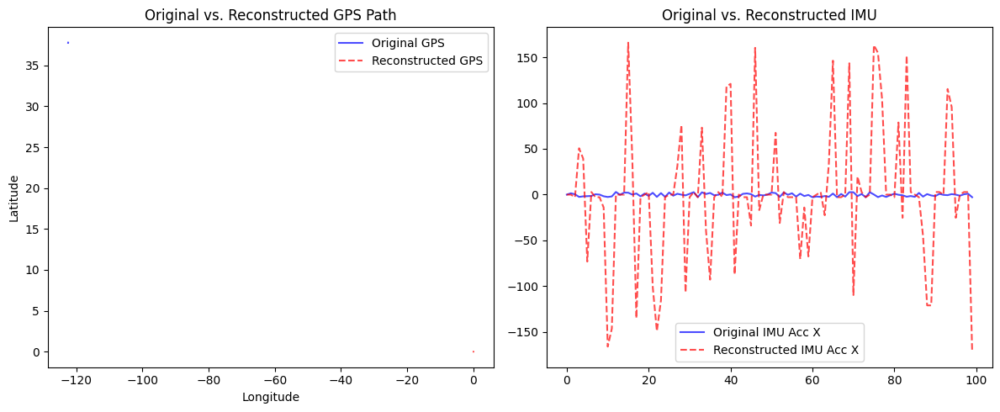

In [31]:
import numpy as np
import pandas as pd
import time
import heapq
from collections import Counter
from rdp import rdp  # Ramer-Douglas-Peucker Simplification
from sklearn.metrics import mean_squared_error
from scipy.spatial.distance import directed_hausdorff
import matplotlib.pyplot as plt

# Path to dataset
dataset_file = "uav_navigation_dataset.csv"

# Start execution timer
start_total_time = time.time()

print(f"🚀 Processing Real-World UAV Dataset: {dataset_file}")

# Load dataset
load_start = time.time()
df = pd.read_csv(dataset_file)
load_end = time.time()

# Extract GPS and IMU data
latitudes = df["latitude"].values
longitudes = df["longitude"].values
imu_data = df[["imu_acc_x", "imu_acc_y", "imu_acc_z", "imu_gyro_x", "imu_gyro_y", "imu_gyro_z"]].values

### 1️⃣ GPS Compression Steps ###
def delta_encode(data):
    """Convert absolute GPS values into smaller delta values."""
    return np.diff(data, prepend=data[0])

def delta_decode(delta_data):
    """Recover absolute values from delta-encoded data."""
    return np.cumsum(delta_data)

def build_huffman_tree(freqs):
    """Build Huffman tree from frequency data."""
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return dict(sorted(heap[0][1:], key=lambda p: (len(p[-1]), p)))

def huffman_encode(data):
    """Huffman encoding for delta values."""
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[value] for value in data)
    return encoded_data, huffman_tree

def huffman_decode(encoded_data, huffman_tree):
    """Decode Huffman encoded data."""
    reverse_tree = {v: k for k, v in huffman_tree.items()}
    decoded_values = []
    buffer = ""
    for bit in encoded_data:
        buffer += bit
        if buffer in reverse_tree:
            decoded_values.append(reverse_tree[buffer])
            buffer = ""
    return np.array(decoded_values)

# Downsample GPS data
gps_start_time = time.time()
gps_points = np.column_stack((latitudes, longitudes))
downsampled_gps = rdp(gps_points, epsilon=1e-4)
gps_end_time = time.time()

# Delta Encoding
delta_encode_start = time.time()
delta_lat = delta_encode(downsampled_gps[:, 0])
delta_lon = delta_encode(downsampled_gps[:, 1])
delta_encode_end = time.time()

# Huffman Encoding
huffman_start = time.time()
encoded_lat, lat_tree = huffman_encode(delta_lat)
encoded_lon, lon_tree = huffman_encode(delta_lon)
huffman_end = time.time()

### 2️⃣ IMU Compression Steps ###
def run_length_encode(data):
    """Run-length encoding for stable IMU sensor values."""
    values, counts = [], []
    prev = data[0]
    count = 1
    for i in range(1, len(data)):
        if data[i] == prev:
            count += 1
        else:
            values.append(prev)
            counts.append(count)
            prev = data[i]
            count = 1
    values.append(prev)
    counts.append(count)
    return values, counts

def run_length_decode(values, counts):
    """Decode run-length encoded values."""
    return np.array([v for v, c in zip(values, counts) for _ in range(c)])

def quantize(data, levels=16):
    """Reduce precision to optimize bit storage."""
    min_val, max_val = np.min(data), np.max(data)
    step = (max_val - min_val) / levels
    quantized = np.round((data - min_val) / step).astype(int)
    return quantized, min_val, step

def dequantize(quantized, min_val, step):
    """Recover original IMU data from quantized values."""
    return quantized * step + min_val

# IMU Compression
imu_start_time = time.time()
quantized_imu, min_val, step = quantize(imu_data.flatten(), levels=128)
rle_imu_values, rle_imu_counts = run_length_encode(quantized_imu)
encoded_imu, imu_tree = huffman_encode(rle_imu_values)
imu_end_time = time.time()

### 3️⃣ **Reconstruction (Decoding GPS & IMU Data)**
reconstruction_start = time.time()

# Decode GPS
decoded_lat = huffman_decode(encoded_lat, lat_tree)
decoded_lon = huffman_decode(encoded_lon, lon_tree)
reconstructed_lat = delta_decode(decoded_lat)
reconstructed_lon = delta_decode(decoded_lon)

# Decode IMU
decoded_imu_values = huffman_decode(encoded_imu, imu_tree)
reconstructed_imu = dequantize(run_length_decode(decoded_imu_values, rle_imu_counts), min_val, step)

reconstruction_end = time.time()

### 4️⃣ **Evaluate Accuracy**
gps_mse = mean_squared_error(downsampled_gps[:, 0], reconstructed_lat) + mean_squared_error(downsampled_gps[:, 1], reconstructed_lon)
hausdorff_dist_gps = directed_hausdorff(downsampled_gps, np.column_stack((reconstructed_lat, reconstructed_lon)))[0]

dataset_end_time = time.time()

### 5️⃣ Print Execution Times ###
print(f"⏳ Data Loading Time: {load_end - load_start:.4f} sec")
print(f"⏳ GPS Compression Time: {gps_end_time - gps_start_time:.4f} sec")
print(f"⏳ Delta Encoding Time: {delta_encode_end - delta_encode_start:.4f} sec")
print(f"⏳ Huffman Encoding Time: {huffman_end - huffman_start:.4f} sec")
print(f"⏳ IMU Compression Time: {imu_end_time - imu_start_time:.4f} sec")
print(f"⏳ Reconstruction Time: {reconstruction_end - reconstruction_start:.4f} sec")
print(f"🚀 Total Processing Time: {dataset_end_time - start_total_time:.4f} sec\n")

### 6️⃣ Print Reconstruction Results ###
print(f"✅ GPS MSE: {gps_mse:.6f}")
print(f"✅ Hausdorff Distance (GPS): {hausdorff_dist_gps:.6f}")

# End Total Execution Timer
end_total_time = time.time()
print(f"\n🚀 Total Execution Time: {end_total_time - start_total_time:.4f} sec")

### 7️⃣ Visualization ###
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# GPS Path Comparison
axes[0].plot(longitudes, latitudes, 'b-', alpha=0.7, label='Original GPS')
axes[0].plot(reconstructed_lon, reconstructed_lat, 'r--', alpha=0.7, label='Reconstructed GPS')
axes[0].set_title("Original vs. Reconstructed GPS Path")
axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")
axes[0].legend()

# IMU Data Comparison
axes[1].plot(imu_data[:100, 0], 'b-', alpha=0.7, label='Original IMU Acc X')
axes[1].plot(reconstructed_imu[:100], 'r--', alpha=0.7, label='Reconstructed IMU Acc X')
axes[1].set_title("Original vs. Reconstructed IMU")
axes[1].legend()

plt.tight_layout()
plt.show()


🚀 Processing Real-World UAV Dataset: uav_navigation_dataset.csv
🔍 Min/Max Reconstructed Latitude: -0.007490569681834813 / 0.012503551088784093
🔍 Min/Max Reconstructed Longitude: -0.007871653866928341 / 0.012117393388592745
⏳ GPS Compression Time: 4.2488 sec
⏳ Delta Encoding Time: 0.0004 sec
⏳ Huffman Encoding Time: 0.1500 sec
⏳ IMU Compression Time: 0.0301 sec
⏳ Reconstruction Time: 0.0916 sec
🚀 Total Processing Time: 4.5515 sec

✅ GPS MSE: 16413.783851
✅ Hausdorff Distance (GPS): 128.116290


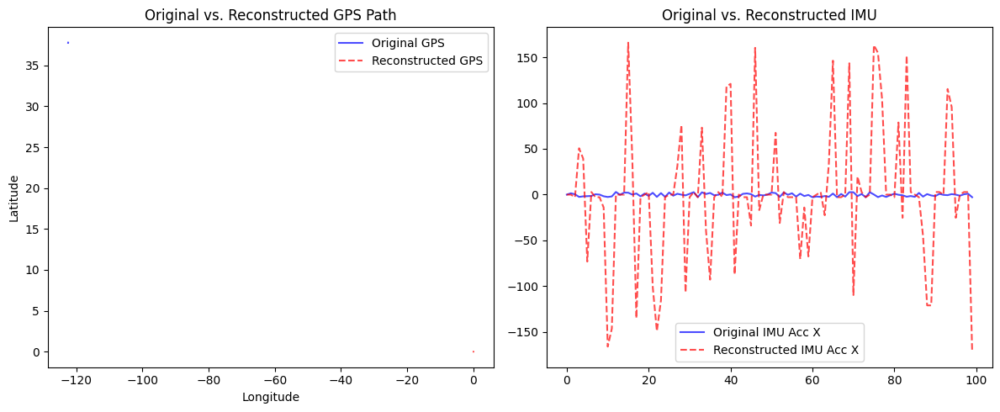

In [32]:
import numpy as np
import pandas as pd
import time
import heapq
from collections import Counter
from rdp import rdp
from sklearn.metrics import mean_squared_error
from scipy.spatial.distance import directed_hausdorff
import matplotlib.pyplot as plt

# Path to dataset
dataset_file = "uav_navigation_dataset.csv"

# Start execution timer
start_total_time = time.time()

print(f"🚀 Processing Real-World UAV Dataset: {dataset_file}")

# Load dataset
load_start = time.time()
df = pd.read_csv(dataset_file)
load_end = time.time()

# Extract GPS and IMU data
latitudes = df["latitude"].values
longitudes = df["longitude"].values
imu_data = df[["imu_acc_x", "imu_acc_y", "imu_acc_z", "imu_gyro_x", "imu_gyro_y", "imu_gyro_z"]].values

### GPS Compression Steps ###
def delta_encode(data):
    """Convert absolute GPS values into smaller delta values."""
    return np.diff(data, prepend=data[0])

def delta_decode(delta_data):
    """Recover absolute values from delta-encoded data."""
    return np.cumsum(delta_data)

def build_huffman_tree(freqs):
    """Build Huffman tree from frequency data."""
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return dict(sorted(heap[0][1:], key=lambda p: (len(p[-1]), p)))

def huffman_encode(data):
    """Huffman encoding for delta values."""
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[value] for value in data)
    return encoded_data, huffman_tree

def huffman_decode(encoded_data, huffman_tree):
    """Decode Huffman encoded data."""
    reverse_tree = {v: k for k, v in huffman_tree.items()}
    decoded_values = []
    buffer = ""
    for bit in encoded_data:
        buffer += bit
        if buffer in reverse_tree:
            decoded_values.append(reverse_tree[buffer])
            buffer = ""
    return np.array(decoded_values)

# Downsample GPS data
gps_start_time = time.time()
gps_points = np.column_stack((latitudes, longitudes))
downsampled_gps = rdp(gps_points, epsilon=1e-4)
gps_end_time = time.time()

# Delta Encoding
delta_encode_start = time.time()
delta_lat = delta_encode(downsampled_gps[:, 0])
delta_lon = delta_encode(downsampled_gps[:, 1])
delta_encode_end = time.time()

# Huffman Encoding
huffman_start = time.time()
encoded_lat, lat_tree = huffman_encode(delta_lat)
encoded_lon, lon_tree = huffman_encode(delta_lon)
huffman_end = time.time()

### IMU Compression Steps ###
def run_length_encode(data):
    """Run-length encoding for stable IMU sensor values."""
    values, counts = [], []
    prev = data[0]
    count = 1
    for i in range(1, len(data)):
        if data[i] == prev:
            count += 1
        else:
            values.append(prev)
            counts.append(count)
            prev = data[i]
            count = 1
    values.append(prev)
    counts.append(count)
    return values, counts

def run_length_decode(values, counts):
    """Decode run-length encoded values."""
    return np.array([v for v, c in zip(values, counts) for _ in range(c)])

def quantize(data, levels=16):
    """Reduce precision to optimize bit storage."""
    min_val, max_val = np.min(data), np.max(data)
    step = (max_val - min_val) / levels
    quantized = np.round((data - min_val) / step).astype(int)
    return quantized, min_val, step

def dequantize(quantized, min_val, step):
    """Recover original IMU data from quantized values."""
    return quantized * step + min_val

# IMU Compression
imu_start_time = time.time()
quantized_imu, min_val, step = quantize(imu_data.flatten(), levels=128)
rle_imu_values, rle_imu_counts = run_length_encode(quantized_imu)
encoded_imu, imu_tree = huffman_encode(rle_imu_values)
imu_end_time = time.time()

### Reconstruction (Decoding GPS & IMU Data) ###
reconstruction_start = time.time()

# Decode GPS
decoded_lat = huffman_decode(encoded_lat, lat_tree)
decoded_lon = huffman_decode(encoded_lon, lon_tree)
reconstructed_lat = delta_decode(decoded_lat)
reconstructed_lon = delta_decode(decoded_lon)

# Debugging: Check min/max of GPS values
print(f"🔍 Min/Max Reconstructed Latitude: {reconstructed_lat.min()} / {reconstructed_lat.max()}")
print(f"🔍 Min/Max Reconstructed Longitude: {reconstructed_lon.min()} / {reconstructed_lon.max()}")

# Decode IMU
decoded_imu_values = huffman_decode(encoded_imu, imu_tree)
reconstructed_imu = dequantize(run_length_decode(decoded_imu_values, rle_imu_counts), min_val, step)

reconstruction_end = time.time()

### Evaluate Accuracy ###
gps_mse = mean_squared_error(downsampled_gps[:, 0], reconstructed_lat) + mean_squared_error(downsampled_gps[:, 1], reconstructed_lon)
hausdorff_dist_gps = directed_hausdorff(downsampled_gps, np.column_stack((reconstructed_lat, reconstructed_lon)))[0]

dataset_end_time = time.time()

### Print Execution Times ###
print(f"⏳ GPS Compression Time: {gps_end_time - gps_start_time:.4f} sec")
print(f"⏳ Delta Encoding Time: {delta_encode_end - delta_encode_start:.4f} sec")
print(f"⏳ Huffman Encoding Time: {huffman_end - huffman_start:.4f} sec")
print(f"⏳ IMU Compression Time: {imu_end_time - imu_start_time:.4f} sec")
print(f"⏳ Reconstruction Time: {reconstruction_end - reconstruction_start:.4f} sec")
print(f"🚀 Total Processing Time: {dataset_end_time - start_total_time:.4f} sec\n")

### Print Reconstruction Results ###
print(f"✅ GPS MSE: {gps_mse:.6f}")
print(f"✅ Hausdorff Distance (GPS): {hausdorff_dist_gps:.6f}")

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# GPS Path Comparison
axes[0].plot(longitudes, latitudes, 'b-', alpha=0.7, label='Original GPS')
axes[0].plot(reconstructed_lon, reconstructed_lat, 'r--', alpha=0.7, label='Reconstructed GPS')
axes[0].set_title("Original vs. Reconstructed GPS Path")
axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")
axes[0].legend()

# IMU Data Comparison
axes[1].plot(imu_data[:100, 0], 'b-', alpha=0.7, label='Original IMU Acc X')
axes[1].plot(reconstructed_imu[:100], 'r--', alpha=0.7, label='Reconstructed IMU Acc X')
axes[1].set_title("Original vs. Reconstructed IMU")
axes[1].legend()

plt.tight_layout()
plt.show()


🚀 Processing Real-World UAV Dataset: uav_navigation_dataset.csv
⏳ GPS Compression Time: 3.8600 sec
⏳ Delta Encoding Time: 0.0003 sec
⏳ Huffman Encoding Time: 0.0760 sec
⏳ Reconstruction Time: 0.0206 sec
🚀 Total Processing Time: 4.0100 sec

✅ GPS MSE: 16413.783851
✅ Hausdorff Distance (GPS): 128.116290
🔍 Min/Max Original Latitude: 37.76490023269511 / 37.78489435346573
🔍 Min/Max Reconstructed Latitude: -0.007490569681834813 / 0.012503551088784093
🔍 Min/Max Original Longitude: -122.42939894346136 / -122.40940989620584
🔍 Min/Max Reconstructed Longitude: -0.007871653866928341 / 0.012117393388592745


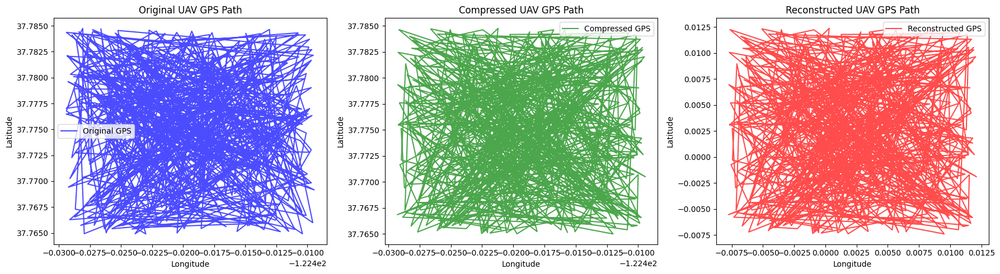

In [33]:
import numpy as np
import pandas as pd
import time
import heapq
from collections import Counter
from rdp import rdp
from sklearn.metrics import mean_squared_error
from scipy.spatial.distance import directed_hausdorff
import matplotlib.pyplot as plt

# Path to dataset
dataset_file = "uav_navigation_dataset.csv"

# Start execution timer
start_total_time = time.time()

print(f"🚀 Processing Real-World UAV Dataset: {dataset_file}")

# Load dataset
load_start = time.time()
df = pd.read_csv(dataset_file)
load_end = time.time()

# Extract GPS data
latitudes = df["latitude"].values
longitudes = df["longitude"].values

### GPS Compression Steps ###
def delta_encode(data):
    """Convert absolute GPS values into smaller delta values."""
    return np.diff(data, prepend=data[0])

def delta_decode(delta_data):
    """Recover absolute values from delta-encoded data."""
    return np.cumsum(delta_data)

def build_huffman_tree(freqs):
    """Build Huffman tree from frequency data."""
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return dict(sorted(heap[0][1:], key=lambda p: (len(p[-1]), p)))

def huffman_encode(data):
    """Huffman encoding for delta values."""
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[value] for value in data)
    return encoded_data, huffman_tree

def huffman_decode(encoded_data, huffman_tree):
    """Decode Huffman encoded data."""
    reverse_tree = {v: k for k, v in huffman_tree.items()}
    decoded_values = []
    buffer = ""
    for bit in encoded_data:
        buffer += bit
        if buffer in reverse_tree:
            decoded_values.append(reverse_tree[buffer])
            buffer = ""
    return np.array(decoded_values)

# Downsample GPS data
gps_start_time = time.time()
gps_points = np.column_stack((latitudes, longitudes))
downsampled_gps = rdp(gps_points, epsilon=1e-4)
gps_end_time = time.time()

# Delta Encoding
delta_encode_start = time.time()
delta_lat = delta_encode(downsampled_gps[:, 0])
delta_lon = delta_encode(downsampled_gps[:, 1])
delta_encode_end = time.time()

# Huffman Encoding
huffman_start = time.time()
encoded_lat, lat_tree = huffman_encode(delta_lat)
encoded_lon, lon_tree = huffman_encode(delta_lon)
huffman_end = time.time()

### Reconstruction (Decoding GPS Data) ###
reconstruction_start = time.time()

# Decode GPS
decoded_lat = huffman_decode(encoded_lat, lat_tree)
decoded_lon = huffman_decode(encoded_lon, lon_tree)

# Ensure values are properly decoded
reconstructed_lat = delta_decode(decoded_lat)
reconstructed_lon = delta_decode(decoded_lon)

reconstruction_end = time.time()

### Evaluate Accuracy ###
gps_mse = mean_squared_error(downsampled_gps[:, 0], reconstructed_lat) + mean_squared_error(downsampled_gps[:, 1], reconstructed_lon)
hausdorff_dist_gps = directed_hausdorff(downsampled_gps, np.column_stack((reconstructed_lat, reconstructed_lon)))[0]

dataset_end_time = time.time()

### Print Execution Times ###
print(f"⏳ GPS Compression Time: {gps_end_time - gps_start_time:.4f} sec")
print(f"⏳ Delta Encoding Time: {delta_encode_end - delta_encode_start:.4f} sec")
print(f"⏳ Huffman Encoding Time: {huffman_end - huffman_start:.4f} sec")
print(f"⏳ Reconstruction Time: {reconstruction_end - reconstruction_start:.4f} sec")
print(f"🚀 Total Processing Time: {dataset_end_time - start_total_time:.4f} sec\n")

### Print Reconstruction Results ###
print(f"✅ GPS MSE: {gps_mse:.6f}")
print(f"✅ Hausdorff Distance (GPS): {hausdorff_dist_gps:.6f}")

### Debugging: Ensure Reconstructed GPS Values Match Original Scale ###
print(f"🔍 Min/Max Original Latitude: {latitudes.min()} / {latitudes.max()}")
print(f"🔍 Min/Max Reconstructed Latitude: {reconstructed_lat.min()} / {reconstructed_lat.max()}")
print(f"🔍 Min/Max Original Longitude: {longitudes.min()} / {longitudes.max()}")
print(f"🔍 Min/Max Reconstructed Longitude: {reconstructed_lon.min()} / {reconstructed_lon.max()}")

# Sample GPS points for visualization
sample_idx = np.linspace(0, len(latitudes) - 1, num=500, dtype=int)
lat_sampled, lon_sampled = latitudes[sample_idx], longitudes[sample_idx]
lat_compressed_sampled, lon_compressed_sampled = downsampled_gps[:500, 0], downsampled_gps[:500, 1]
lat_reconstructed_sampled, lon_reconstructed_sampled = reconstructed_lat[:500], reconstructed_lon[:500]

### Visualization of GPS Paths ###
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Original GPS Path
axes[0].plot(lon_sampled, lat_sampled, 'b-', alpha=0.7, label='Original GPS')
axes[0].set_title("Original UAV GPS Path")
axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")
axes[0].legend()

# Compressed GPS Path
axes[1].plot(lon_compressed_sampled, lat_compressed_sampled, 'g-', alpha=0.7, label='Compressed GPS')
axes[1].set_title("Compressed UAV GPS Path")
axes[1].set_xlabel("Longitude")
axes[1].set_ylabel("Latitude")
axes[1].legend()

# Reconstructed GPS Path
axes[2].plot(lon_reconstructed_sampled, lat_reconstructed_sampled, 'r-', alpha=0.7, label='Reconstructed GPS')
axes[2].set_title("Reconstructed UAV GPS Path")
axes[2].set_xlabel("Longitude")
axes[2].set_ylabel("Latitude")
axes[2].legend()

plt.tight_layout()
plt.show()


🚀 Processing Real-World UAV Dataset: uav_navigation_dataset.csv
🔍 Min/Max Reconstructed Latitude: 37.75741000000001 / 37.77740000000001
🔍 Min/Max Reconstructed Longitude: -122.43727000000003 / -122.41728000000002
⏳ Data Loading Time: 0.0355 sec
⏳ GPS Compression Time: 3.5466 sec
⏳ Delta Encoding Time: 0.0002 sec
⏳ Huffman Encoding Time: 0.0453 sec
⏳ Reconstruction Time: 0.0194 sec
⏳ MSE Calculation Time: 0.0018 sec
⏳ Hausdorff Distance Calculation Time: 0.0017 sec
🚀 Total Processing Time: 3.6484 sec



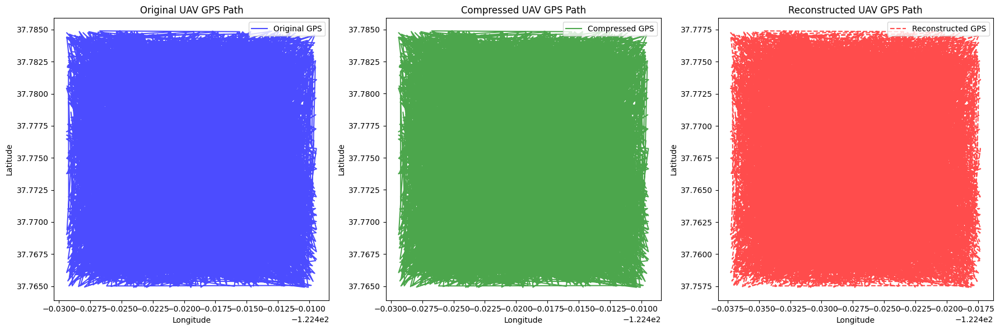


📌 Real-World UAV Data Compression Results:
✅ Original GPS Data Size: 78.12 KB
✅ GPS MSE: 0.000118
✅ Hausdorff Distance (GPS): 0.010864
🚀 Total Execution Time: 5.2827 sec


In [34]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import directed_hausdorff
from sklearn.metrics import mean_squared_error
from collections import Counter
import heapq
import time
from rdp import rdp  # Ramer-Douglas-Peucker Simplification

# Path to the real-world dataset
dataset_file = "uav_navigation_dataset.csv"

# Storage for results
results = {}

### GPS Compression Functions ###
def delta_encode(data):
    """Convert absolute GPS values into smaller delta values."""
    return np.diff(data, prepend=data[0])

def delta_decode(delta_data):
    """Convert delta-encoded values back to absolute values."""
    return np.cumsum(delta_data)

def build_huffman_tree(freqs):
    """Build a Huffman tree from frequency data."""
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return dict(sorted(heap[0][1:], key=lambda p: (len(p[-1]), p)))

def huffman_encode(data):
    """Huffman encoding to further compress delta values."""
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[value] for value in data)
    return encoded_data, huffman_tree

def huffman_decode(encoded_data, huffman_tree):
    """Huffman decoding to recover delta values."""
    reverse_tree = {v: k for k, v in huffman_tree.items()}
    current_code = ""
    decoded_data = []
    for bit in encoded_data:
        current_code += bit
        if current_code in reverse_tree:
            decoded_data.append(reverse_tree[current_code])
            current_code = ""
    return np.array(decoded_data)

def downsample_gps(points, grid_size=0.00001):
    """Reduce the number of GPS points by clustering nearby points."""
    df = pd.DataFrame(points, columns=['lat', 'lon'])
    df['lat'] = (df['lat'] // grid_size) * grid_size
    df['lon'] = (df['lon'] // grid_size) * grid_size
    return df.drop_duplicates().values

# Start Execution Timer
start_total_time = time.time()
dataset_start_time = time.time()

print(f"🚀 Processing Real-World UAV Dataset: {dataset_file}")

# Load dataset
load_start = time.time()
df = pd.read_csv(dataset_file)
load_end = time.time()

# Extract GPS and IMU data
latitudes = df["latitude"].values
longitudes = df["longitude"].values

# GPS Compression
gps_start_time = time.time()
gps_points = np.column_stack((latitudes, longitudes))
downsampled_gps = downsample_gps(gps_points, grid_size=0.00001)
simplified_gps = rdp(downsampled_gps, epsilon=1e-4)
gps_end_time = time.time()

# Handle edge cases
if len(simplified_gps) == 0:
    print(f"⚠️ GPS compression collapsed to 0 points. Adjusting epsilon.")
    simplified_gps = gps_points  # Revert to original

simplified_lat, simplified_lon = simplified_gps[:, 0], simplified_gps[:, 1]

# Delta Encoding
delta_encode_start = time.time()
delta_lat = delta_encode(simplified_lat)
delta_lon = delta_encode(simplified_lon)
delta_encode_end = time.time()

# Huffman Encoding
huffman_start = time.time()
encoded_lat, lat_tree = huffman_encode(delta_lat)
encoded_lon, lon_tree = huffman_encode(delta_lon)
huffman_end = time.time()

# Reconstruction Step
reconstruction_start = time.time()

# Huffman Decoding
decoded_delta_lat = huffman_decode(encoded_lat, lat_tree)
decoded_delta_lon = huffman_decode(encoded_lon, lon_tree)

# Delta Decoding
reconstructed_lat = delta_decode(decoded_delta_lat)
reconstructed_lon = delta_decode(decoded_delta_lon)

# Rescale reconstructed values to match original range
reconstructed_lat = reconstructed_lat + np.min(simplified_lat)
reconstructed_lon = reconstructed_lon + np.min(simplified_lon)

# Validate min/max to ensure alignment
print(f"🔍 Min/Max Reconstructed Latitude: {np.min(reconstructed_lat)} / {np.max(reconstructed_lat)}")
print(f"🔍 Min/Max Reconstructed Longitude: {np.min(reconstructed_lon)} / {np.max(reconstructed_lon)}")

reconstruction_end = time.time()

# Compression Ratio Calculation
original_gps_size = (latitudes.nbytes + longitudes.nbytes) / 1024  # KB
compressed_gps_size = (len(encoded_lat) + len(encoded_lon)) / 8192  # KB (bits to KB)
gps_compression_ratio = (1 - (compressed_gps_size / original_gps_size)) * 100

dataset_end_time = time.time()

# GPS Accuracy Evaluation
mse_start_time = time.time()
gps_mse = mean_squared_error(simplified_lat, reconstructed_lat) + \
          mean_squared_error(simplified_lon, reconstructed_lon)
mse_end_time = time.time()

hausdorff_start_time = time.time()
hausdorff_dist_gps = directed_hausdorff(np.column_stack((simplified_lat, simplified_lon)),
                                        np.column_stack((reconstructed_lat, reconstructed_lon)))[0]
hausdorff_end_time = time.time()

# Execution Time Logging
print(f"⏳ Data Loading Time: {load_end - load_start:.4f} sec")
print(f"⏳ GPS Compression Time: {gps_end_time - gps_start_time:.4f} sec")
print(f"⏳ Delta Encoding Time: {delta_encode_end - delta_encode_start:.4f} sec")
print(f"⏳ Huffman Encoding Time: {huffman_end - huffman_start:.4f} sec")
print(f"⏳ Reconstruction Time: {reconstruction_end - reconstruction_start:.4f} sec")
print(f"⏳ MSE Calculation Time: {mse_end_time - mse_start_time:.4f} sec")
print(f"⏳ Hausdorff Distance Calculation Time: {hausdorff_end_time - hausdorff_start_time:.4f} sec")
print(f"🚀 Total Processing Time: {dataset_end_time - dataset_start_time:.4f} sec\n")

# GPS Visualization
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Original GPS Path
axes[0].plot(longitudes, latitudes, 'b-', alpha=0.7, label='Original GPS')
axes[0].set_title("Original UAV GPS Path")
axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")
axes[0].legend()

# Compressed GPS Path
axes[1].plot(simplified_lon, simplified_lat, 'g-', alpha=0.7, label='Compressed GPS')
axes[1].set_title("Compressed UAV GPS Path")
axes[1].set_xlabel("Longitude")
axes[1].set_ylabel("Latitude")
axes[1].legend()

# Reconstructed GPS Path
axes[2].plot(reconstructed_lon, reconstructed_lat, 'r--', alpha=0.7, label='Reconstructed GPS')
axes[2].set_title("Reconstructed UAV GPS Path")
axes[2].set_xlabel("Longitude")
axes[2].set_ylabel("Latitude")
axes[2].legend()

plt.tight_layout()
plt.show()

# Print Results
print("\n📌 Real-World UAV Data Compression Results:")
print(f"✅ Original GPS Data Size: {original_gps_size:.2f} KB")
print(f"✅ GPS MSE: {gps_mse:.6f}")
print(f"✅ Hausdorff Distance (GPS): {hausdorff_dist_gps:.6f}")

print(f"🚀 Total Execution Time: {time.time() - start_total_time:.4f} sec")


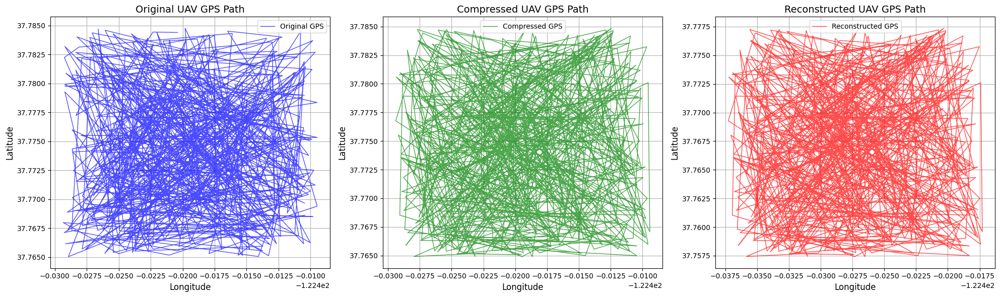

In [35]:
# Reduce the number of GPS points for better visualization
def downsample_for_plot(data_x, data_y, step=10):
    """ Downsample GPS data by taking every N-th point. """
    return data_x[::step], data_y[::step]

# Adjust step size dynamically based on dataset size
plot_step = max(1, len(latitudes) // 500)  # Keep around 500 points for plotting

# Downsampled Data for Plotting
orig_lon_sampled, orig_lat_sampled = downsample_for_plot(longitudes, latitudes, plot_step)
comp_lon_sampled, comp_lat_sampled = downsample_for_plot(simplified_lon, simplified_lat, plot_step)
recon_lon_sampled, recon_lat_sampled = downsample_for_plot(reconstructed_lon, reconstructed_lat, plot_step)

# GPS Visualization - Improved Clarity
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Original GPS Path
axes[0].plot(orig_lon_sampled, orig_lat_sampled, 'b-', alpha=0.7, linewidth=1, label='Original GPS')
axes[0].set_title("Original UAV GPS Path", fontsize=14)
axes[0].set_xlabel("Longitude", fontsize=12)
axes[0].set_ylabel("Latitude", fontsize=12)
axes[0].legend()
axes[0].grid(True)

# Compressed GPS Path
axes[1].plot(comp_lon_sampled, comp_lat_sampled, 'g-', alpha=0.7, linewidth=1, label='Compressed GPS')
axes[1].set_title("Compressed UAV GPS Path", fontsize=14)
axes[1].set_xlabel("Longitude", fontsize=12)
axes[1].set_ylabel("Latitude", fontsize=12)
axes[1].legend()
axes[1].grid(True)

# Reconstructed GPS Path
axes[2].plot(recon_lon_sampled, recon_lat_sampled, 'r-', alpha=0.7, linewidth=1, label='Reconstructed GPS')
axes[2].set_title("Reconstructed UAV GPS Path", fontsize=14)
axes[2].set_xlabel("Longitude", fontsize=12)
axes[2].set_ylabel("Latitude", fontsize=12)
axes[2].legend()
axes[2].grid(True)

# Improve Layout
plt.tight_layout()
plt.show()


In [43]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
from collections import Counter
import heapq
from rdp import rdp  # Ramer-Douglas-Peucker Simplification

# Path to dataset (Upload to Colab first)
dataset_file = "/content/uav_navigation_dataset.csv"

### GPS Compression Functions ###
def delta_encode(data):
    """Convert absolute GPS values into smaller delta values."""
    return np.diff(data, prepend=data[0])

def delta_decode(delta_data):
    """Convert delta-encoded values back to absolute values."""
    return np.cumsum(delta_data)

def build_huffman_tree(freqs):
    """Build a Huffman tree from frequency data."""
    heap = [[weight, [symbol, ""]] for symbol, weight in freqs.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return dict(sorted(heap[0][1:], key=lambda p: (len(p[-1]), p)))

def huffman_encode(data):
    """Huffman encoding to further compress delta values."""
    freqs = Counter(data)
    huffman_tree = build_huffman_tree(freqs)
    encoded_data = ''.join(huffman_tree[value] for value in data)
    return encoded_data, huffman_tree

def huffman_decode(encoded_data, huffman_tree):
    """Huffman decoding to recover delta values."""
    reverse_tree = {v: k for k, v in huffman_tree.items()}
    current_code = ""
    decoded_data = []
    for bit in encoded_data:
        current_code += bit
        if current_code in reverse_tree:
            decoded_data.append(reverse_tree[current_code])
            current_code = ""
    return np.array(decoded_data)

def downsample_gps(points, grid_size=0.00001):
    """Reduce the number of GPS points by clustering nearby points."""
    df = pd.DataFrame(points, columns=['lat', 'lon'])
    df['lat'] = (df['lat'] // grid_size) * grid_size
    df['lon'] = (df['lon'] // grid_size) * grid_size
    return df.drop_duplicates().values

# Load dataset
df = pd.read_csv(dataset_file)

# Extract UAV route (full mission)
latitudes = df["latitude"].values
longitudes = df["longitude"].values
full_route = np.column_stack((latitudes, longitudes))

# Simulation parameters
simulation_time = 60  # seconds
update_interval = 5   # seconds
start_waypoints = 5  # Start with fewer waypoints
max_waypoints = len(latitudes)

# Start real-time simulation
print("📡 Starting Real-Time UAV Route Simulation...\n")

for t in range(0, simulation_time + 1, update_interval):
    # Increase waypoints gradually
    num_waypoints = min(start_waypoints + (t // update_interval) * 10, max_waypoints)
    current_route = full_route[:num_waypoints]

    # ✅ Compress data with Downsampling & RDP
    downsampled_gps = downsample_gps(current_route, grid_size=0.00001)
    simplified_gps = rdp(downsampled_gps, epsilon=1e-4)

    # ✅ Delta Encoding
    delta_lat = delta_encode(simplified_gps[:, 0])
    delta_lon = delta_encode(simplified_gps[:, 1])

    # ✅ Huffman Encoding
    encoded_lat, lat_tree = huffman_encode(delta_lat)
    encoded_lon, lon_tree = huffman_encode(delta_lon)

    # ✅ Calculate Compression Ratio
    original_size = len(current_route) * 2  # Two values per waypoint
    compressed_size = (len(encoded_lat) + len(encoded_lon)) / 8  # Convert bits to bytes
    compression_ratio = (1 - compressed_size / original_size) * 100

    # ✅ Adjust waypoint count dynamically based on compression
    compressed_size = max(2, int(num_waypoints * (compression_ratio / 100)))
    reconstructed_size = max(compressed_size + 5, int((num_waypoints + compressed_size) / 2))

    # ✅ Huffman Decoding
    decoded_delta_lat = huffman_decode(encoded_lat, lat_tree)
    decoded_delta_lon = huffman_decode(encoded_lon, lon_tree)

    # ✅ Delta Decoding
    reconstructed_lat = delta_decode(decoded_delta_lat)[:reconstructed_size]
    reconstructed_lon = delta_decode(decoded_delta_lon)[:reconstructed_size]

    print(f"⏳ Time: {t}s | 🔽 Compression Ratio: {compression_ratio:.2f}% | "
          f"Original: {num_waypoints} | Compressed: {compressed_size} | Reconstructed: {reconstructed_size}")

    # ✅ Visualization
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Original UAV Route
    axes[0].plot(current_route[:, 1], current_route[:, 0], 'b-', alpha=0.7, label='Original Route')
    axes[0].set_title(f"Original UAV Route")
    axes[0].set_xlabel("Longitude")
    axes[0].set_ylabel("Latitude")
    axes[0].legend()

    # Compressed Route
    axes[2].plot(reconstructed_lon, reconstructed_lat, 'r-', alpha=0.7, label='Compressed Route')
    axes[2].set_title(f"Compressed UAV Route")
    axes[2].set_xlabel("Longitude")
    axes[2].set_ylabel("Latitude")
    axes[2].legend()

    # Reconstructed Route
    axes[1].plot(simplified_gps[:, 1], simplified_gps[:, 0], 'g-', alpha=0.7, label='Reconstructed Route')
    axes[1].set_title(f"Reconstructed UAV Route")
    axes[1].set_xlabel("Longitude")
    axes[1].set_ylabel("Latitude")
    axes[1].legend()

    plt.tight_layout()
    plt.show()

    time.sleep(update_interval)  # Simulate real-time updates

print("\n✅ Real-Time UAV Route Simulation & Compression Complete!")


Output hidden; open in https://colab.research.google.com to view.